<a href="https://colab.research.google.com/github/rajeshkpandey/AWESOME-FER/blob/master/Epidemics_ABM_python_7iterations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

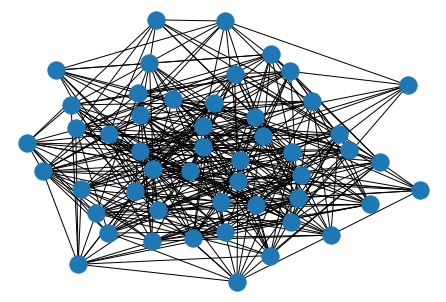

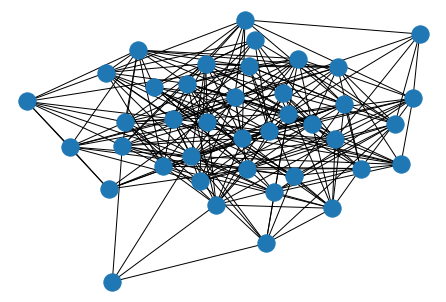

In [1]:
#Erdos-Renyi Graph in Networkx
import random
import copy
from networkx import nx
import matplotlib.pyplot as plt

N = 50  # 50 Indian Cities
K = 10000  # 10000 Agents(people under observation on SIR modeling)
#M = 30  # 30 Edges
NN = 40 # 40 nodes (contact places) of Cities


#Graph = nx.gnm_random_graph(N, M)

P = .3      #Probabibilty for Node Connection in random graph
PP = .3
Graph = nx.erdos_renyi_graph(N,P) # Use Networkx to generate a random graph of N nodes being connected with probability P.
GraphN = nx.erdos_renyi_graph(NN,PP)


nx.draw(Graph)
plt.show()
nx.draw(GraphN)
plt.show()

In [2]:
A = nx.adjacency_matrix(Graph)
Adjacency_matrix = A.todense()
AN = nx.adjacency_matrix(GraphN)
Adjacency_matrixN = AN.todense()
print(Adjacency_matrix)
print(Adjacency_matrixN)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 1 0 0]
 [0 0 0 ... 0 1 1]
 ...
 [0 1 0 ... 0 0 1]
 [0 0 1 ... 0 0 1]
 [0 0 1 ... 1 1 0]]
[[0 1 1 ... 0 0 0]
 [1 0 0 ... 1 0 1]
 [1 0 0 ... 1 0 0]
 ...
 [0 1 1 ... 0 0 1]
 [0 0 0 ... 0 0 0]
 [0 1 0 ... 1 0 0]]


In [3]:
#Empty Node Dictionary [ A Dictionary consisting list of agent states on Graph Nodes]
Node = {}
print(Node)
for i in range(N):
  for j in range(NN):
    Node[i*NN+j] = list()
#print(Node)
print(len(Node))


{}
2000


In [4]:
#Adding Viral_Index Randomly
for i in range(N):
  for j in range(NN):
    Viral_load=0
    Node[i*NN+j].append({'Viral_load' : Viral_load})
    Node[i*NN+j].append({'S' : 0})
    Node[i*NN+j].append({'I' : 0})
    Node[i*NN+j].append({'R' : 0})
#print(Node)
print(len(Node))


2000


In [5]:
#Initailizing randomly infection state [0 shows Susceptible, 1 shows Infected, and 2 shows Recovered]
Agent = {}
for k in range(K):
  Agent[k] = list() 
for k in range(K):
  Rand_node=random.randint(0,N-1)
  Neighbors = list(Graph.neighbors(Rand_node))
  Rand_nodeN=random.randint(0,NN-1)
  First_nodeN = random.randint(0,NN-1)
  Second_nodeN = random.randint(0,NN-1)
  Rand_state=random.choices([0,1],weights=(98,2),k=1)[0]
  Rand_neighbors = list(GraphN.neighbors(Rand_nodeN))
  Rand_neighbors1 = list(GraphN.neighbors(First_nodeN))
  Rand_neighbors2 = list(GraphN.neighbors(Second_nodeN))
  if len(Rand_neighbors) > 0:
    Rand_nodeN1=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN1)
  else:
    Rand_nodeN1=Rand_nodeN
  
  if len(Rand_neighbors) > 0:
    Rand_nodeN2=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN2)
    if Rand_nodeN2 not in list(GraphN.neighbors(Rand_nodeN1)):
      Rand_nodeN2=Rand_nodeN1
  else:
    Rand_nodeN2=Rand_nodeN1
  
  if Rand_state == 0:
    Node[Rand_node*NN+Rand_nodeN][1]['S']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})
  elif Rand_state == 1:
    Node[Rand_node*NN+Rand_nodeN][2]['I']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state, 'V_l' : 1})
    Agent[k].append({'State' : Rand_state, 'V_l' : 1 })
  else:
    Node[Rand_node*NN+Rand_nodeN][3]['R']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})

  Agent[k].append({'Home_node' : Rand_node})
  Agent[k].append({'Home_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
  
  if len(Neighbors) > 0:
    First_node = random.choice(Neighbors)
    Neighbors.remove(First_node)
  else:
    First_node = Rand_node
  if len(Neighbors) > 0:
    Second_node = random.choice(Neighbors)
  else:
    Second_node = Rand_node

  if len(Rand_neighbors1) > 0:
    First_nodeN1=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN1)
  else:
    First_nodeN1=First_nodeN
  
  if len(Rand_neighbors1) > 0:
    First_nodeN2=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN2)
    if First_nodeN2 not in list(GraphN.neighbors(First_nodeN1)):
      First_nodeN2=First_nodeN1
  else:
    First_nodeN2=First_nodeN1

  if len(Rand_neighbors2) > 0:
    Second_nodeN1=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN1)
  else:
    Second_nodeN1=Second_nodeN
  
  if len(Rand_neighbors2) > 0:
    Second_nodeN2=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN2)
    if Second_nodeN2 not in list(GraphN.neighbors(Second_nodeN1)):
      Second_nodeN2=Second_nodeN1
  else:
    Second_nodeN2=Second_nodeN1

  Agent[k].append({'First_node' : First_node})
  Agent[k].append({'First_nodeN' : [First_nodeN, First_nodeN1, First_nodeN2]})
  Agent[k].append({'Second_node' : Second_node})
  Agent[k].append({'Second_nodeN' : [Second_nodeN, Second_nodeN1, Second_nodeN2]})
  Agent[k].append({'Current_node' : Rand_node})
  Agent[k].append({'Current_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
#print(Node)
#print(Agent)

In [6]:
print(len(Graph.nodes))
print(len(GraphN.nodes))

50
40


In [7]:
#Random Walk Implementation
def random_walk(Graph=Graph, GraphN=GraphN, Node=Node, Agent=Agent, num_walks=1, num_steps=1):
    walks = list()
    Node_next = {}
    Agent_next = {}
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j] = list() 
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j].append({'Viral_load' : copy.deepcopy(Node[i*len(GraphN.nodes)+j][0]['Viral_load'])})
        Node_next[i*len(GraphN.nodes)+j].append({'S' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'I' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'R' : 0})
    for i in range(len(Agent)):
      Agent_next[i] = list()
    Agent_next = copy.deepcopy(Agent)
    count_nomove=0
    count_move_first=0
    count_move_second=0
    count_stay_home=0
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        for agent in list(range(4,len(Node[i*len(GraphN.nodes)+j]))):
          a_id = list(Node[i*len(GraphN.nodes)+j][agent].keys())[0]
          #print(a_id)
          #print(Agent[a_id])
          for walk in range(num_walks):
              curr_walk = [i*len(GraphN.nodes)+j]
              cur = i*len(GraphN.nodes)+j
              for step in range(num_steps):
                  neighbors = []
                  neighbors.append(Agent_next[a_id][1]['Home_node'])
                  neighbors.append(Agent_next[a_id][3]['First_node'])
                  neighbors.append(Agent_next[a_id][5]['Second_node'])

                  if len(neighbors) > 0:                       
                      PNN2 = .1*(Node[Agent_next[a_id][8]['Current_nodeN'][1]][2]['I']/(Node[Agent_next[a_id][8]['Current_nodeN'][1]][2]['I']**2+1))
                      PNN3 = .1*(Node[Agent_next[a_id][8]['Current_nodeN'][2]][2]['I']/(Node[Agent_next[a_id][8]['Current_nodeN'][2]][2]['I']**2+1))
                      PNN1 = 1 - PNN2 - PNN3
                      next = random.choices(neighbors,weights=(PNN1,PNN2,PNN3), k=1)[0] 
                      if next == Agent_next[a_id][7]['Current_node']:
                        #print("no movement")
                        count_nomove+=1

                      else:
                        if next == Agent_next[a_id][3]['First_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][3]['First_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][4]['First_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][4]['First_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][4]['First_nodeN'][2]
                          count_move_first+=1
                        elif next == Agent_next[a_id][5]['Second_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][5]['Second_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][6]['Second_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][6]['Second_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][6]['Second_nodeN'][2]
                          count_move_second+=1
                        elif next == Agent_next[a_id][1]['Home_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][1]['Home_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][2]['Home_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][2]['Home_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][2]['Home_nodeN'][2]
                          count_stay_home+=1
                      
                      PNN2 = .3*(Node[Agent_next[a_id][8]['Current_nodeN'][1]][2]['I']/(Node[Agent_next[a_id][8]['Current_nodeN'][1]][2]['I']**2+1))
                      PNN3 = .3*(Node[Agent_next[a_id][8]['Current_nodeN'][2]][2]['I']/(Node[Agent_next[a_id][8]['Current_nodeN'][2]][2]['I']**2+1))
                      PNN1 = 1 - PNN2 - PNN3
                       
                      nextn = random.choices(Agent_next[a_id][8]['Current_nodeN'],weights=(PNN1,PNN2,PNN3),k=1)[0]
                      if nextn == Agent_next[a_id][8]['Current_nodeN'][1]:
                        Agent_next[a_id][8]['Current_nodeN'][1],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][1]
                      elif nextn == Agent_next[a_id][8]['Current_nodeN'][2] :
                        Agent_next[a_id][8]['Current_nodeN'][2],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][2]
                      else:
                        Agent_next[a_id][8]['Current_nodeN'][0]=Agent_next[a_id][8]['Current_nodeN'][0]                      
                  nex = next*len(GraphN.nodes)+nextn
          Node_next[nex].append(copy.deepcopy(Node[cur][agent]))
          if Node[cur][agent][a_id] == 0:
            Node_next[nex][1]['S']+=1
          elif Node[cur][agent][a_id] == 1:
            Node_next[nex][2]['I']+=1
            Node_next[nex][-1]['V_l']/=2
            #if nex != cur:
            #  Node_next[cur][0]['Viral_load']+=1
          elif Node[cur][agent][a_id] == 2:
            Node_next[nex][3]['R']+=1

          curr_walk.append(nex)
          walks.append(nex)

    #print(Node_next)
    #print(Agent_next)

    #State-transition-logic
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        count_SI=0
        count_IR=0
        W1 = Node_next[i*len(GraphN.nodes)+j][2]['I'] + Node_next[i*len(GraphN.nodes)+j][0]['Viral_load']
        W2 = Node_next[i*len(GraphN.nodes)+j][1]['S'] + Node_next[i*len(GraphN.nodes)+j][3]['R'] - 1
        for agent in list(range(4,len(Node_next[i*len(GraphN.nodes)+j]))):
          a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
          if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 0:
            Node_next[i*len(GraphN.nodes)+j][agent][a_id] = random.choices([1,0], weights=(W1,W2), k=1)[0] 
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
              count_SI+=1
              Node_next[i*len(GraphN.nodes)+j][agent].update({'V_l' : 1})
              Agent_next[a_id][0]['State'] = 1
          elif Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
            if Node_next[i*len(GraphN.nodes)+j][agent]['V_l'] <= .01:
              Node_next[i*len(GraphN.nodes)+j][agent][a_id] = 2
              count_IR+=1
              Agent_next[a_id][0]['State'] = 2
              Node_next[i*len(GraphN.nodes)+j][agent].pop('V_l') 
        Node_next[i*len(GraphN.nodes)+j][1]['S']-=count_SI
        Node_next[i*len(GraphN.nodes)+j][2]['I']+=(count_SI - count_IR)
        Node_next[i*len(GraphN.nodes)+j][3]['R']+=count_IR 
         
    #print("count_no_movements",count_nomove)
    #print("count_movements_firstnode",count_move_first)
    #print("count_movements_secondnode",count_move_second)
    #print("count_stay_homenode",count_stay_home) 

    return Node,Node_next,Agent,Agent_next

In [8]:
def Count_SIR_Node(Node=Node):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Node)):
    count_S+=Node[i][1]['S'] 
    count_I+=Node[i][2]['I']
    count_R+=Node[i][3]['R'] 
  return count_S,count_I,count_R

In [9]:
def Count_SIR_Agent(Agent=Agent):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Agent)):
    if Agent[i][0]['State'] == 0:
      count_S+=1
    elif Agent[i][0]['State'] == 1:
      count_I+=1
    elif Agent[i][0]['State'] == 2:
      count_R+=1
  return count_S,count_I,count_R 

[9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872]
[210, 417, 719, 1022, 1239, 1351, 1448, 1306, 1164, 922, 704, 551, 506, 462, 447, 413, 378, 317, 274, 229, 186, 138, 109, 90, 72, 54, 33, 25, 23, 22, 17, 12, 10, 9, 7, 4, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 417, 719, 1022, 1239, 1351, 1448, 1516, 1581, 1641, 1726, 1790, 1857, 1910, 1963, 1994, 2019, 2043, 2064, 2086, 2096, 2101, 2103, 2109, 2115, 2118, 2119, 2121, 2124, 2125, 2126, 2127, 2128]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872]]
[[], [210, 417, 719, 1022, 1239, 1351, 1448, 1306, 1164, 922, 704, 551, 506, 462, 447, 413, 378, 317, 274, 229, 

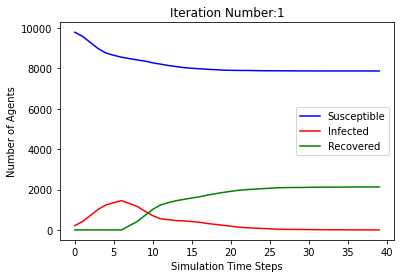

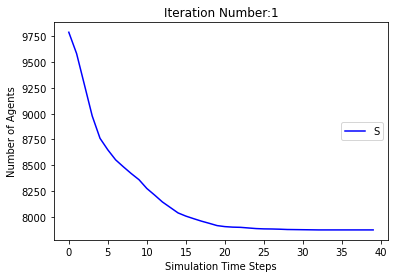

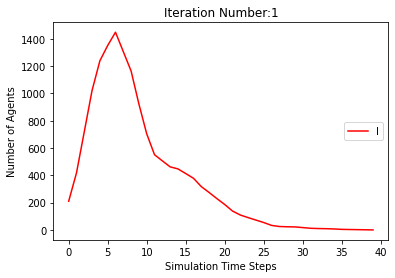

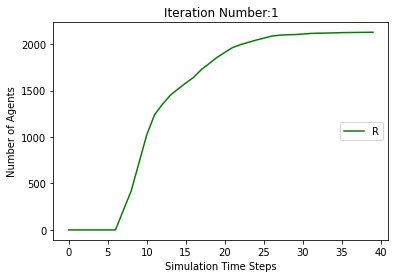

[9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963]
[210, 410, 696, 965, 1184, 1346, 1463, 1323, 1189, 977, 777, 616, 504, 427, 387, 339, 276, 216, 172, 129, 97, 73, 64, 60, 59, 55, 53, 50, 44, 35, 28, 20, 10, 5, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 410, 696, 965, 1184, 1346, 1463, 1533, 1599, 1673, 1742, 1800, 1850, 1890, 1920, 1938, 1949, 1958, 1972, 1979, 1987, 1993, 2002, 2009, 2017, 2027, 2032, 2037]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963,

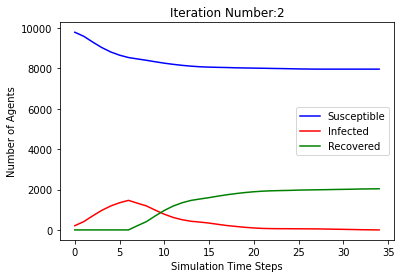

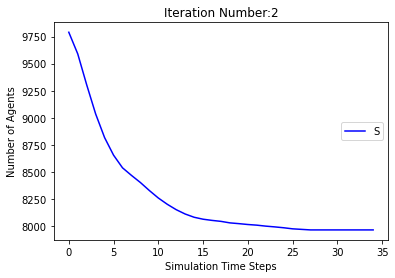

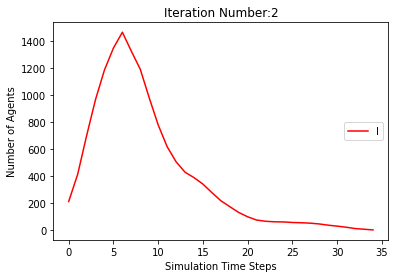

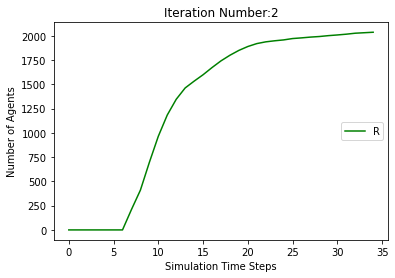

[9790, 9585, 9311, 9047, 8845, 8674, 8545, 8396, 8271, 8182, 8095, 8003, 7895, 7779, 7659, 7544, 7443, 7357, 7288, 7225, 7178, 7148, 7109, 7077, 7041, 7011, 7002, 6995, 6985, 6977, 6973, 6968, 6960, 6956, 6954, 6952, 6949, 6944, 6942, 6937, 6934, 6932, 6932, 6932, 6932, 6932, 6932, 6932, 6932]
[210, 415, 689, 953, 1155, 1326, 1455, 1394, 1314, 1129, 952, 842, 779, 766, 737, 727, 739, 738, 715, 670, 601, 511, 435, 366, 316, 277, 223, 183, 163, 132, 104, 73, 51, 46, 41, 33, 28, 29, 26, 23, 22, 22, 20, 17, 12, 10, 5, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 415, 689, 953, 1155, 1326, 1455, 1604, 1729, 1818, 1905, 1997, 2105, 2221, 2341, 2456, 2557, 2643, 2712, 2775, 2822, 2852, 2891, 2923, 2959, 2989, 2998, 3005, 3015, 3023, 3027, 3032, 3040, 3044, 3046, 3048, 3051, 3056, 3058, 3063, 3066, 3068]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 

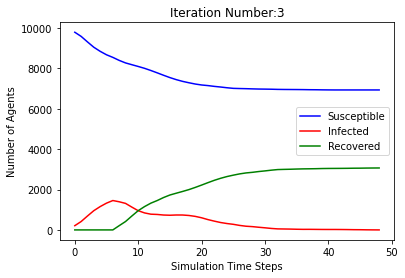

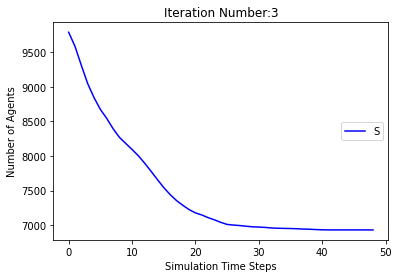

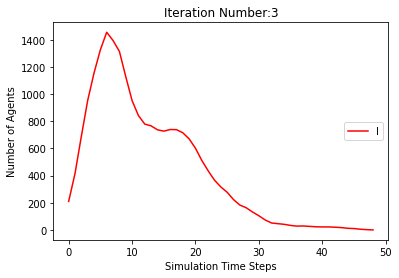

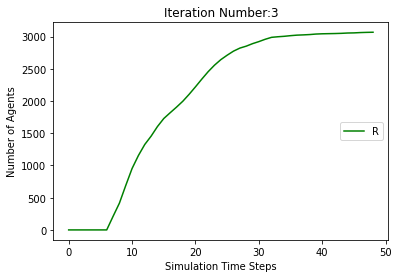

[9790, 9600, 9312, 9030, 8829, 8657, 8538, 8425, 8323, 8226, 8138, 8058, 8005, 7967, 7931, 7886, 7851, 7820, 7789, 7766, 7745, 7724, 7704, 7688, 7677, 7671, 7667, 7665, 7663, 7661, 7660, 7660, 7660, 7660, 7660, 7660, 7660, 7660]
[210, 400, 688, 970, 1171, 1343, 1462, 1365, 1277, 1086, 892, 771, 652, 571, 494, 437, 375, 318, 269, 239, 222, 207, 182, 163, 143, 118, 99, 80, 61, 43, 28, 17, 11, 7, 5, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 400, 688, 970, 1171, 1343, 1462, 1575, 1677, 1774, 1862, 1942, 1995, 2033, 2069, 2114, 2149, 2180, 2211, 2234, 2255, 2276, 2296, 2312, 2323, 2329, 2333, 2335, 2337, 2339, 2340]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7

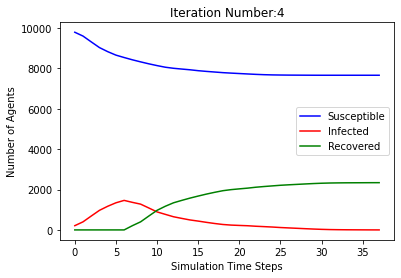

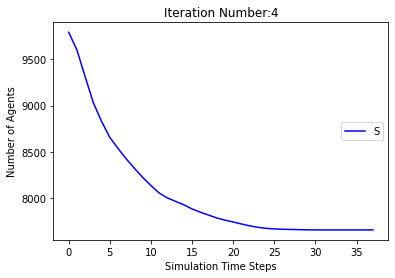

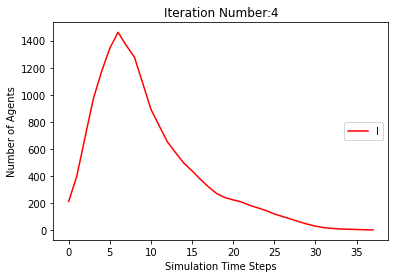

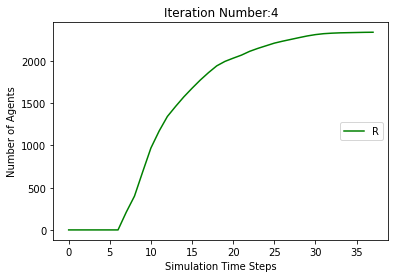

[9790, 9592, 9288, 9013, 8799, 8664, 8566, 8480, 8411, 8338, 8276, 8214, 8161, 8114, 8071, 8029, 7998, 7972, 7937, 7905, 7877, 7866, 7843, 7821, 7804, 7794, 7787, 7786, 7784, 7783, 7781, 7781, 7780, 7779, 7777, 7776, 7775, 7771, 7769, 7769, 7769, 7769, 7769, 7769, 7769, 7769]
[210, 408, 712, 987, 1201, 1336, 1434, 1310, 1181, 950, 737, 585, 503, 452, 409, 382, 340, 304, 277, 256, 237, 205, 186, 177, 168, 143, 118, 91, 82, 60, 40, 23, 14, 8, 9, 8, 8, 10, 12, 11, 10, 8, 7, 6, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 408, 712, 987, 1201, 1336, 1434, 1520, 1589, 1662, 1724, 1786, 1839, 1886, 1929, 1971, 2002, 2028, 2063, 2095, 2123, 2134, 2157, 2179, 2196, 2206, 2213, 2214, 2216, 2217, 2219, 2219, 2220, 2221, 2223, 2224, 2225, 2229, 2231]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 930

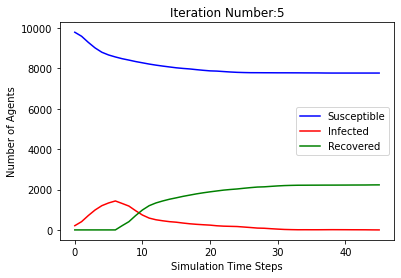

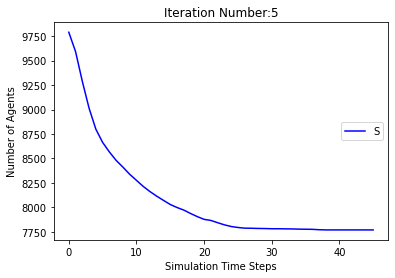

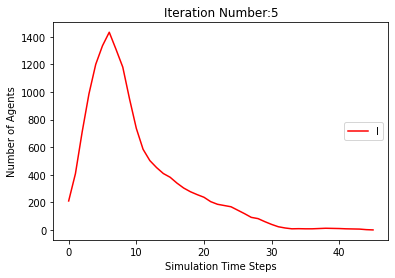

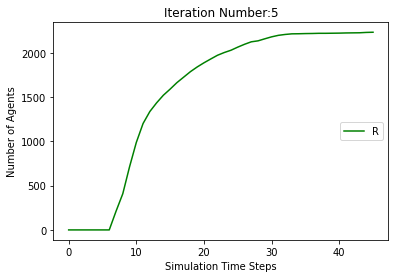

[9790, 9574, 9288, 9019, 8809, 8650, 8512, 8399, 8265, 8109, 7915, 7740, 7573, 7400, 7245, 7109, 6957, 6771, 6549, 6352, 6177, 6007, 5846, 5710, 5547, 5414, 5306, 5193, 5088, 5004, 4909, 4814, 4735, 4668, 4612, 4568, 4527, 4498, 4473, 4445, 4414, 4398, 4385, 4378, 4370, 4358, 4352, 4352, 4352, 4352, 4352, 4352, 4352, 4352]
[210, 426, 712, 981, 1191, 1350, 1488, 1391, 1309, 1179, 1104, 1069, 1077, 1112, 1154, 1156, 1152, 1144, 1191, 1221, 1223, 1238, 1263, 1247, 1224, 1135, 1046, 984, 919, 842, 801, 733, 679, 638, 581, 520, 477, 411, 341, 290, 254, 214, 183, 149, 128, 115, 93, 62, 46, 33, 26, 18, 6, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 426, 712, 981, 1191, 1350, 1488, 1601, 1735, 1891, 2085, 2260, 2427, 2600, 2755, 2891, 3043, 3229, 3451, 3648, 3823, 3993, 4154, 4290, 4453, 4586, 4694, 4807, 4912, 4996, 5091, 5186, 5265, 5332, 5388, 5432, 5473, 5502, 5527, 5555, 5586, 5602, 5615, 5622, 5630, 5642, 5648]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8

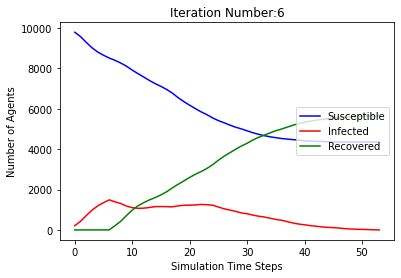

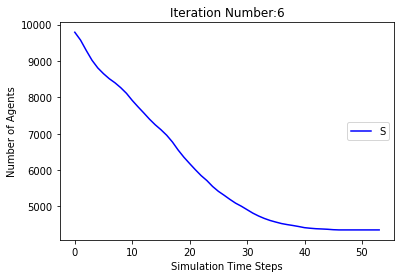

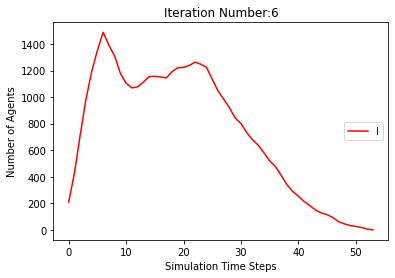

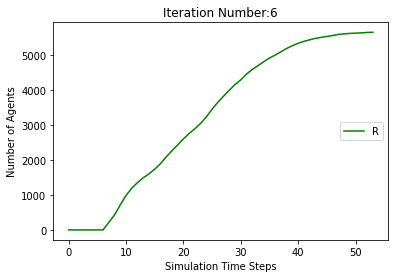

[9790, 9593, 9327, 9037, 8813, 8631, 8508, 8405, 8328, 8233, 8157, 8092, 8014, 7937, 7861, 7788, 7731, 7663, 7612, 7560, 7509, 7471, 7434, 7404, 7378, 7359, 7344, 7322, 7307, 7291, 7279, 7272, 7266, 7256, 7250, 7246, 7239, 7232, 7224, 7219, 7213, 7211, 7210, 7210, 7209, 7207, 7205, 7204, 7201, 7200, 7200, 7200, 7200, 7200, 7200, 7200, 7200]
[210, 407, 673, 963, 1187, 1369, 1492, 1385, 1265, 1094, 880, 721, 617, 571, 544, 540, 502, 494, 480, 454, 428, 390, 354, 327, 285, 253, 216, 187, 164, 143, 125, 106, 93, 88, 72, 61, 52, 47, 48, 47, 43, 39, 36, 29, 23, 17, 14, 9, 10, 10, 10, 9, 7, 5, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 407, 673, 963, 1187, 1369, 1492, 1595, 1672, 1767, 1843, 1908, 1986, 2063, 2139, 2212, 2269, 2337, 2388, 2440, 2491, 2529, 2566, 2596, 2622, 2641, 2656, 2678, 2693, 2709, 2721, 2728, 2734, 2744, 2750, 2754, 2761, 2768, 2776, 2781, 2787, 2789, 2790, 2790, 2791, 2793, 2795, 2796, 2799, 2800]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8

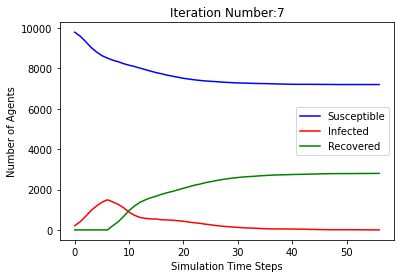

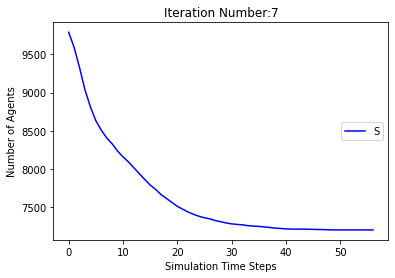

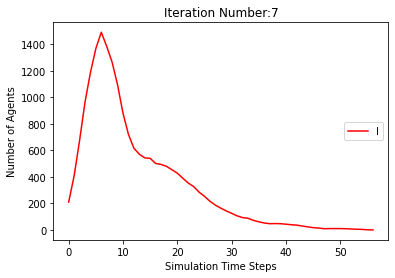

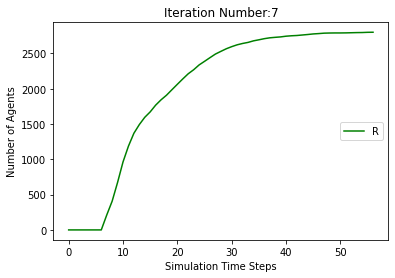

[9790, 9597, 9336, 9039, 8831, 8674, 8578, 8523, 8487, 8451, 8392, 8334, 8279, 8230, 8178, 8138, 8094, 8069, 8058, 8045, 8035, 8028, 8023, 8015, 8011, 8007, 7998, 7995, 7991, 7986, 7980, 7978, 7976, 7971, 7968, 7966, 7966, 7964, 7964, 7962, 7960, 7954, 7952, 7951, 7950, 7950, 7946, 7945, 7945, 7945, 7945, 7945, 7945, 7945, 7945]
[210, 403, 664, 961, 1169, 1326, 1422, 1267, 1110, 885, 647, 497, 395, 348, 345, 349, 357, 323, 276, 234, 195, 150, 115, 79, 58, 51, 47, 40, 37, 37, 35, 33, 31, 27, 27, 25, 20, 16, 14, 14, 11, 14, 14, 15, 14, 14, 16, 15, 9, 7, 6, 5, 5, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 403, 664, 961, 1169, 1326, 1422, 1477, 1513, 1549, 1608, 1666, 1721, 1770, 1822, 1862, 1906, 1931, 1942, 1955, 1965, 1972, 1977, 1985, 1989, 1993, 2002, 2005, 2009, 2014, 2020, 2022, 2024, 2029, 2032, 2034, 2034, 2036, 2036, 2038, 2040, 2046, 2048, 2049, 2050, 2050, 2054, 2055]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7

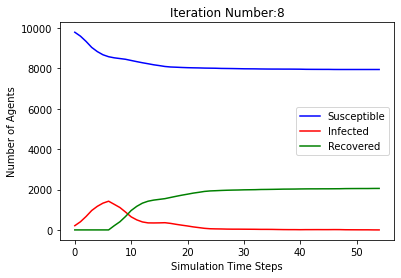

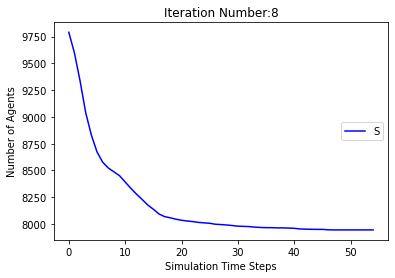

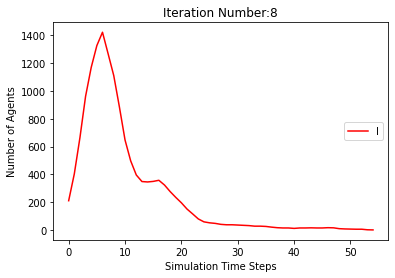

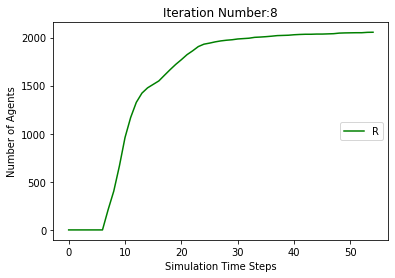

[9790, 9588, 9317, 9042, 8774, 8582, 8433, 8287, 8177, 8061, 7952, 7807, 7675, 7523, 7364, 7230, 7061, 6893, 6763, 6642, 6517, 6405, 6315, 6221, 6125, 6038, 5949, 5867, 5810, 5757, 5711, 5669, 5623, 5579, 5536, 5483, 5445, 5415, 5398, 5383, 5376, 5372, 5365, 5362, 5361, 5360, 5358, 5358, 5358, 5358, 5358, 5358, 5357, 5357, 5357, 5357, 5357, 5357, 5357, 5357]
[210, 412, 683, 958, 1226, 1418, 1567, 1503, 1411, 1256, 1090, 967, 907, 910, 923, 947, 1000, 1059, 1044, 1033, 1006, 959, 915, 840, 768, 725, 693, 650, 595, 558, 510, 456, 415, 370, 331, 327, 312, 296, 271, 240, 203, 164, 118, 83, 54, 38, 25, 18, 14, 7, 4, 3, 3, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 412, 683, 958, 1226, 1418, 1567, 1713, 1823, 1939, 2048, 2193, 2325, 2477, 2636, 2770, 2939, 3107, 3237, 3358, 3483, 3595, 3685, 3779, 3875, 3962, 4051, 4133, 4190, 4243, 4289, 4331, 4377, 4421, 4464, 4517, 4555, 4585, 4602, 4617, 4624, 4628, 4635, 4638, 4639, 4640, 4642, 4642, 4642, 4642, 4642, 4642, 4643]
[[], [9790, 9583, 

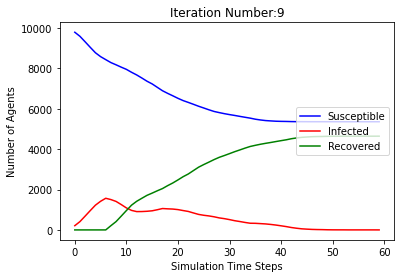

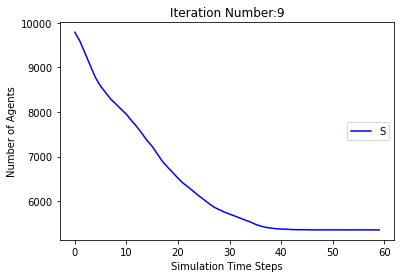

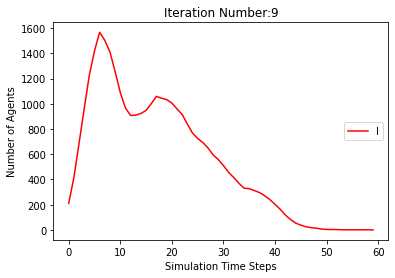

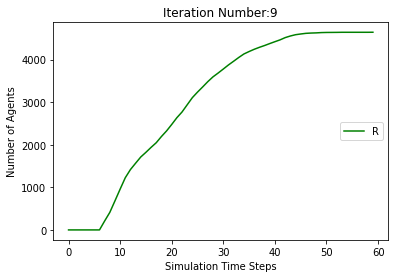

[9790, 9600, 9333, 9045, 8832, 8666, 8551, 8475, 8416, 8365, 8305, 8231, 8163, 8088, 8034, 7970, 7897, 7863, 7848, 7834, 7815, 7806, 7796, 7786, 7773, 7763, 7750, 7735, 7726, 7717, 7709, 7704, 7690, 7681, 7669, 7666, 7663, 7658, 7657, 7655, 7653, 7649, 7646, 7640, 7638, 7637, 7634, 7633, 7632, 7632, 7632, 7630, 7628, 7625, 7625, 7625, 7625, 7625, 7625, 7625, 7625]
[210, 400, 667, 955, 1168, 1334, 1449, 1315, 1184, 968, 740, 601, 503, 463, 441, 446, 468, 442, 383, 329, 273, 228, 174, 111, 90, 85, 84, 80, 80, 79, 77, 69, 73, 69, 66, 60, 54, 51, 47, 35, 28, 20, 20, 23, 20, 20, 21, 20, 17, 14, 8, 8, 9, 9, 8, 7, 7, 7, 5, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 400, 667, 955, 1168, 1334, 1449, 1525, 1584, 1635, 1695, 1769, 1837, 1912, 1966, 2030, 2103, 2137, 2152, 2166, 2185, 2194, 2204, 2214, 2227, 2237, 2250, 2265, 2274, 2283, 2291, 2296, 2310, 2319, 2331, 2334, 2337, 2342, 2343, 2345, 2347, 2351, 2354, 2360, 2362, 2363, 2366, 2367, 2368, 2368, 2368, 2370, 2372, 2375]
[[], [9790, 9583, 9281, 8978

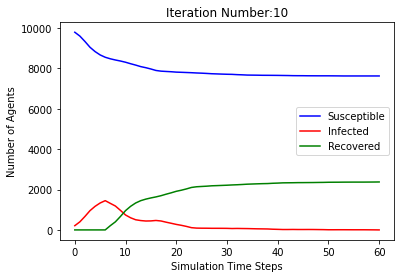

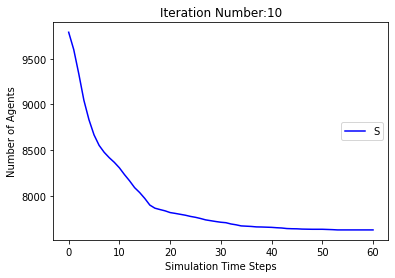

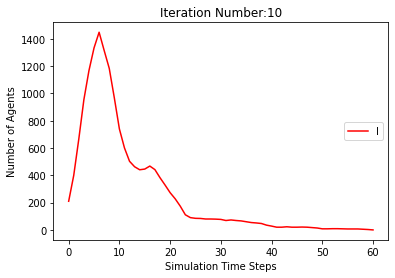

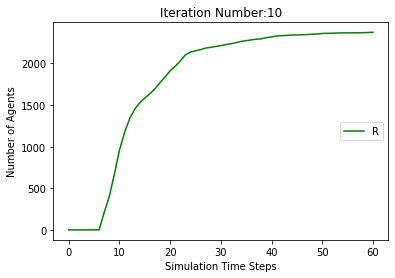

[9790, 9566, 9297, 9039, 8846, 8735, 8660, 8576, 8519, 8459, 8391, 8342, 8301, 8262, 8216, 8197, 8169, 8155, 8145, 8136, 8117, 8106, 8096, 8091, 8084, 8083, 8081, 8078, 8078, 8078, 8078, 8078, 8078, 8078, 8078]
[210, 434, 703, 961, 1154, 1265, 1340, 1214, 1047, 838, 648, 504, 434, 398, 360, 322, 290, 236, 197, 165, 145, 110, 101, 78, 71, 62, 55, 39, 28, 18, 13, 6, 5, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 434, 703, 961, 1154, 1265, 1340, 1424, 1481, 1541, 1609, 1658, 1699, 1738, 1784, 1803, 1831, 1845, 1855, 1864, 1883, 1894, 1904, 1909, 1916, 1917, 1919, 1922]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963

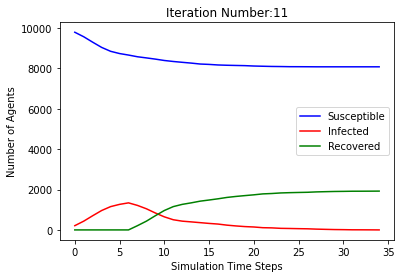

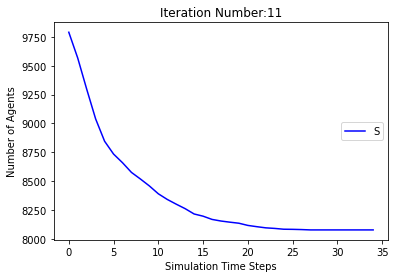

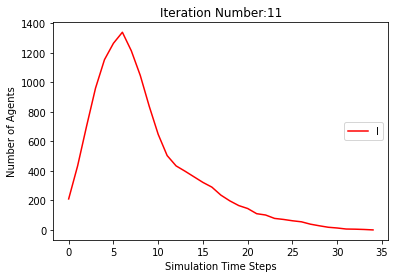

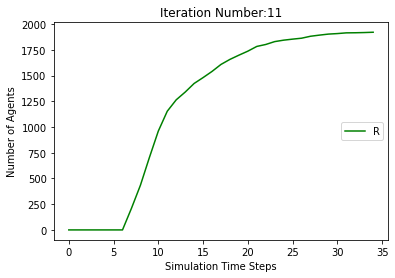

[9790, 9582, 9288, 9000, 8788, 8655, 8560, 8474, 8407, 8359, 8280, 8203, 8138, 8085, 8026, 7972, 7917, 7885, 7844, 7809, 7793, 7775, 7761, 7747, 7732, 7724, 7718, 7714, 7712, 7710, 7709, 7705, 7702, 7700, 7700, 7700, 7700, 7700, 7700, 7700, 7700]
[210, 418, 712, 1000, 1212, 1345, 1440, 1316, 1175, 929, 720, 585, 517, 475, 448, 435, 442, 395, 359, 329, 292, 251, 211, 170, 153, 120, 91, 79, 63, 51, 38, 27, 22, 18, 14, 12, 10, 9, 5, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 418, 712, 1000, 1212, 1345, 1440, 1526, 1593, 1641, 1720, 1797, 1862, 1915, 1974, 2028, 2083, 2115, 2156, 2191, 2207, 2225, 2239, 2253, 2268, 2276, 2282, 2286, 2288, 2290, 2291, 2295, 2298, 2300]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080,

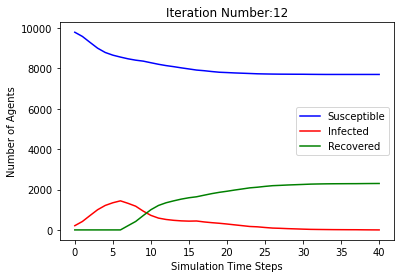

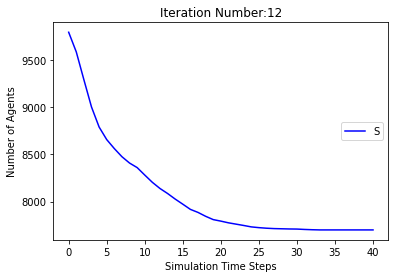

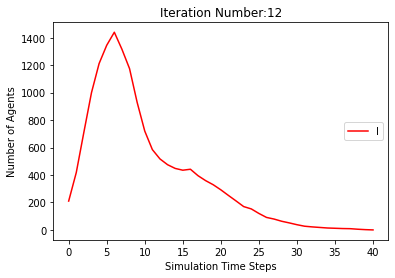

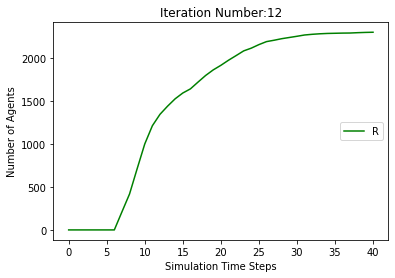

[9790, 9568, 9298, 9028, 8832, 8694, 8590, 8527, 8454, 8376, 8303, 8216, 8146, 8077, 8019, 7956, 7908, 7856, 7811, 7779, 7747, 7712, 7679, 7658, 7634, 7613, 7593, 7576, 7561, 7545, 7533, 7521, 7513, 7510, 7505, 7501, 7493, 7485, 7479, 7477, 7472, 7470, 7469, 7468, 7467, 7467, 7467, 7467, 7467, 7467, 7467, 7467]
[210, 432, 702, 972, 1168, 1306, 1410, 1263, 1114, 922, 725, 616, 548, 513, 508, 498, 468, 447, 405, 367, 330, 307, 277, 250, 222, 198, 186, 171, 151, 134, 125, 113, 100, 83, 71, 60, 52, 48, 42, 36, 38, 35, 32, 25, 18, 12, 10, 5, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 432, 702, 972, 1168, 1306, 1410, 1473, 1546, 1624, 1697, 1784, 1854, 1923, 1981, 2044, 2092, 2144, 2189, 2221, 2253, 2288, 2321, 2342, 2366, 2387, 2407, 2424, 2439, 2455, 2467, 2479, 2487, 2490, 2495, 2499, 2507, 2515, 2521, 2523, 2528, 2530, 2531, 2532, 2533]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7

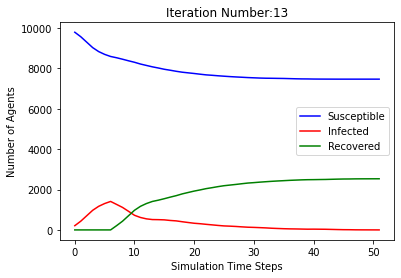

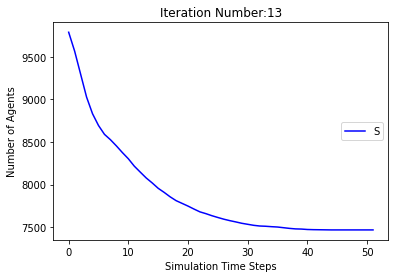

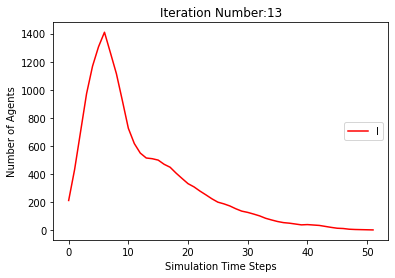

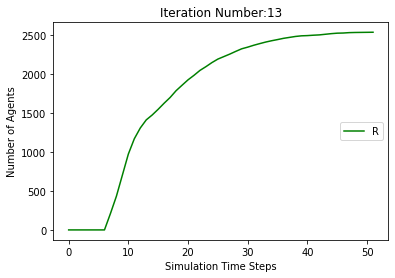

[9790, 9587, 9304, 9031, 8832, 8711, 8616, 8541, 8484, 8422, 8365, 8315, 8245, 8179, 8124, 8069, 8014, 7958, 7905, 7858, 7818, 7783, 7766, 7746, 7729, 7718, 7711, 7706, 7701, 7696, 7693, 7693, 7693, 7693, 7693, 7693, 7693, 7693]
[210, 413, 696, 969, 1168, 1289, 1384, 1249, 1103, 882, 666, 517, 466, 437, 417, 415, 408, 407, 410, 387, 361, 341, 303, 268, 229, 187, 147, 112, 82, 70, 53, 36, 25, 18, 13, 8, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 413, 696, 969, 1168, 1289, 1384, 1459, 1516, 1578, 1635, 1685, 1755, 1821, 1876, 1931, 1986, 2042, 2095, 2142, 2182, 2217, 2234, 2254, 2271, 2282, 2289, 2294, 2299, 2304, 2307]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998

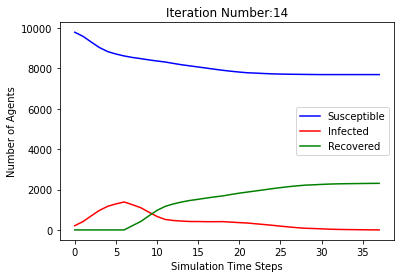

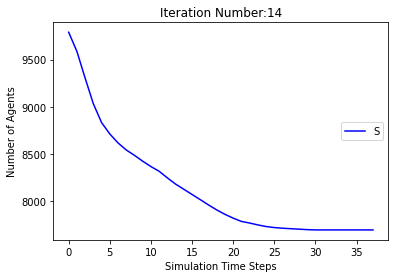

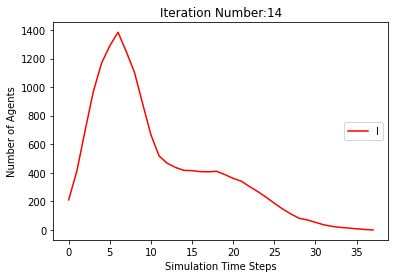

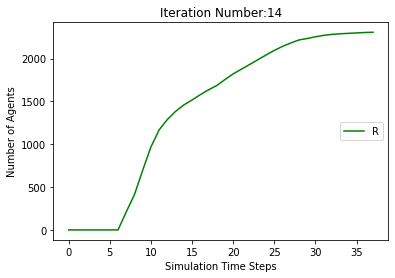

[9790, 9569, 9301, 9031, 8825, 8653, 8523, 8381, 8262, 8144, 8029, 7877, 7762, 7640, 7568, 7512, 7474, 7443, 7417, 7400, 7388, 7375, 7366, 7358, 7355, 7355, 7355, 7355, 7355, 7355, 7355, 7355]
[210, 431, 699, 969, 1175, 1347, 1477, 1409, 1307, 1157, 1002, 948, 891, 883, 813, 750, 670, 586, 460, 362, 252, 193, 146, 116, 88, 62, 45, 33, 20, 11, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 431, 699, 969, 1175, 1347, 1477, 1619, 1738, 1856, 1971, 2123, 2238, 2360, 2432, 2488, 2526, 2557, 2583, 2600, 2612, 2625, 2634, 2642, 2645]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963], [9790, 9585, 9311, 904

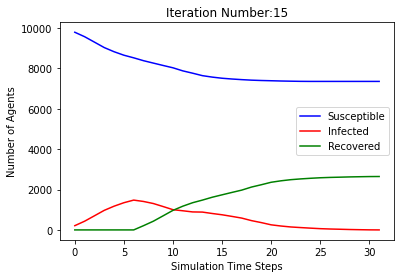

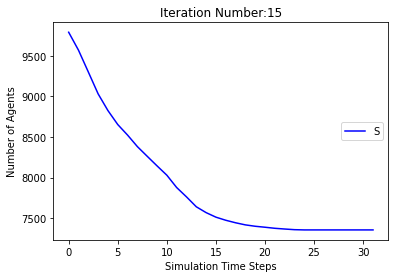

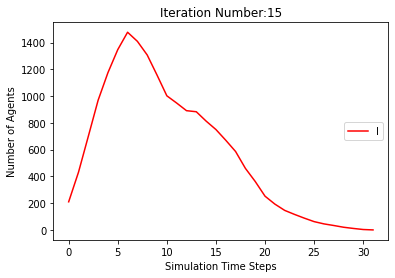

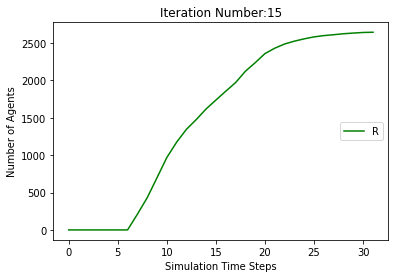

[9790, 9580, 9272, 9008, 8800, 8643, 8541, 8442, 8364, 8265, 8173, 8091, 8031, 7969, 7909, 7854, 7801, 7758, 7722, 7687, 7657, 7624, 7593, 7562, 7544, 7533, 7516, 7510, 7499, 7491, 7487, 7483, 7483, 7483, 7483, 7483, 7483, 7483, 7483]
[210, 420, 728, 992, 1200, 1357, 1459, 1348, 1216, 1007, 835, 709, 612, 572, 533, 510, 464, 415, 369, 344, 312, 285, 261, 239, 214, 189, 171, 147, 125, 102, 75, 61, 50, 33, 27, 16, 8, 4, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 420, 728, 992, 1200, 1357, 1459, 1558, 1636, 1735, 1827, 1909, 1969, 2031, 2091, 2146, 2199, 2242, 2278, 2313, 2343, 2376, 2407, 2438, 2456, 2467, 2484, 2490, 2501, 2509, 2513, 2517]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 802

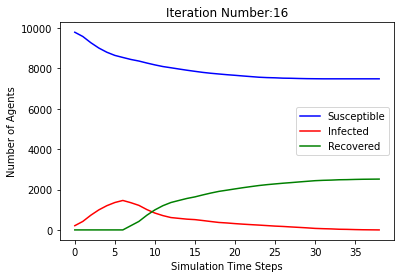

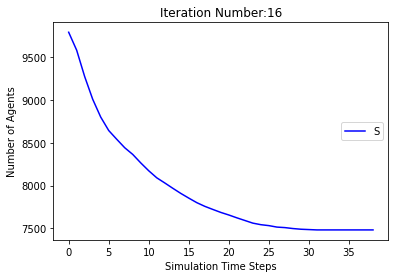

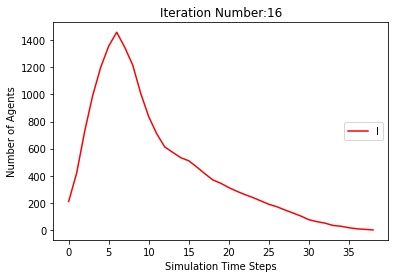

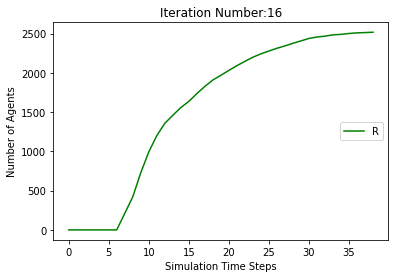

[9790, 9586, 9293, 9022, 8781, 8591, 8453, 8321, 8209, 8086, 7971, 7837, 7723, 7602, 7472, 7364, 7285, 7199, 7138, 7080, 7036, 6994, 6959, 6945, 6924, 6901, 6884, 6868, 6858, 6850, 6846, 6844, 6841, 6840, 6840, 6840, 6840, 6840, 6840, 6840, 6840]
[210, 414, 707, 978, 1219, 1409, 1547, 1469, 1377, 1207, 1051, 944, 868, 851, 849, 845, 801, 772, 699, 643, 566, 478, 405, 340, 275, 237, 196, 168, 136, 109, 99, 80, 60, 44, 28, 18, 10, 6, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 414, 707, 978, 1219, 1409, 1547, 1679, 1791, 1914, 2029, 2163, 2277, 2398, 2528, 2636, 2715, 2801, 2862, 2920, 2964, 3006, 3041, 3055, 3076, 3099, 3116, 3132, 3142, 3150, 3154, 3156, 3159, 3160]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8

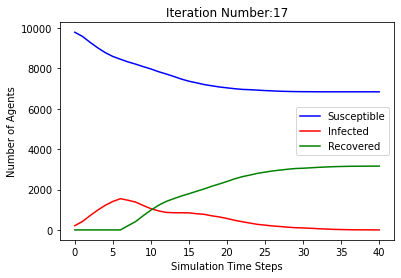

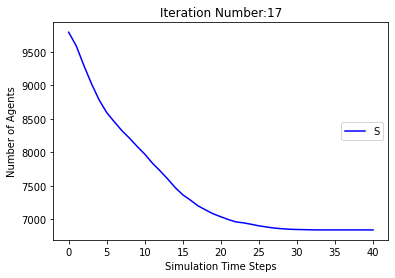

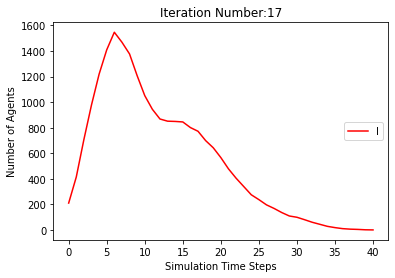

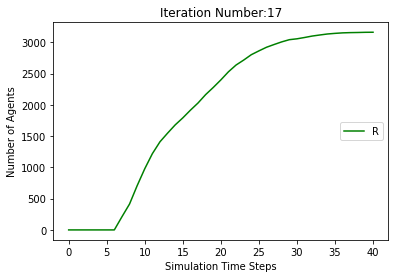

[9790, 9564, 9295, 9027, 8852, 8734, 8645, 8583, 8525, 8446, 8373, 8313, 8281, 8252, 8231, 8206, 8176, 8156, 8152, 8152, 8152, 8152, 8152, 8152, 8152, 8152]
[210, 436, 705, 973, 1148, 1266, 1355, 1207, 1039, 849, 654, 539, 453, 393, 352, 319, 270, 217, 161, 129, 100, 79, 54, 24, 4, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 436, 705, 973, 1148, 1266, 1355, 1417, 1475, 1554, 1627, 1687, 1719, 1748, 1769, 1794, 1824, 1844, 1848]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963], [9790, 9585, 9311, 9047, 8845, 8674, 8545, 8396, 8271, 8182, 8095, 8003, 7895, 7779, 7659, 7544, 7443, 7357, 7288, 7225, 71

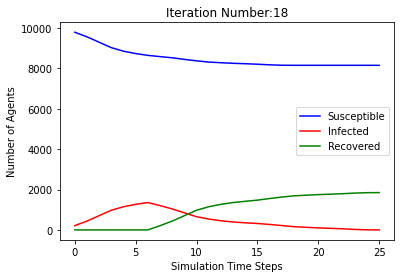

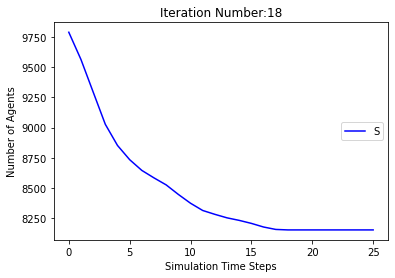

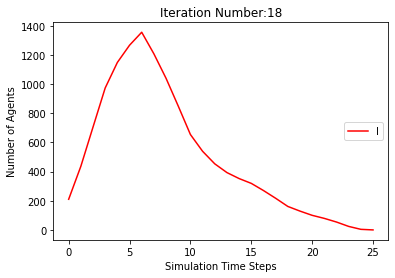

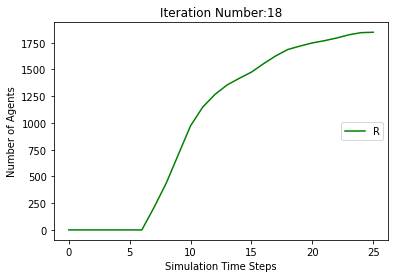

[9790, 9574, 9273, 8991, 8779, 8612, 8488, 8384, 8290, 8184, 8084, 7983, 7881, 7782, 7673, 7591, 7486, 7409, 7333, 7265, 7199, 7150, 7094, 7024, 6985, 6956, 6940, 6931, 6922, 6916, 6912, 6910, 6909, 6908, 6907, 6907, 6907, 6907, 6907, 6907, 6907, 6907]
[210, 426, 727, 1009, 1221, 1388, 1512, 1406, 1284, 1089, 907, 796, 731, 706, 711, 699, 698, 675, 650, 616, 583, 523, 497, 462, 424, 377, 325, 268, 228, 178, 112, 75, 47, 32, 24, 15, 9, 5, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 426, 727, 1009, 1221, 1388, 1512, 1616, 1710, 1816, 1916, 2017, 2119, 2218, 2327, 2409, 2514, 2591, 2667, 2735, 2801, 2850, 2906, 2976, 3015, 3044, 3060, 3069, 3078, 3084, 3088, 3090, 3091, 3092, 3093]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 820

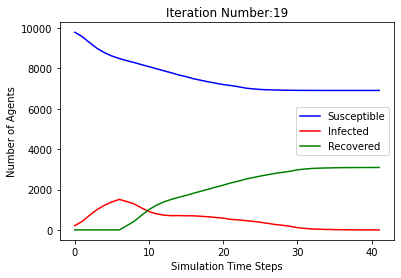

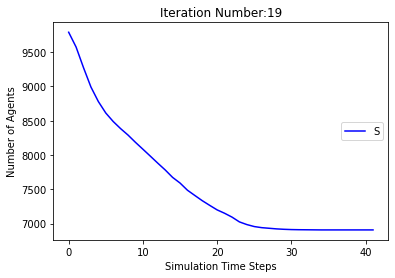

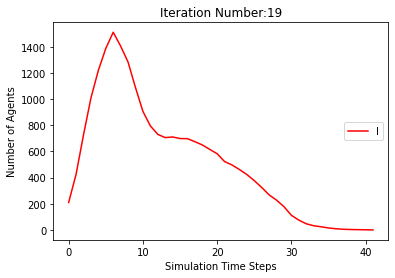

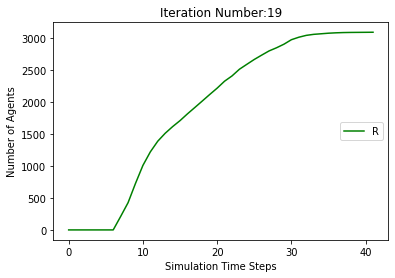

[9790, 9590, 9310, 9040, 8822, 8628, 8482, 8345, 8220, 8084, 7963, 7829, 7698, 7570, 7427, 7296, 7131, 6978, 6834, 6702, 6569, 6466, 6360, 6295, 6240, 6195, 6160, 6129, 6104, 6086, 6074, 6072, 6072, 6069, 6068, 6068, 6068, 6068, 6068, 6068, 6068, 6068]
[210, 410, 690, 960, 1178, 1372, 1518, 1445, 1370, 1226, 1077, 993, 930, 912, 918, 924, 953, 985, 995, 996, 1001, 961, 936, 836, 738, 639, 542, 440, 362, 274, 221, 168, 123, 91, 61, 36, 18, 6, 4, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 410, 690, 960, 1178, 1372, 1518, 1655, 1780, 1916, 2037, 2171, 2302, 2430, 2573, 2704, 2869, 3022, 3166, 3298, 3431, 3534, 3640, 3705, 3760, 3805, 3840, 3871, 3896, 3914, 3926, 3928, 3928, 3931, 3932]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 

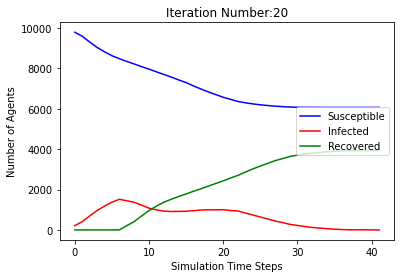

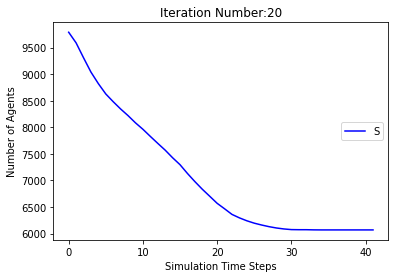

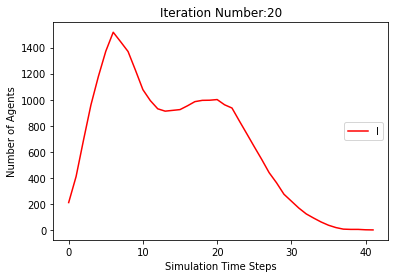

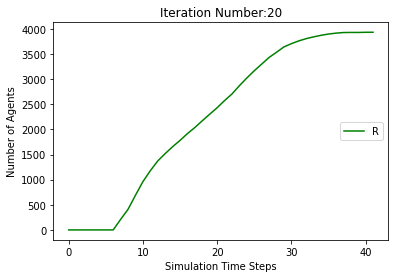

[9790, 9600, 9341, 9063, 8833, 8663, 8523, 8400, 8320, 8233, 8147, 8065, 7981, 7907, 7832, 7743, 7647, 7569, 7496, 7431, 7380, 7340, 7317, 7296, 7280, 7260, 7244, 7233, 7215, 7197, 7180, 7174, 7169, 7167, 7165, 7164, 7164, 7164, 7164, 7164, 7164, 7164, 7164]
[210, 400, 659, 937, 1167, 1337, 1477, 1390, 1280, 1108, 916, 768, 682, 616, 568, 577, 586, 578, 569, 550, 527, 492, 426, 351, 289, 236, 187, 147, 125, 120, 116, 106, 91, 77, 68, 51, 33, 16, 10, 5, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 400, 659, 937, 1167, 1337, 1477, 1600, 1680, 1767, 1853, 1935, 2019, 2093, 2168, 2257, 2353, 2431, 2504, 2569, 2620, 2660, 2683, 2704, 2720, 2740, 2756, 2767, 2785, 2803, 2820, 2826, 2831, 2833, 2835, 2836]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401

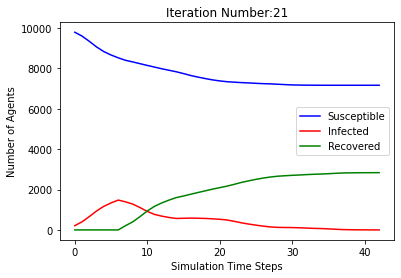

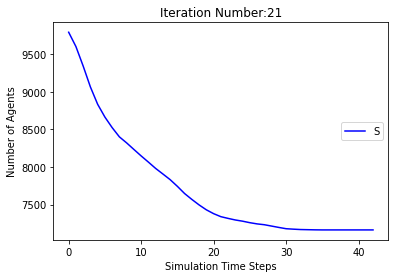

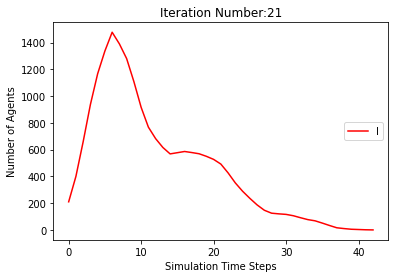

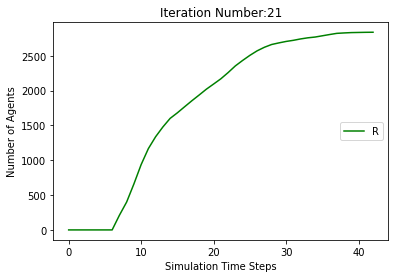

[9790, 9574, 9293, 9007, 8818, 8714, 8643, 8585, 8542, 8489, 8445, 8400, 8363, 8329, 8278, 8230, 8194, 8157, 8138, 8116, 8096, 8080, 8065, 8058, 8049, 8037, 8028, 8021, 8016, 8013, 8011, 8006, 8001, 7998, 7996, 7996, 7996, 7996, 7996, 7996, 7996, 7996]
[210, 426, 707, 993, 1182, 1286, 1357, 1205, 1032, 804, 562, 418, 351, 314, 307, 312, 295, 288, 262, 247, 233, 198, 165, 136, 108, 101, 88, 75, 64, 52, 47, 43, 36, 30, 25, 20, 17, 15, 10, 5, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 426, 707, 993, 1182, 1286, 1357, 1415, 1458, 1511, 1555, 1600, 1637, 1671, 1722, 1770, 1806, 1843, 1862, 1884, 1904, 1920, 1935, 1942, 1951, 1963, 1972, 1979, 1984, 1987, 1989, 1994, 1999, 2002, 2004]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 81

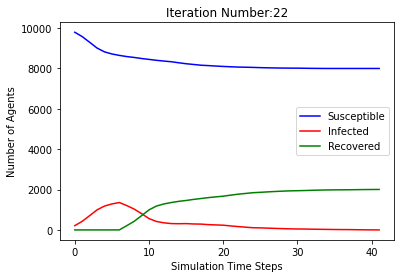

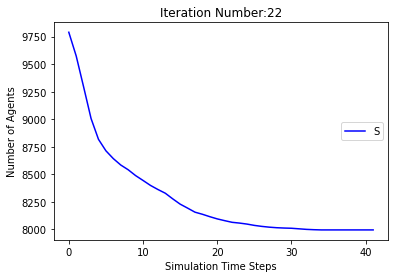

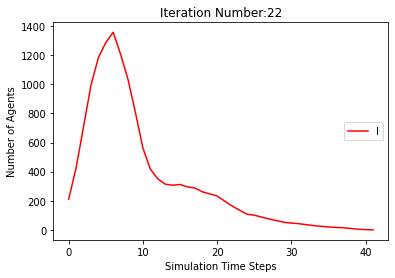

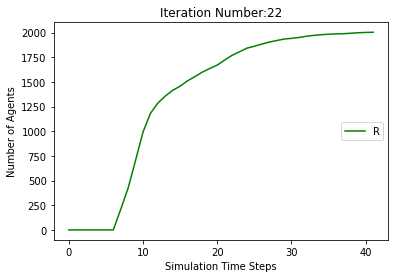

[9790, 9594, 9299, 9037, 8825, 8670, 8585, 8517, 8454, 8394, 8316, 8220, 8147, 8077, 8023, 7966, 7924, 7914, 7901, 7896, 7893, 7893, 7892, 7890, 7890, 7890, 7890, 7890, 7890, 7890, 7890]
[210, 406, 701, 963, 1175, 1330, 1415, 1273, 1140, 905, 721, 605, 523, 508, 494, 488, 470, 402, 319, 251, 184, 130, 74, 34, 24, 11, 6, 3, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 406, 701, 963, 1175, 1330, 1415, 1483, 1546, 1606, 1684, 1780, 1853, 1923, 1977, 2034, 2076, 2086, 2099, 2104, 2107, 2107, 2108, 2110]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963], [9790, 9585, 9311, 9047, 8845, 8674, 8545, 83

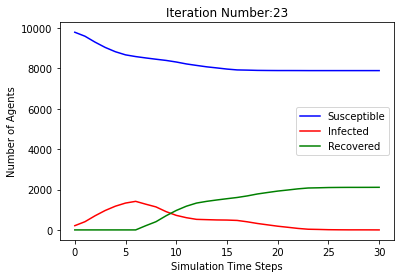

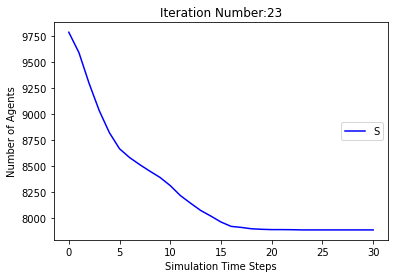

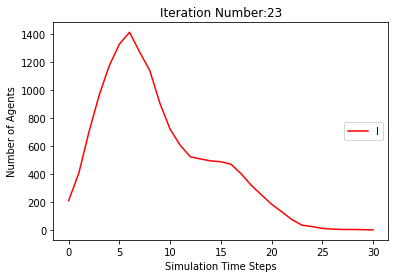

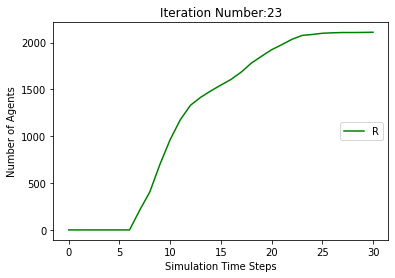

[9790, 9583, 9301, 9031, 8839, 8729, 8656, 8591, 8519, 8468, 8404, 8342, 8276, 8225, 8168, 8124, 8085, 8048, 8006, 7987, 7971, 7959, 7954, 7949, 7945, 7938, 7929, 7925, 7923, 7923, 7923, 7923, 7923, 7923, 7923, 7923]
[210, 417, 699, 969, 1161, 1271, 1344, 1199, 1064, 833, 627, 497, 453, 431, 423, 395, 383, 356, 336, 289, 254, 209, 170, 136, 103, 68, 58, 46, 36, 31, 26, 22, 15, 6, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 417, 699, 969, 1161, 1271, 1344, 1409, 1481, 1532, 1596, 1658, 1724, 1775, 1832, 1876, 1915, 1952, 1994, 2013, 2029, 2041, 2046, 2051, 2055, 2062, 2071, 2075, 2077]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 796

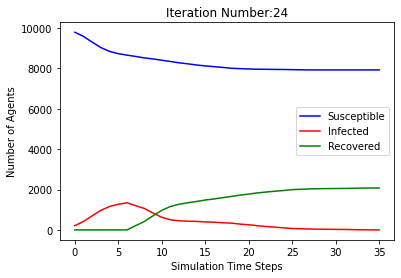

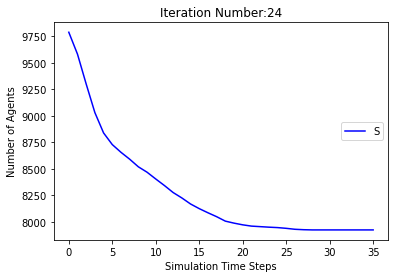

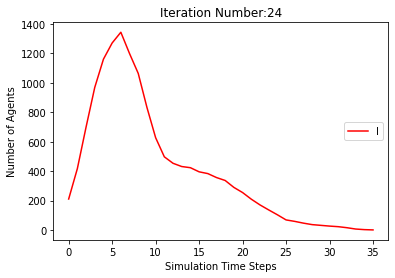

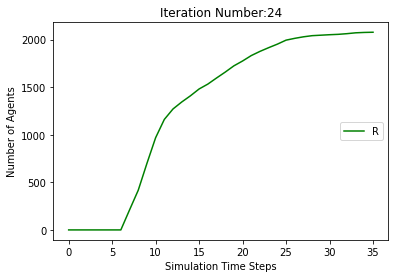

[9790, 9597, 9324, 9031, 8816, 8688, 8587, 8504, 8447, 8392, 8339, 8288, 8228, 8172, 8122, 8079, 8037, 8015, 8000, 7994, 7987, 7984, 7983, 7983, 7983, 7983, 7982, 7982, 7982, 7982, 7982, 7982, 7982, 7982]
[210, 403, 676, 969, 1184, 1312, 1413, 1286, 1150, 932, 692, 528, 460, 415, 382, 368, 355, 324, 288, 234, 185, 138, 96, 54, 32, 17, 12, 5, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 403, 676, 969, 1184, 1312, 1413, 1496, 1553, 1608, 1661, 1712, 1772, 1828, 1878, 1921, 1963, 1985, 2000, 2006, 2013, 2016, 2017, 2017, 2017, 2017, 2018]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963],

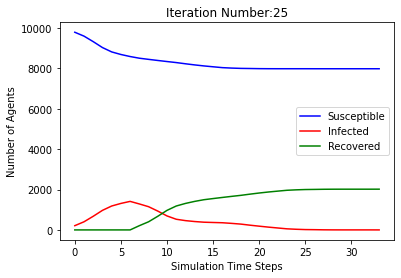

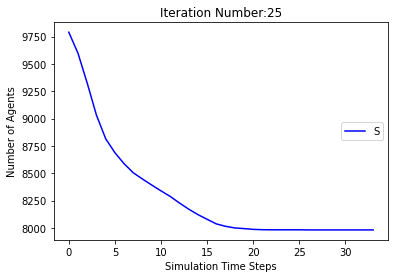

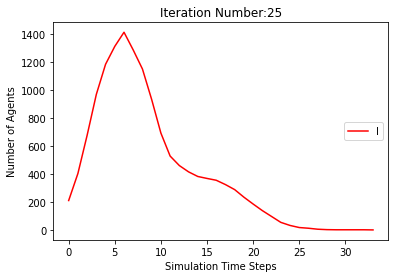

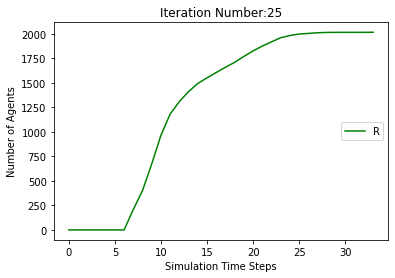

[9790, 9592, 9319, 9043, 8822, 8636, 8511, 8415, 8331, 8247, 8175, 8079, 7974, 7884, 7779, 7689, 7599, 7532, 7477, 7423, 7385, 7331, 7270, 7219, 7188, 7164, 7155, 7153, 7153, 7151, 7149, 7147, 7147, 7147, 7147, 7147, 7147, 7147, 7147]
[210, 408, 681, 957, 1178, 1364, 1489, 1375, 1261, 1072, 868, 743, 662, 627, 636, 642, 648, 643, 602, 551, 499, 448, 419, 380, 344, 313, 268, 232, 178, 119, 70, 41, 17, 8, 6, 6, 4, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 408, 681, 957, 1178, 1364, 1489, 1585, 1669, 1753, 1825, 1921, 2026, 2116, 2221, 2311, 2401, 2468, 2523, 2577, 2615, 2669, 2730, 2781, 2812, 2836, 2845, 2847, 2847, 2849, 2851, 2853]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 

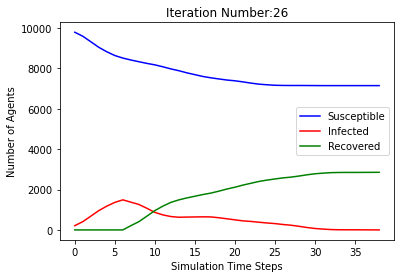

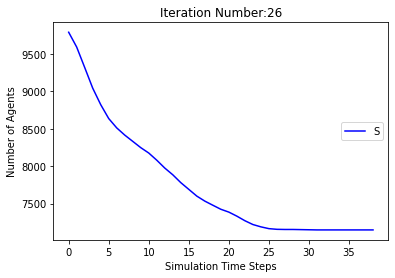

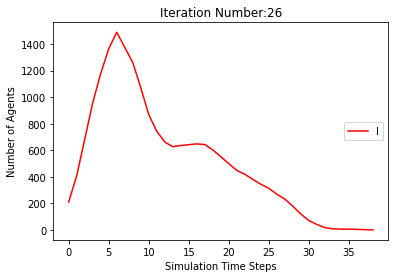

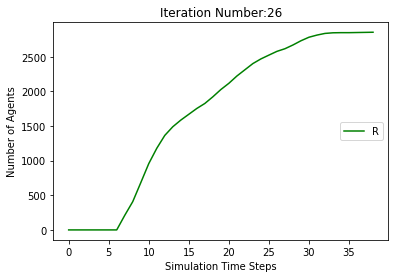

[9790, 9572, 9279, 8991, 8791, 8653, 8561, 8490, 8424, 8375, 8322, 8248, 8206, 8161, 8115, 8084, 8061, 8043, 8032, 8020, 8008, 7994, 7982, 7972, 7970, 7969, 7968, 7968, 7968, 7968, 7968, 7968, 7968, 7968]
[210, 428, 721, 1009, 1209, 1347, 1439, 1300, 1148, 904, 669, 543, 447, 400, 375, 340, 314, 279, 216, 186, 153, 121, 102, 89, 73, 63, 52, 40, 26, 14, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 428, 721, 1009, 1209, 1347, 1439, 1510, 1576, 1625, 1678, 1752, 1794, 1839, 1885, 1916, 1939, 1957, 1968, 1980, 1992, 2006, 2018, 2028, 2030, 2031, 2032]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 

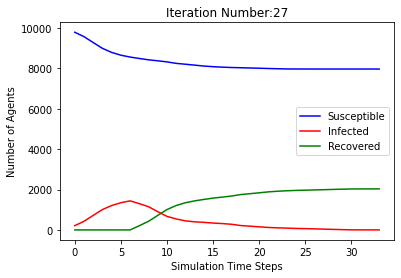

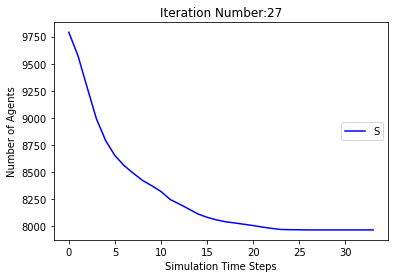

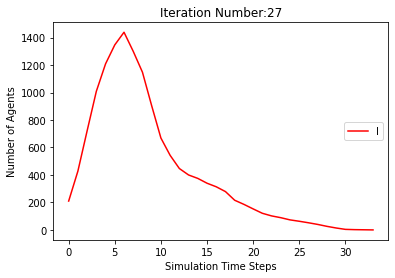

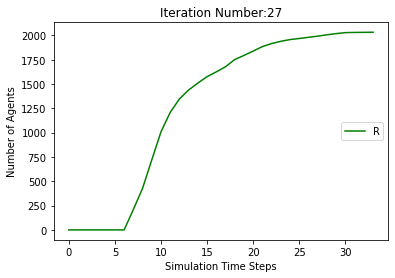

[9790, 9567, 9301, 9050, 8822, 8674, 8588, 8522, 8443, 8321, 8175, 8056, 7954, 7864, 7754, 7631, 7508, 7408, 7328, 7252, 7189, 7130, 7068, 7016, 6980, 6938, 6909, 6893, 6879, 6869, 6865, 6861, 6860, 6860, 6860, 6860, 6860, 6860, 6860, 6860]
[210, 433, 699, 950, 1178, 1326, 1412, 1268, 1124, 980, 875, 766, 720, 724, 768, 812, 813, 767, 728, 702, 675, 624, 563, 492, 428, 390, 343, 296, 251, 199, 151, 119, 78, 49, 33, 19, 9, 5, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 433, 699, 950, 1178, 1326, 1412, 1478, 1557, 1679, 1825, 1944, 2046, 2136, 2246, 2369, 2492, 2592, 2672, 2748, 2811, 2870, 2932, 2984, 3020, 3062, 3091, 3107, 3121, 3131, 3135, 3139, 3140]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051,

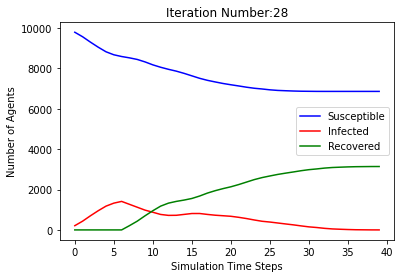

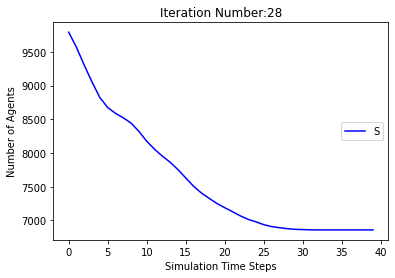

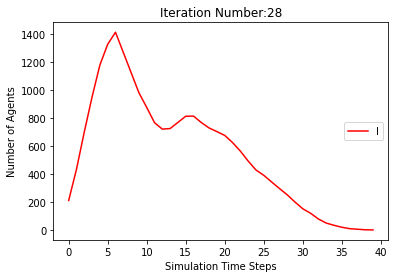

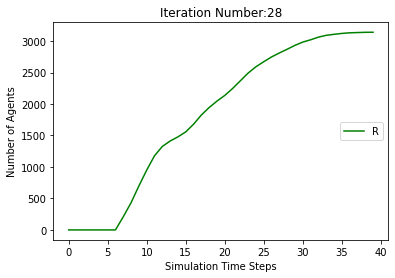

[9790, 9570, 9284, 9005, 8787, 8631, 8504, 8396, 8313, 8223, 8136, 8050, 7952, 7872, 7810, 7741, 7674, 7597, 7542, 7492, 7465, 7448, 7431, 7420, 7408, 7392, 7380, 7374, 7369, 7368, 7368, 7368, 7367, 7367, 7367, 7367, 7367, 7367, 7367, 7367]
[210, 430, 716, 995, 1213, 1369, 1496, 1394, 1257, 1061, 869, 737, 679, 632, 586, 572, 549, 539, 508, 460, 407, 362, 310, 254, 189, 150, 112, 91, 79, 63, 52, 40, 25, 13, 7, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 430, 716, 995, 1213, 1369, 1496, 1604, 1687, 1777, 1864, 1950, 2048, 2128, 2190, 2259, 2326, 2403, 2458, 2508, 2535, 2552, 2569, 2580, 2592, 2608, 2620, 2626, 2631, 2632, 2632, 2632, 2633]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042,

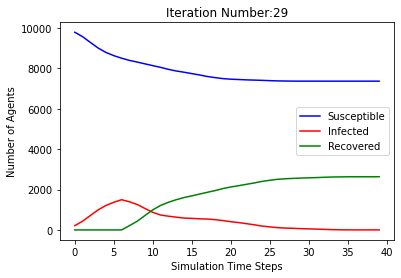

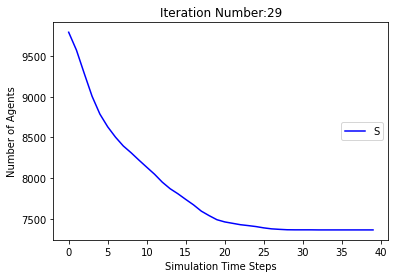

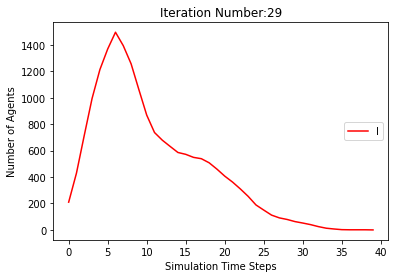

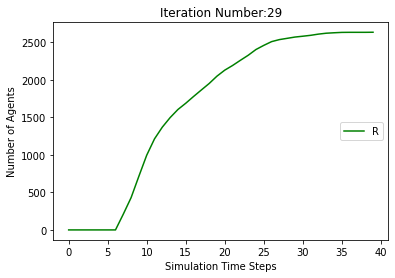

[9790, 9614, 9334, 9045, 8832, 8671, 8559, 8485, 8418, 8355, 8298, 8225, 8138, 8049, 7983, 7911, 7855, 7811, 7759, 7709, 7642, 7586, 7532, 7477, 7437, 7412, 7401, 7393, 7385, 7379, 7374, 7368, 7359, 7353, 7347, 7344, 7340, 7339, 7339, 7339, 7339, 7339, 7339, 7339, 7339]
[210, 386, 666, 955, 1168, 1329, 1441, 1305, 1196, 979, 747, 607, 533, 510, 502, 507, 500, 487, 466, 429, 407, 397, 379, 378, 374, 347, 308, 249, 201, 153, 103, 69, 53, 48, 46, 41, 39, 35, 29, 20, 14, 8, 5, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 386, 666, 955, 1168, 1329, 1441, 1515, 1582, 1645, 1702, 1775, 1862, 1951, 2017, 2089, 2145, 2189, 2241, 2291, 2358, 2414, 2468, 2523, 2563, 2588, 2599, 2607, 2615, 2621, 2626, 2632, 2641, 2647, 2653, 2656, 2660, 2661]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035

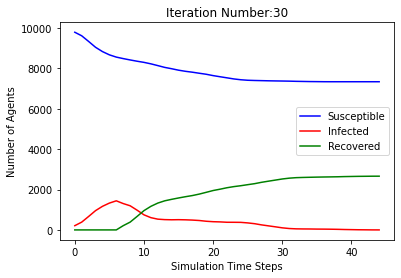

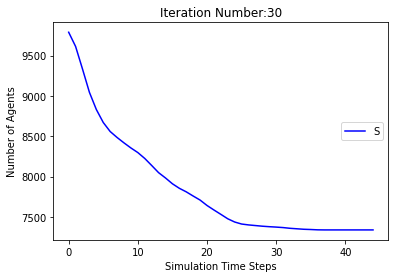

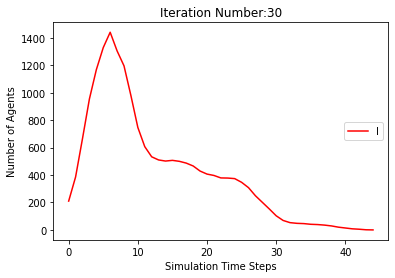

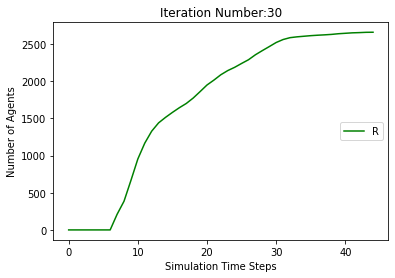

[9790, 9584, 9304, 8993, 8797, 8636, 8501, 8367, 8243, 8137, 8034, 7932, 7843, 7765, 7709, 7645, 7584, 7544, 7506, 7476, 7458, 7440, 7421, 7400, 7378, 7351, 7326, 7314, 7302, 7292, 7290, 7287, 7284, 7278, 7273, 7266, 7260, 7256, 7252, 7250, 7250, 7250, 7249, 7249, 7248, 7248, 7248, 7248, 7248, 7248, 7248, 7248]
[210, 416, 696, 1007, 1203, 1364, 1499, 1423, 1341, 1167, 959, 865, 793, 736, 658, 598, 553, 490, 426, 367, 307, 269, 224, 184, 166, 155, 150, 144, 138, 129, 110, 91, 67, 48, 41, 36, 32, 34, 35, 34, 28, 23, 17, 11, 8, 4, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 416, 696, 1007, 1203, 1364, 1499, 1633, 1757, 1863, 1966, 2068, 2157, 2235, 2291, 2355, 2416, 2456, 2494, 2524, 2542, 2560, 2579, 2600, 2622, 2649, 2674, 2686, 2698, 2708, 2710, 2713, 2716, 2722, 2727, 2734, 2740, 2744, 2748, 2750, 2750, 2750, 2751, 2751, 2752]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 788

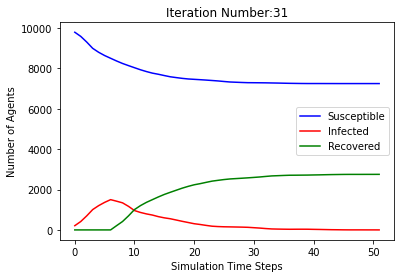

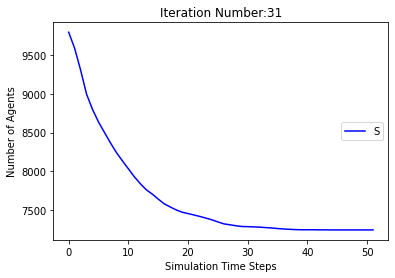

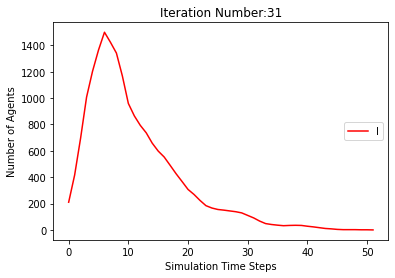

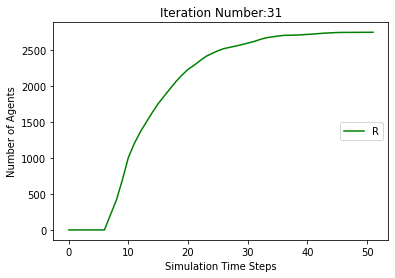

[9790, 9593, 9327, 9073, 8865, 8723, 8612, 8527, 8446, 8374, 8314, 8241, 8162, 8076, 8018, 7969, 7928, 7903, 7882, 7863, 7838, 7823, 7813, 7800, 7784, 7776, 7765, 7758, 7751, 7743, 7736, 7731, 7729, 7728, 7728, 7728, 7727, 7727, 7727, 7727, 7727, 7727, 7727, 7727]
[210, 407, 673, 927, 1135, 1277, 1388, 1263, 1147, 953, 759, 624, 561, 536, 509, 477, 446, 411, 359, 299, 238, 195, 156, 128, 119, 106, 98, 80, 72, 70, 64, 53, 47, 37, 30, 23, 16, 9, 4, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 407, 673, 927, 1135, 1277, 1388, 1473, 1554, 1626, 1686, 1759, 1838, 1924, 1982, 2031, 2072, 2097, 2118, 2137, 2162, 2177, 2187, 2200, 2216, 2224, 2235, 2242, 2249, 2257, 2264, 2269, 2271, 2272, 2272, 2272, 2273]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467

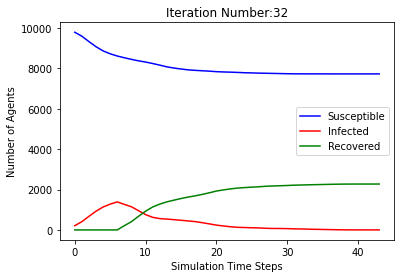

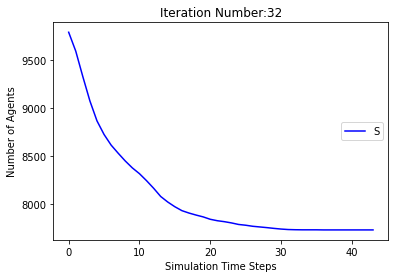

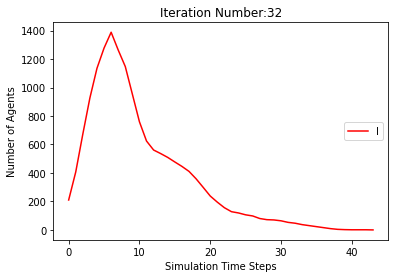

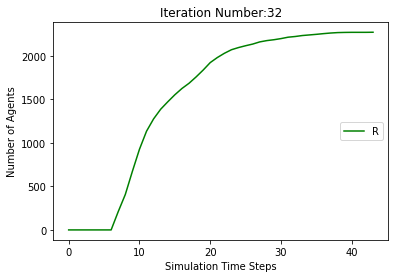

[9790, 9593, 9324, 9075, 8872, 8756, 8678, 8635, 8592, 8532, 8490, 8431, 8393, 8347, 8300, 8265, 8232, 8212, 8193, 8176, 8153, 8136, 8120, 8104, 8099, 8090, 8085, 8083, 8082, 8082, 8082, 8082, 8082, 8082, 8082, 8082]
[210, 407, 676, 925, 1128, 1244, 1322, 1155, 1001, 792, 585, 441, 363, 331, 335, 327, 300, 278, 238, 217, 194, 164, 145, 128, 113, 103, 91, 70, 54, 38, 22, 17, 8, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 407, 676, 925, 1128, 1244, 1322, 1365, 1408, 1468, 1510, 1569, 1607, 1653, 1700, 1735, 1768, 1788, 1807, 1824, 1847, 1864, 1880, 1896, 1901, 1910, 1915, 1917, 1918]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 796

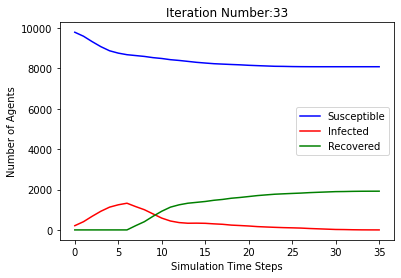

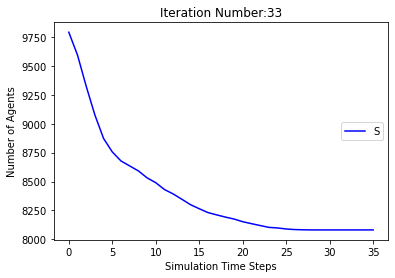

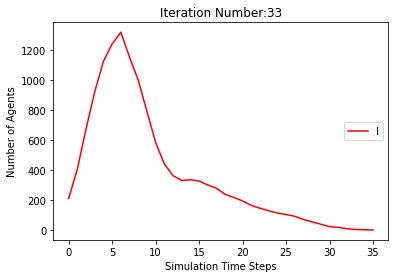

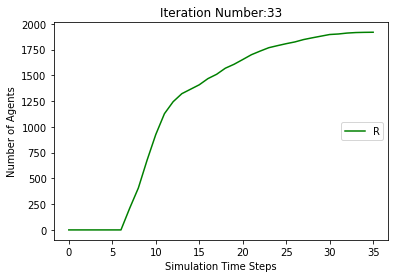

[9790, 9567, 9300, 9005, 8781, 8640, 8547, 8487, 8429, 8372, 8309, 8231, 8155, 8083, 8011, 7957, 7914, 7875, 7847, 7833, 7820, 7811, 7801, 7795, 7790, 7787, 7785, 7785, 7785, 7782, 7781, 7779, 7775, 7772, 7772, 7772, 7771, 7771, 7771, 7771, 7771, 7771, 7769, 7765, 7760, 7760, 7760, 7760, 7759, 7757, 7757, 7757, 7757, 7757, 7757, 7757, 7757]
[210, 433, 700, 995, 1219, 1360, 1453, 1303, 1138, 928, 696, 550, 485, 464, 476, 472, 458, 434, 384, 322, 263, 200, 156, 119, 85, 60, 48, 35, 26, 19, 14, 11, 12, 13, 13, 13, 11, 10, 8, 4, 1, 1, 3, 6, 11, 11, 11, 11, 12, 12, 8, 3, 3, 3, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 433, 700, 995, 1219, 1360, 1453, 1513, 1571, 1628, 1691, 1769, 1845, 1917, 1989, 2043, 2086, 2125, 2153, 2167, 2180, 2189, 2199, 2205, 2210, 2213, 2215, 2215, 2215, 2218, 2219, 2221, 2225, 2228, 2228, 2228, 2229, 2229, 2229, 2229, 2229, 2229, 2231, 2235, 2240, 2240, 2240, 2240, 2241, 2243]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037

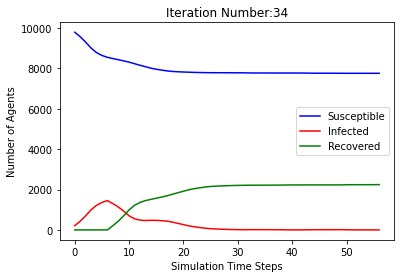

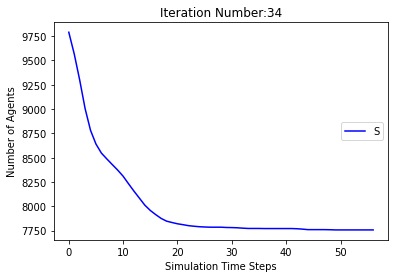

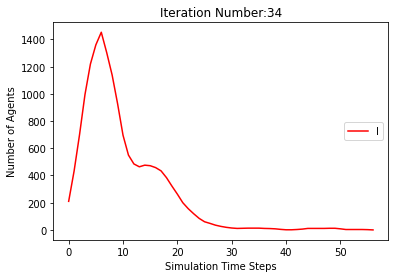

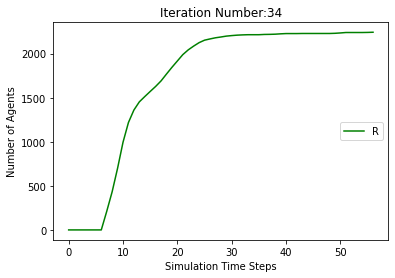

[9790, 9573, 9288, 9015, 8820, 8686, 8606, 8531, 8467, 8406, 8346, 8283, 8239, 8192, 8159, 8142, 8131, 8122, 8120, 8119, 8119, 8119, 8119, 8119, 8119, 8119, 8119]
[210, 427, 712, 985, 1180, 1314, 1394, 1259, 1106, 882, 669, 537, 447, 414, 372, 325, 275, 224, 163, 120, 73, 40, 23, 12, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 427, 712, 985, 1180, 1314, 1394, 1469, 1533, 1594, 1654, 1717, 1761, 1808, 1841, 1858, 1869, 1878, 1880, 1881]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963], [9790, 9585, 9311, 9047, 8845, 8674, 8545, 8396, 8271, 8182, 8095, 8003, 7895, 7779, 7659, 7544, 7443, 7357, 

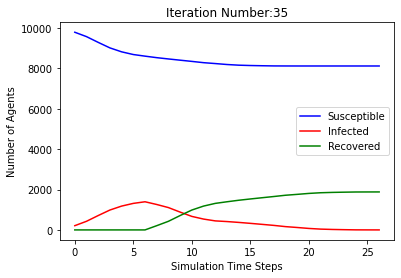

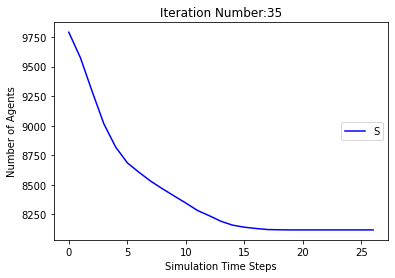

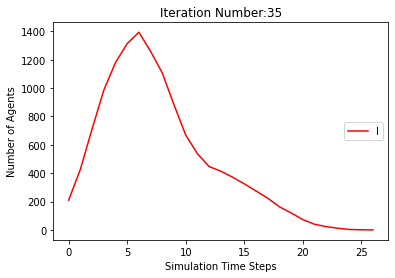

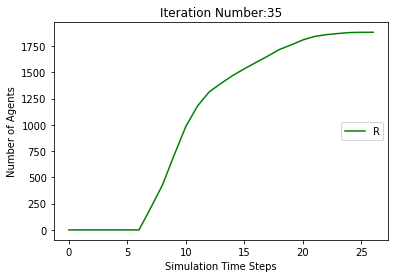

[9790, 9592, 9305, 9042, 8843, 8692, 8589, 8509, 8450, 8401, 8343, 8291, 8220, 8149, 8090, 8042, 7992, 7957, 7919, 7880, 7833, 7784, 7754, 7732, 7707, 7688, 7675, 7661, 7646, 7634, 7626, 7616, 7607, 7603, 7600, 7593, 7589, 7588, 7586, 7583, 7580, 7573, 7564, 7557, 7554, 7553, 7551, 7550, 7549, 7548, 7548, 7548, 7548, 7548, 7548, 7548, 7548]
[210, 408, 695, 958, 1157, 1308, 1411, 1281, 1142, 904, 699, 552, 472, 440, 419, 408, 409, 386, 372, 340, 316, 306, 288, 260, 250, 231, 205, 172, 138, 120, 106, 91, 81, 72, 61, 53, 45, 38, 30, 24, 23, 27, 29, 32, 34, 33, 32, 30, 24, 16, 9, 6, 5, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 408, 695, 958, 1157, 1308, 1411, 1491, 1550, 1599, 1657, 1709, 1780, 1851, 1910, 1958, 2008, 2043, 2081, 2120, 2167, 2216, 2246, 2268, 2293, 2312, 2325, 2339, 2354, 2366, 2374, 2384, 2393, 2397, 2400, 2407, 2411, 2412, 2414, 2417, 2420, 2427, 2436, 2443, 2446, 2447, 2449, 2450, 2451, 2452]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 814

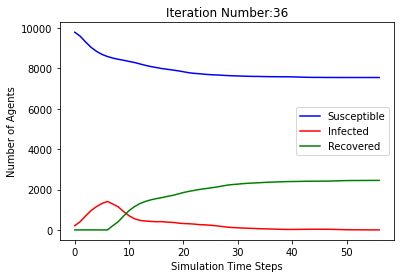

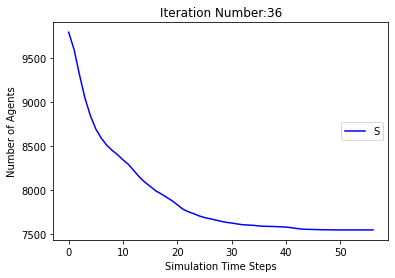

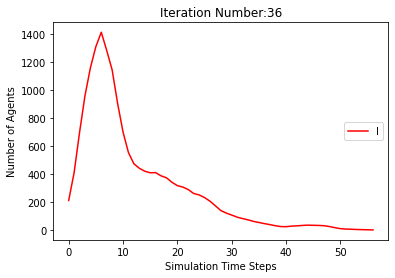

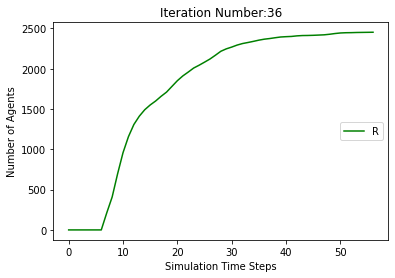

[9790, 9577, 9300, 9023, 8828, 8707, 8616, 8552, 8509, 8462, 8420, 8376, 8344, 8303, 8253, 8221, 8179, 8155, 8139, 8128, 8123, 8120, 8118, 8115, 8114, 8112, 8111, 8111, 8111, 8111, 8111, 8111, 8111, 8111]
[210, 423, 700, 977, 1172, 1293, 1384, 1238, 1068, 838, 603, 452, 363, 313, 299, 288, 283, 265, 237, 216, 180, 133, 103, 64, 41, 27, 17, 12, 9, 7, 4, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 423, 700, 977, 1172, 1293, 1384, 1448, 1491, 1538, 1580, 1624, 1656, 1697, 1747, 1779, 1821, 1845, 1861, 1872, 1877, 1880, 1882, 1885, 1886, 1888, 1889]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963

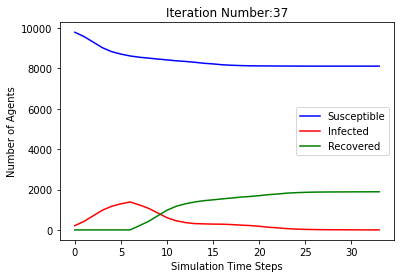

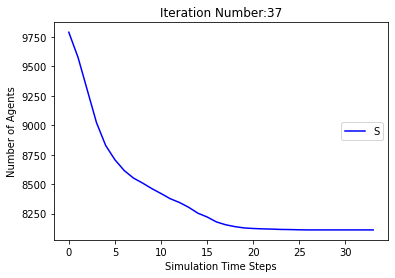

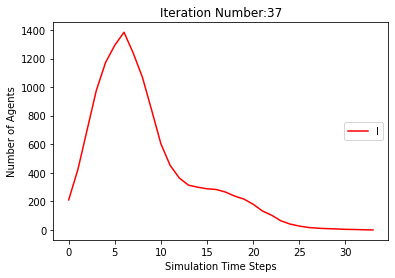

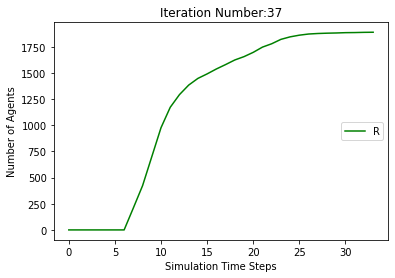

[9790, 9573, 9291, 9032, 8832, 8675, 8546, 8421, 8329, 8224, 8112, 8010, 7909, 7798, 7681, 7577, 7467, 7365, 7279, 7187, 7108, 7021, 6961, 6881, 6830, 6764, 6710, 6642, 6588, 6515, 6478, 6440, 6405, 6366, 6333, 6311, 6281, 6251, 6232, 6220, 6210, 6200, 6191, 6188, 6187, 6187, 6187, 6187, 6187, 6187, 6187, 6187]
[210, 427, 709, 968, 1168, 1325, 1454, 1369, 1244, 1067, 920, 822, 766, 748, 740, 752, 757, 747, 731, 722, 690, 660, 616, 586, 535, 515, 477, 466, 433, 446, 403, 390, 359, 344, 309, 277, 234, 227, 208, 185, 156, 133, 120, 93, 64, 45, 33, 23, 13, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 427, 709, 968, 1168, 1325, 1454, 1579, 1671, 1776, 1888, 1990, 2091, 2202, 2319, 2423, 2533, 2635, 2721, 2813, 2892, 2979, 3039, 3119, 3170, 3236, 3290, 3358, 3412, 3485, 3522, 3560, 3595, 3634, 3667, 3689, 3719, 3749, 3768, 3780, 3790, 3800, 3809, 3812, 3813]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 

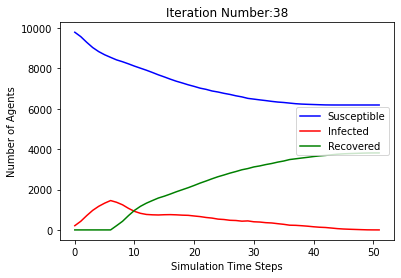

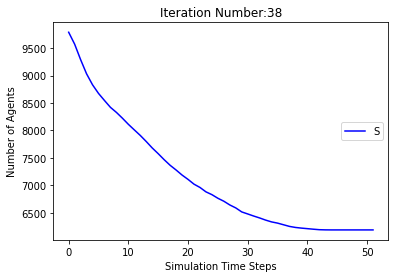

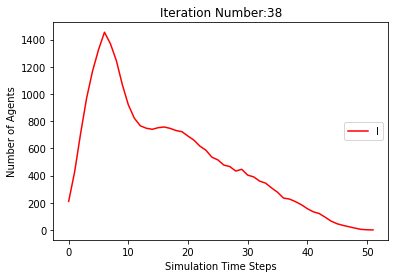

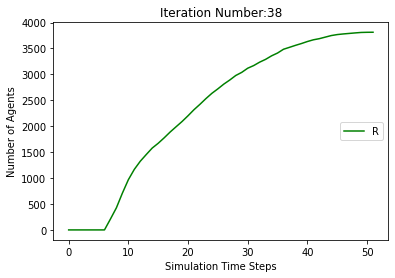

[9790, 9578, 9293, 9020, 8816, 8683, 8577, 8490, 8422, 8335, 8196, 8057, 7883, 7726, 7574, 7437, 7309, 7181, 7037, 6896, 6740, 6588, 6444, 6302, 6150, 6009, 5850, 5713, 5605, 5514, 5424, 5361, 5315, 5281, 5256, 5227, 5201, 5187, 5175, 5164, 5152, 5143, 5132, 5126, 5119, 5113, 5108, 5102, 5100, 5096, 5094, 5091, 5088, 5085, 5082, 5079, 5078, 5078, 5077, 5075, 5075, 5075, 5075, 5075, 5075, 5075, 5075]
[210, 422, 707, 980, 1184, 1317, 1423, 1300, 1156, 958, 824, 759, 800, 851, 916, 985, 1026, 1015, 1020, 987, 986, 986, 993, 1007, 1031, 1028, 1046, 1027, 983, 930, 878, 789, 694, 569, 457, 378, 313, 237, 186, 151, 129, 113, 95, 75, 68, 62, 56, 50, 43, 36, 32, 28, 25, 23, 20, 21, 18, 16, 14, 13, 10, 7, 4, 3, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 422, 707, 980, 1184, 1317, 1423, 1510, 1578, 1665, 1804, 1943, 2117, 2274, 2426, 2563, 2691, 2819, 2963, 3104, 3260, 3412, 3556, 3698, 3850, 3991, 4150, 4287, 4395, 4486, 4576, 4639, 4685, 4719, 4744, 4773, 4799, 4813, 4825, 4836, 4848, 4857, 4868, 487

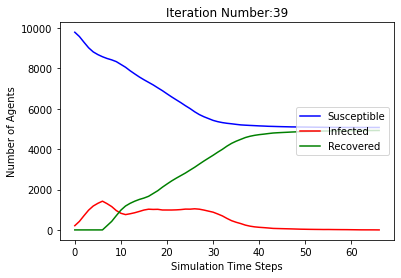

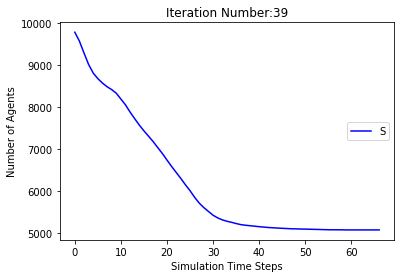

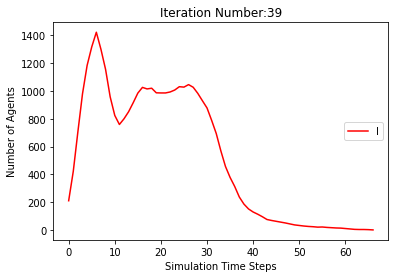

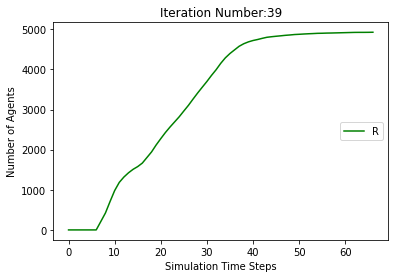

[9790, 9588, 9327, 9042, 8804, 8650, 8519, 8396, 8320, 8197, 8064, 7932, 7825, 7740, 7647, 7572, 7486, 7422, 7355, 7300, 7263, 7232, 7202, 7187, 7179, 7173, 7166, 7159, 7156, 7155, 7155, 7155, 7155, 7155, 7155, 7155, 7155]
[210, 412, 673, 958, 1196, 1350, 1481, 1394, 1268, 1130, 978, 872, 825, 779, 749, 748, 711, 642, 577, 525, 477, 415, 370, 299, 243, 182, 134, 104, 76, 47, 32, 24, 18, 11, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 412, 673, 958, 1196, 1350, 1481, 1604, 1680, 1803, 1936, 2068, 2175, 2260, 2353, 2428, 2514, 2578, 2645, 2700, 2737, 2768, 2798, 2813, 2821, 2827, 2834, 2841, 2844, 2845]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7

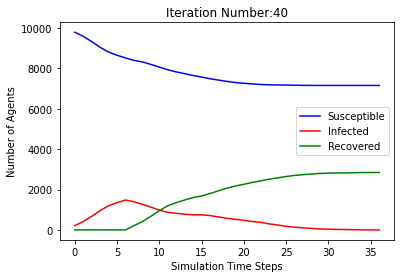

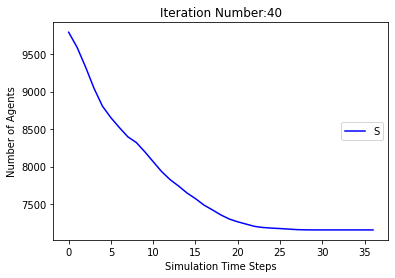

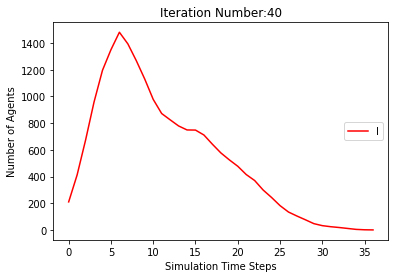

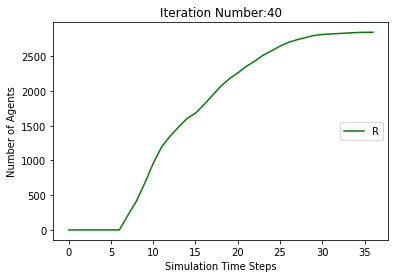

[9790, 9574, 9263, 8973, 8759, 8623, 8504, 8397, 8290, 8189, 8081, 7992, 7882, 7772, 7640, 7493, 7359, 7263, 7169, 7080, 6987, 6890, 6813, 6730, 6651, 6580, 6513, 6462, 6418, 6383, 6363, 6353, 6342, 6337, 6334, 6333, 6331, 6331, 6331, 6331, 6331, 6331, 6331, 6331]
[210, 426, 737, 1027, 1241, 1377, 1496, 1393, 1284, 1074, 892, 767, 741, 732, 757, 797, 830, 818, 823, 802, 785, 750, 680, 629, 612, 589, 567, 525, 472, 430, 367, 298, 238, 176, 128, 85, 52, 32, 22, 11, 6, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 426, 737, 1027, 1241, 1377, 1496, 1603, 1710, 1811, 1919, 2008, 2118, 2228, 2360, 2507, 2641, 2737, 2831, 2920, 3013, 3110, 3187, 3270, 3349, 3420, 3487, 3538, 3582, 3617, 3637, 3647, 3658, 3663, 3666, 3667, 3669]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8

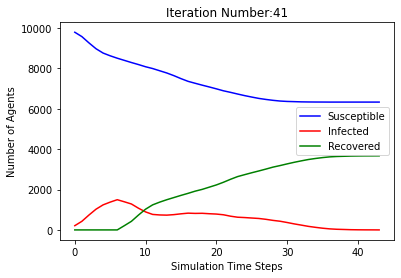

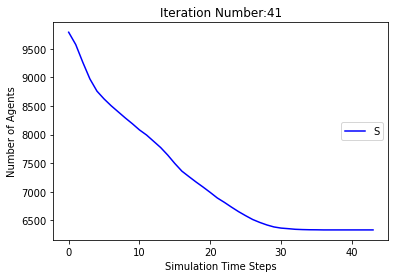

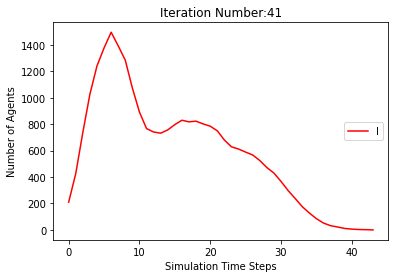

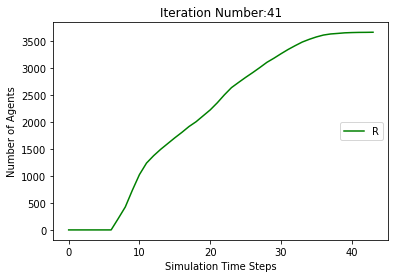

[9790, 9560, 9272, 9001, 8808, 8658, 8554, 8465, 8385, 8308, 8232, 8152, 8059, 7970, 7876, 7769, 7673, 7564, 7468, 7400, 7335, 7296, 7246, 7217, 7186, 7146, 7127, 7115, 7094, 7063, 7039, 7005, 6984, 6967, 6953, 6947, 6942, 6937, 6931, 6928, 6923, 6921, 6919, 6919, 6919, 6919, 6919, 6919, 6919, 6919]
[210, 440, 728, 999, 1192, 1342, 1446, 1325, 1175, 964, 769, 656, 599, 584, 589, 616, 635, 668, 684, 659, 635, 580, 523, 456, 378, 322, 273, 220, 202, 183, 178, 181, 162, 160, 162, 147, 121, 102, 74, 56, 44, 32, 28, 23, 18, 12, 9, 4, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 440, 728, 999, 1192, 1342, 1446, 1535, 1615, 1692, 1768, 1848, 1941, 2030, 2124, 2231, 2327, 2436, 2532, 2600, 2665, 2704, 2754, 2783, 2814, 2854, 2873, 2885, 2906, 2937, 2961, 2995, 3016, 3033, 3047, 3053, 3058, 3063, 3069, 3072, 3077, 3079, 3081]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 787

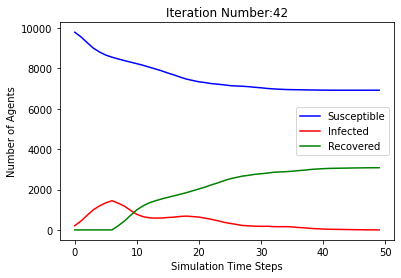

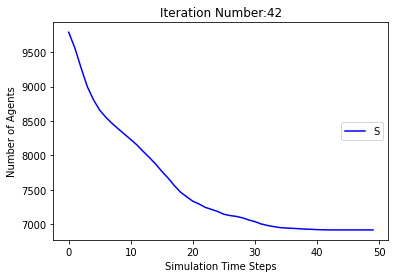

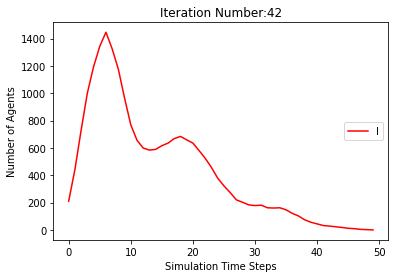

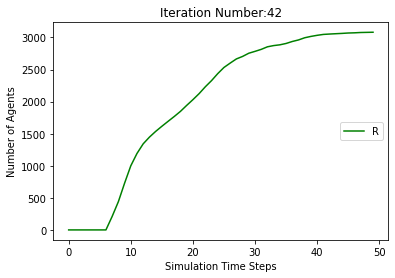

[9790, 9579, 9293, 9034, 8785, 8617, 8491, 8394, 8300, 8166, 8021, 7860, 7671, 7474, 7263, 7070, 6899, 6733, 6594, 6448, 6315, 6202, 6096, 6017, 5952, 5899, 5864, 5833, 5807, 5778, 5761, 5747, 5739, 5737, 5736, 5736, 5736, 5736, 5736, 5736, 5736, 5736]
[210, 421, 707, 966, 1215, 1383, 1509, 1396, 1279, 1127, 1013, 925, 946, 1017, 1131, 1230, 1267, 1288, 1266, 1223, 1159, 1061, 974, 882, 781, 695, 584, 482, 395, 318, 256, 205, 160, 127, 97, 71, 42, 25, 11, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 421, 707, 966, 1215, 1383, 1509, 1606, 1700, 1834, 1979, 2140, 2329, 2526, 2737, 2930, 3101, 3267, 3406, 3552, 3685, 3798, 3904, 3983, 4048, 4101, 4136, 4167, 4193, 4222, 4239, 4253, 4261, 4263, 4264]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8

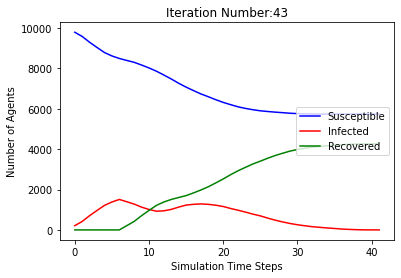

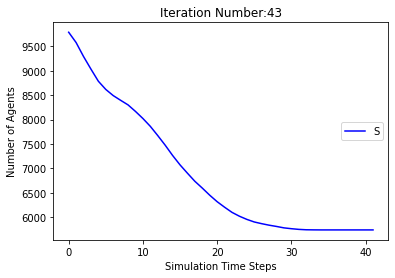

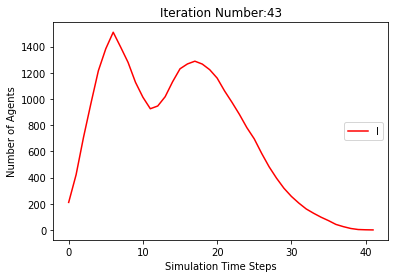

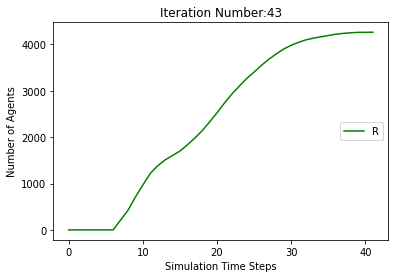

[9790, 9577, 9294, 9011, 8791, 8644, 8538, 8474, 8391, 8246, 8105, 7926, 7747, 7571, 7391, 7201, 7018, 6841, 6693, 6530, 6342, 6170, 5963, 5752, 5570, 5413, 5235, 5083, 4920, 4734, 4578, 4427, 4280, 4128, 3996, 3871, 3759, 3671, 3602, 3553, 3516, 3484, 3458, 3434, 3415, 3402, 3394, 3390, 3387, 3382, 3379, 3379, 3377, 3376, 3375, 3375, 3375, 3375, 3375, 3375, 3375, 3375]
[210, 423, 706, 989, 1209, 1356, 1462, 1316, 1186, 1048, 906, 865, 897, 967, 1083, 1190, 1228, 1264, 1233, 1217, 1229, 1221, 1238, 1266, 1271, 1280, 1295, 1259, 1250, 1229, 1174, 1143, 1133, 1107, 1087, 1049, 975, 907, 825, 727, 612, 512, 413, 325, 256, 200, 159, 126, 97, 76, 55, 36, 25, 18, 15, 12, 7, 4, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 423, 706, 989, 1209, 1356, 1462, 1526, 1609, 1754, 1895, 2074, 2253, 2429, 2609, 2799, 2982, 3159, 3307, 3470, 3658, 3830, 4037, 4248, 4430, 4587, 4765, 4917, 5080, 5266, 5422, 5573, 5720, 5872, 6004, 6129, 6241, 6329, 6398, 6447, 6484, 6516, 6542, 6566, 6585, 6598, 6606, 6610, 66

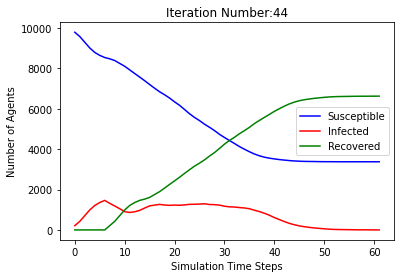

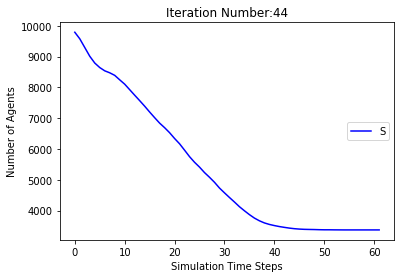

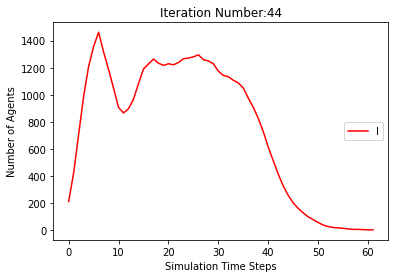

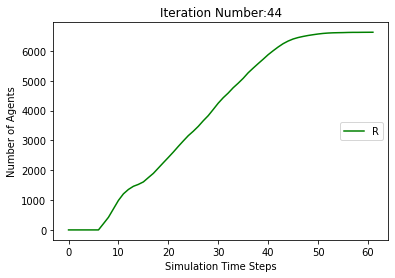

[9790, 9588, 9314, 9010, 8798, 8641, 8508, 8369, 8256, 8112, 7969, 7858, 7770, 7680, 7582, 7498, 7415, 7334, 7270, 7219, 7182, 7156, 7134, 7109, 7096, 7084, 7080, 7079, 7076, 7072, 7068, 7067, 7066, 7064, 7064, 7063, 7063, 7063, 7063, 7063, 7063, 7063, 7061, 7059, 7059, 7059, 7059, 7059, 7059, 7059, 7059]
[210, 412, 686, 990, 1202, 1359, 1492, 1421, 1332, 1202, 1041, 940, 871, 828, 787, 758, 697, 635, 588, 551, 498, 426, 364, 306, 238, 186, 139, 103, 80, 62, 41, 29, 18, 16, 15, 13, 9, 5, 4, 3, 1, 1, 2, 4, 4, 4, 4, 4, 4, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 412, 686, 990, 1202, 1359, 1492, 1631, 1744, 1888, 2031, 2142, 2230, 2320, 2418, 2502, 2585, 2666, 2730, 2781, 2818, 2844, 2866, 2891, 2904, 2916, 2920, 2921, 2924, 2928, 2932, 2933, 2934, 2936, 2936, 2937, 2937, 2937, 2937, 2937, 2937, 2937, 2939, 2941]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 

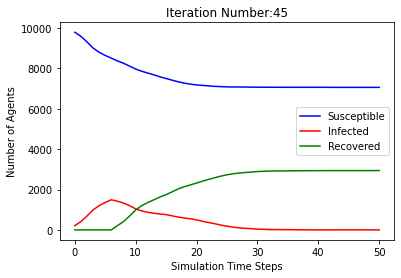

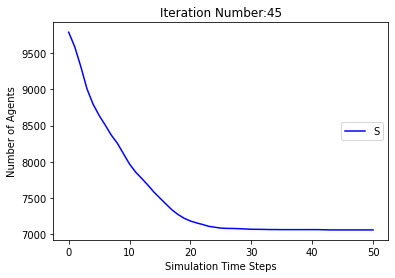

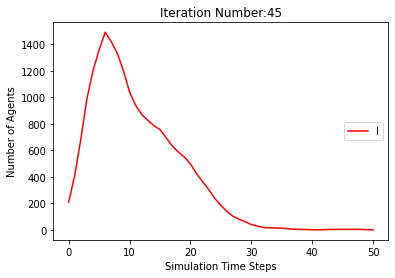

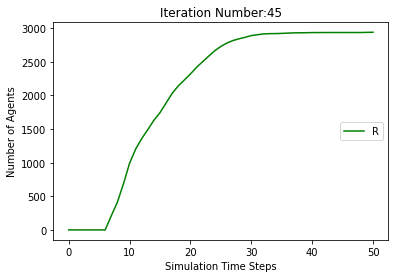

[9790, 9581, 9287, 9025, 8840, 8702, 8595, 8494, 8393, 8263, 8114, 7975, 7809, 7667, 7532, 7386, 7242, 7111, 6987, 6861, 6744, 6627, 6533, 6449, 6360, 6288, 6235, 6196, 6150, 6116, 6088, 6060, 6042, 6030, 6020, 6010, 6002, 5990, 5989, 5989, 5987, 5985, 5983, 5979, 5978, 5977, 5977, 5977, 5977, 5977, 5977, 5977, 5977]
[210, 419, 713, 975, 1160, 1298, 1405, 1296, 1188, 1024, 911, 865, 893, 928, 962, 1007, 1021, 1003, 988, 948, 923, 905, 853, 793, 751, 699, 626, 548, 477, 417, 361, 300, 246, 205, 176, 140, 114, 98, 71, 53, 43, 35, 27, 23, 12, 12, 12, 10, 8, 6, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 419, 713, 975, 1160, 1298, 1405, 1506, 1607, 1737, 1886, 2025, 2191, 2333, 2468, 2614, 2758, 2889, 3013, 3139, 3256, 3373, 3467, 3551, 3640, 3712, 3765, 3804, 3850, 3884, 3912, 3940, 3958, 3970, 3980, 3990, 3998, 4010, 4011, 4011, 4013, 4015, 4017, 4021, 4022, 4023]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7

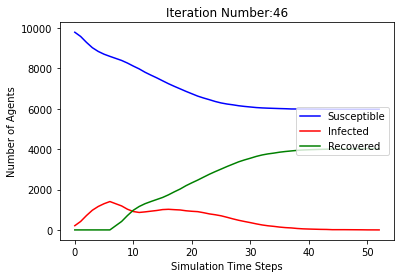

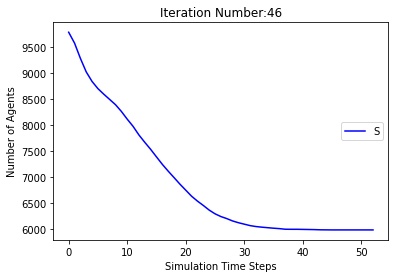

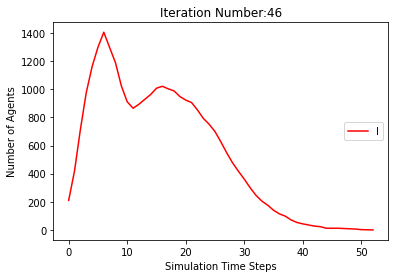

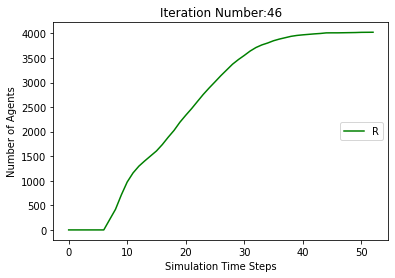

[9790, 9562, 9267, 8993, 8785, 8635, 8524, 8452, 8399, 8345, 8287, 8225, 8157, 8095, 8032, 7988, 7944, 7897, 7871, 7851, 7838, 7833, 7824, 7816, 7811, 7810, 7810, 7810, 7810, 7810, 7810, 7810, 7810]
[210, 438, 733, 1007, 1215, 1365, 1476, 1338, 1163, 922, 706, 560, 478, 429, 420, 411, 401, 390, 354, 306, 257, 199, 164, 128, 86, 61, 41, 28, 23, 14, 6, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 438, 733, 1007, 1215, 1365, 1476, 1548, 1601, 1655, 1713, 1775, 1843, 1905, 1968, 2012, 2056, 2103, 2129, 2149, 2162, 2167, 2176, 2184, 2189, 2190]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963], [9790, 

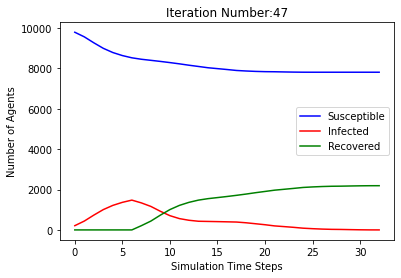

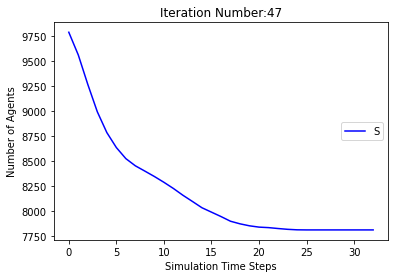

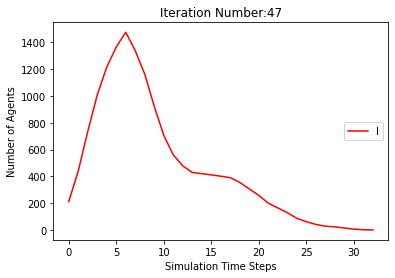

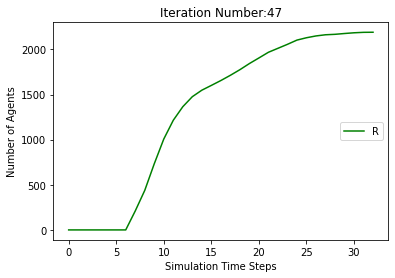

[9790, 9591, 9310, 9026, 8815, 8668, 8585, 8515, 8461, 8398, 8321, 8209, 8093, 7971, 7858, 7740, 7636, 7549, 7483, 7438, 7383, 7333, 7284, 7241, 7209, 7182, 7146, 7117, 7087, 7064, 7047, 7022, 7010, 6995, 6989, 6983, 6979, 6976, 6975, 6975, 6975, 6975, 6974, 6973, 6973, 6973, 6973, 6973, 6973, 6973, 6973]
[210, 409, 690, 974, 1185, 1332, 1415, 1275, 1130, 912, 705, 606, 575, 614, 657, 721, 762, 772, 726, 655, 588, 525, 456, 395, 340, 301, 292, 266, 246, 220, 194, 187, 172, 151, 128, 104, 85, 71, 47, 35, 20, 14, 9, 6, 3, 2, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 409, 690, 974, 1185, 1332, 1415, 1485, 1539, 1602, 1679, 1791, 1907, 2029, 2142, 2260, 2364, 2451, 2517, 2562, 2617, 2667, 2716, 2759, 2791, 2818, 2854, 2883, 2913, 2936, 2953, 2978, 2990, 3005, 3011, 3017, 3021, 3024, 3025, 3025, 3025, 3025, 3026, 3027]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 

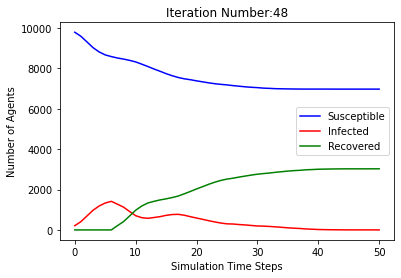

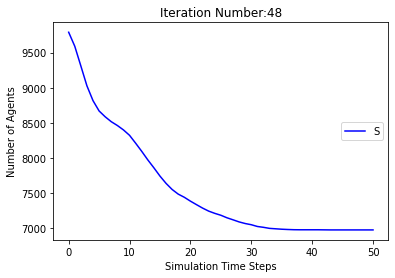

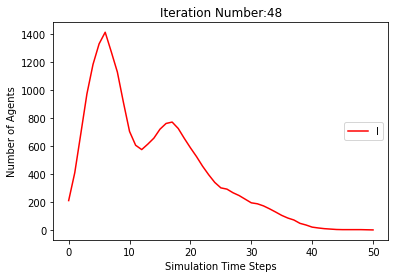

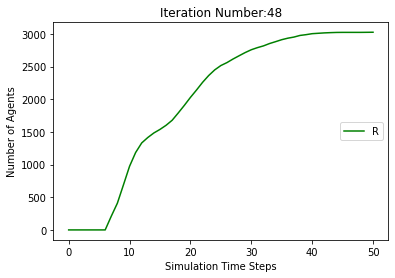

[9790, 9593, 9329, 9053, 8835, 8688, 8593, 8523, 8470, 8423, 8380, 8328, 8288, 8242, 8214, 8189, 8178, 8168, 8159, 8153, 8151, 8151, 8151, 8151, 8151, 8151, 8151, 8151]
[210, 407, 671, 947, 1165, 1312, 1407, 1267, 1123, 906, 673, 507, 400, 351, 309, 281, 245, 212, 169, 135, 91, 63, 38, 27, 17, 8, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 407, 671, 947, 1165, 1312, 1407, 1477, 1530, 1577, 1620, 1672, 1712, 1758, 1786, 1811, 1822, 1832, 1841, 1847, 1849]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963], [9790, 9585, 9311, 9047, 8845, 8674, 8545, 8396, 8271, 8182, 8095, 8003, 7895, 7779, 7659, 75

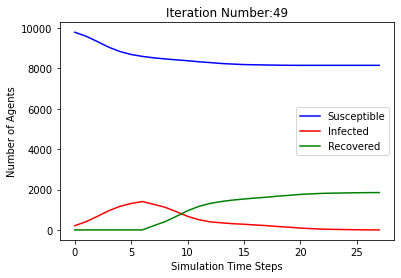

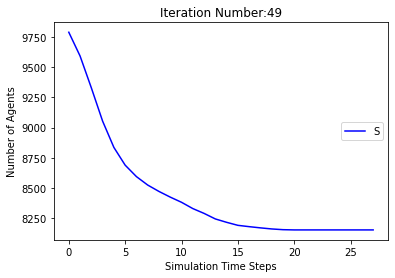

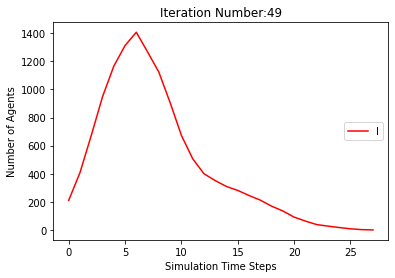

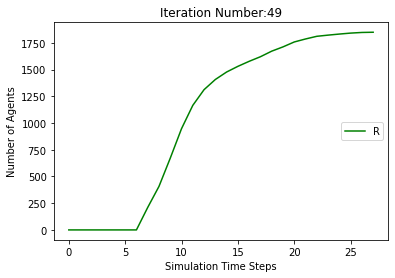

[9790, 9589, 9310, 9025, 8813, 8673, 8575, 8440, 8267, 8070, 7893, 7749, 7597, 7464, 7348, 7219, 7081, 6940, 6788, 6661, 6557, 6467, 6398, 6348, 6320, 6298, 6288, 6276, 6270, 6265, 6264, 6264, 6264, 6264, 6264, 6264, 6264, 6264]
[210, 411, 690, 975, 1187, 1327, 1425, 1350, 1322, 1240, 1132, 1064, 1076, 1111, 1092, 1048, 989, 953, 961, 936, 907, 881, 821, 733, 620, 490, 373, 281, 197, 133, 84, 56, 34, 24, 12, 6, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 411, 690, 975, 1187, 1327, 1425, 1560, 1733, 1930, 2107, 2251, 2403, 2536, 2652, 2781, 2919, 3060, 3212, 3339, 3443, 3533, 3602, 3652, 3680, 3702, 3712, 3724, 3730, 3735, 3736]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8

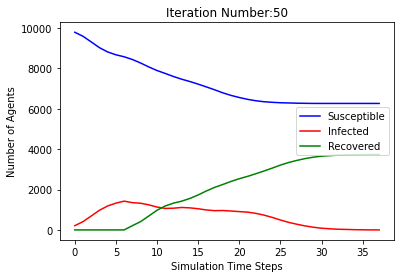

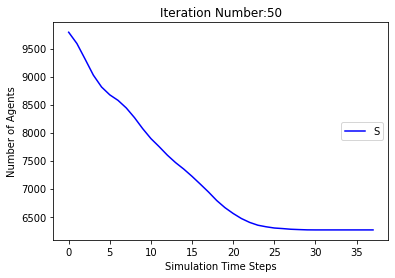

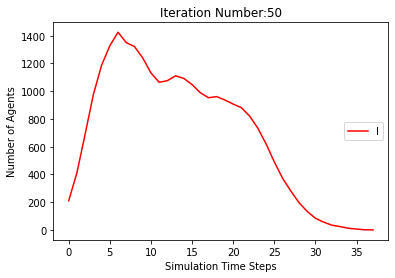

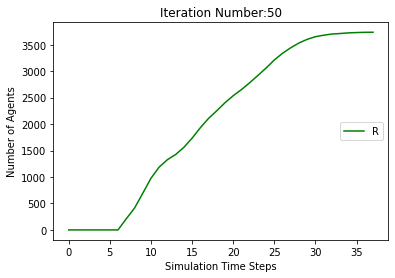

[9790, 9591, 9315, 9040, 8825, 8710, 8640, 8583, 8532, 8470, 8412, 8333, 8264, 8203, 8150, 8122, 8101, 8080, 8053, 8034, 8018, 8006, 7987, 7978, 7971, 7966, 7964, 7964, 7964, 7964, 7964, 7964, 7964, 7964]
[210, 409, 685, 960, 1175, 1290, 1360, 1207, 1059, 845, 628, 492, 446, 437, 433, 410, 369, 332, 280, 230, 185, 144, 135, 123, 109, 87, 70, 54, 42, 23, 14, 7, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 409, 685, 960, 1175, 1290, 1360, 1417, 1468, 1530, 1588, 1667, 1736, 1797, 1850, 1878, 1899, 1920, 1947, 1966, 1982, 1994, 2013, 2022, 2029, 2034, 2036]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963,

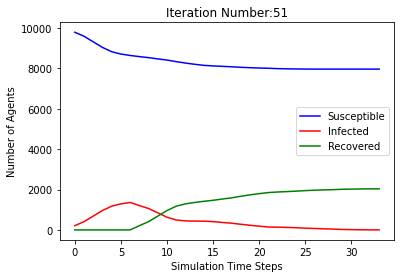

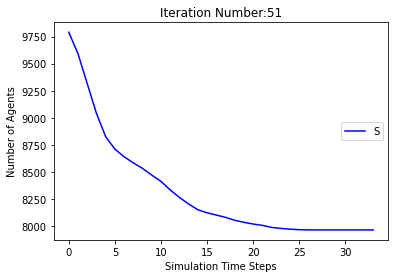

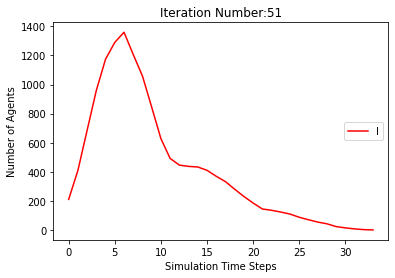

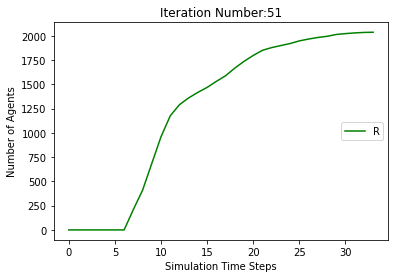

[9790, 9564, 9281, 8999, 8799, 8668, 8566, 8469, 8395, 8318, 8243, 8173, 8110, 8051, 7980, 7924, 7872, 7841, 7818, 7799, 7781, 7766, 7749, 7741, 7735, 7731, 7726, 7722, 7718, 7711, 7708, 7705, 7701, 7699, 7695, 7694, 7691, 7689, 7689, 7687, 7686, 7682, 7680, 7674, 7668, 7661, 7657, 7655, 7654, 7654, 7654, 7654, 7654, 7654, 7654, 7654]
[210, 436, 719, 1001, 1201, 1332, 1434, 1321, 1169, 963, 756, 626, 558, 515, 489, 471, 446, 402, 355, 311, 270, 214, 175, 131, 106, 87, 73, 59, 48, 38, 33, 30, 30, 27, 27, 24, 20, 19, 16, 14, 13, 13, 14, 17, 21, 28, 30, 31, 28, 26, 20, 14, 7, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 436, 719, 1001, 1201, 1332, 1434, 1531, 1605, 1682, 1757, 1827, 1890, 1949, 2020, 2076, 2128, 2159, 2182, 2201, 2219, 2234, 2251, 2259, 2265, 2269, 2274, 2278, 2282, 2289, 2292, 2295, 2299, 2301, 2305, 2306, 2309, 2311, 2311, 2313, 2314, 2318, 2320, 2326, 2332, 2339, 2343, 2345, 2346]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 80

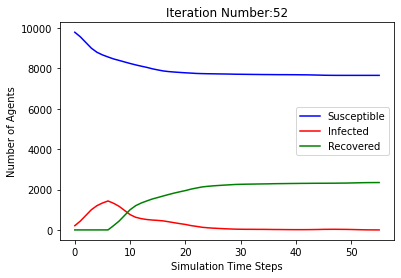

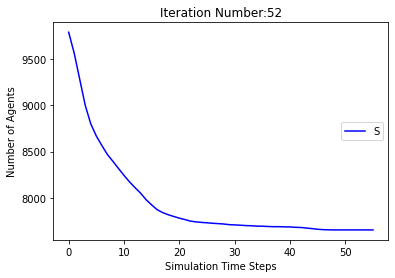

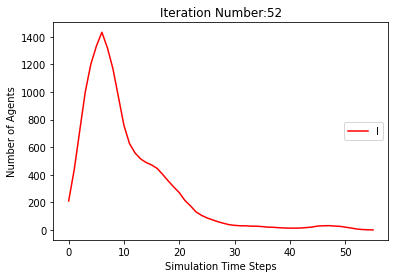

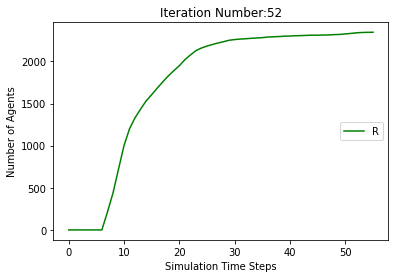

[9790, 9611, 9334, 9056, 8820, 8666, 8571, 8504, 8444, 8374, 8302, 8221, 8145, 8077, 8000, 7929, 7865, 7802, 7739, 7687, 7642, 7581, 7522, 7447, 7397, 7355, 7321, 7293, 7276, 7263, 7250, 7240, 7231, 7225, 7224, 7223, 7219, 7217, 7217, 7217, 7217, 7217, 7217, 7217, 7217]
[210, 389, 666, 944, 1180, 1334, 1429, 1286, 1167, 960, 754, 599, 521, 494, 504, 515, 509, 500, 482, 458, 435, 419, 407, 418, 405, 384, 366, 349, 305, 259, 197, 157, 124, 96, 69, 53, 44, 33, 23, 14, 8, 7, 6, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 389, 666, 944, 1180, 1334, 1429, 1496, 1556, 1626, 1698, 1779, 1855, 1923, 2000, 2071, 2135, 2198, 2261, 2313, 2358, 2419, 2478, 2553, 2603, 2645, 2679, 2707, 2724, 2737, 2750, 2760, 2769, 2775, 2776, 2777, 2781, 2783]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 903

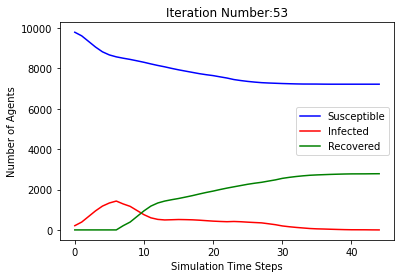

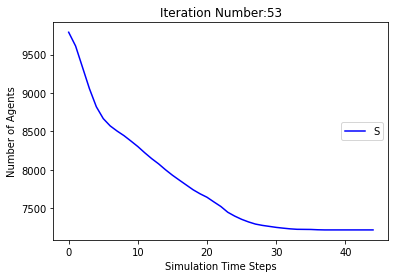

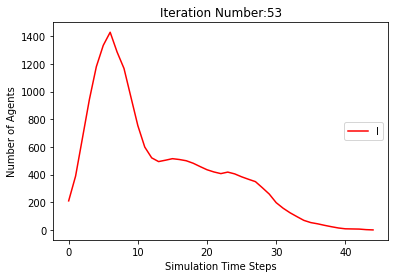

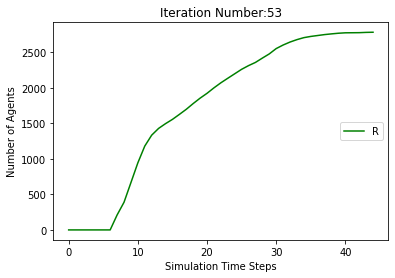

[9790, 9576, 9287, 9003, 8773, 8621, 8530, 8452, 8388, 8285, 8162, 8042, 7903, 7771, 7647, 7563, 7496, 7432, 7373, 7313, 7239, 7175, 7103, 7034, 6978, 6912, 6836, 6765, 6716, 6676, 6648, 6619, 6599, 6573, 6548, 6521, 6501, 6491, 6482, 6471, 6459, 6445, 6425, 6411, 6402, 6394, 6387, 6379, 6369, 6363, 6359, 6355, 6353, 6352, 6352, 6351, 6351, 6350, 6350, 6350, 6350, 6350, 6350, 6350, 6350]
[210, 424, 713, 997, 1227, 1379, 1470, 1338, 1188, 1002, 841, 731, 718, 759, 805, 825, 789, 730, 669, 590, 532, 472, 460, 462, 454, 461, 477, 474, 459, 427, 386, 359, 313, 263, 217, 195, 175, 157, 137, 128, 114, 103, 96, 90, 89, 88, 84, 80, 76, 62, 52, 47, 41, 35, 27, 18, 12, 9, 5, 3, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 424, 713, 997, 1227, 1379, 1470, 1548, 1612, 1715, 1838, 1958, 2097, 2229, 2353, 2437, 2504, 2568, 2627, 2687, 2761, 2825, 2897, 2966, 3022, 3088, 3164, 3235, 3284, 3324, 3352, 3381, 3401, 3427, 3452, 3479, 3499, 3509, 3518, 3529, 3541, 3555, 3575, 3589, 3598, 3606, 3613, 3621, 36

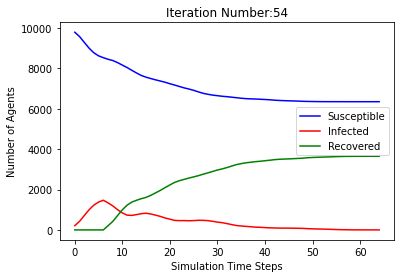

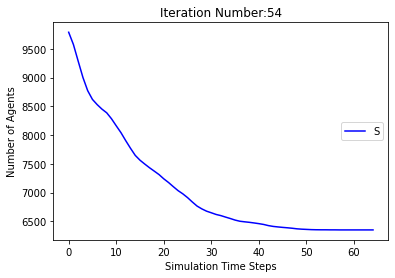

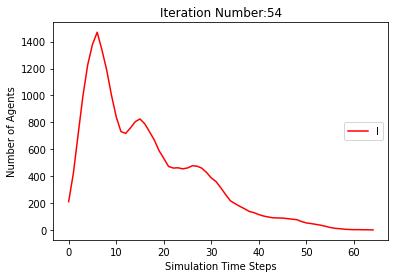

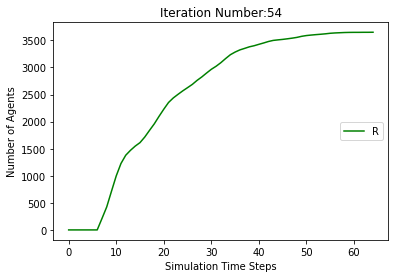

[9790, 9602, 9334, 9083, 8870, 8724, 8589, 8456, 8313, 8167, 8023, 7865, 7684, 7528, 7401, 7275, 7161, 7053, 6939, 6835, 6734, 6669, 6621, 6594, 6575, 6563, 6553, 6549, 6549, 6549, 6548, 6548, 6548, 6548, 6548, 6548, 6548, 6548]
[210, 398, 666, 917, 1130, 1276, 1411, 1334, 1289, 1167, 1060, 1005, 1040, 1061, 1055, 1038, 1006, 970, 926, 849, 794, 732, 654, 567, 478, 376, 282, 185, 120, 72, 46, 27, 15, 5, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 398, 666, 917, 1130, 1276, 1411, 1544, 1687, 1833, 1977, 2135, 2316, 2472, 2599, 2725, 2839, 2947, 3061, 3165, 3266, 3331, 3379, 3406, 3425, 3437, 3447, 3451, 3451, 3451, 3452]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 800

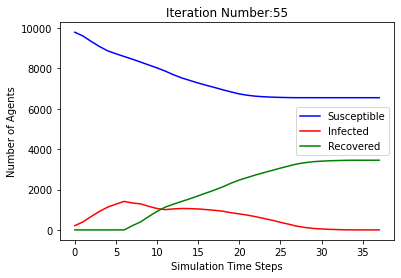

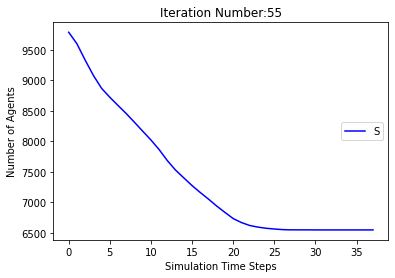

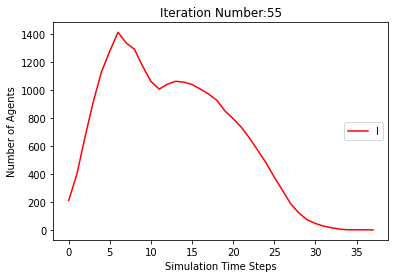

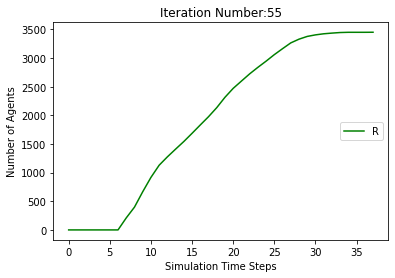

[9790, 9572, 9301, 9053, 8868, 8742, 8646, 8559, 8479, 8405, 8310, 8221, 8133, 8035, 7957, 7883, 7822, 7775, 7739, 7712, 7688, 7662, 7639, 7615, 7592, 7554, 7529, 7508, 7487, 7469, 7453, 7432, 7418, 7408, 7392, 7383, 7368, 7354, 7350, 7342, 7337, 7325, 7313, 7299, 7289, 7281, 7271, 7268, 7262, 7254, 7249, 7244, 7239, 7235, 7232, 7231, 7231, 7227, 7224, 7221, 7217, 7216, 7216, 7215, 7213, 7213, 7213, 7213, 7213, 7213, 7213, 7213]
[210, 428, 699, 947, 1132, 1258, 1354, 1231, 1093, 896, 743, 647, 609, 611, 602, 596, 583, 535, 482, 421, 347, 295, 244, 207, 183, 185, 183, 180, 175, 170, 162, 160, 136, 121, 116, 104, 101, 99, 82, 76, 71, 67, 70, 69, 65, 69, 71, 69, 63, 59, 50, 45, 42, 36, 36, 31, 23, 22, 20, 18, 18, 16, 15, 16, 14, 11, 8, 4, 3, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 428, 699, 947, 1132, 1258, 1354, 1441, 1521, 1595, 1690, 1779, 1867, 1965, 2043, 2117, 2178, 2225, 2261, 2288, 2312, 2338, 2361, 2385, 2408, 2446, 2471, 2492, 2513, 2531, 2547, 2568, 2582, 2592, 2608, 2617, 2632, 26

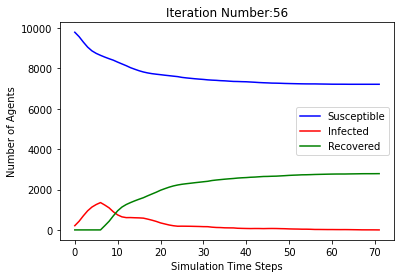

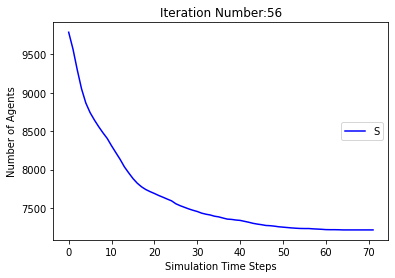

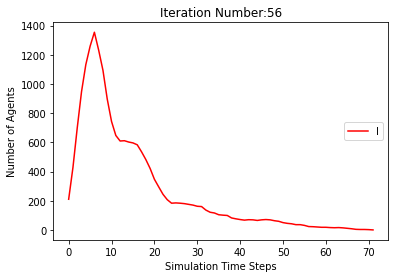

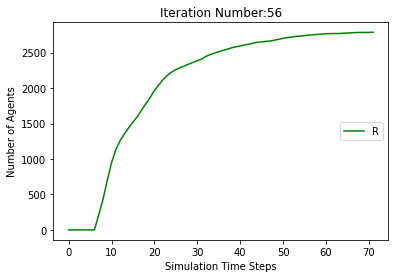

[9790, 9573, 9271, 9001, 8810, 8673, 8574, 8500, 8417, 8331, 8244, 8142, 8032, 7914, 7766, 7645, 7508, 7395, 7312, 7208, 7110, 7033, 6947, 6874, 6805, 6754, 6700, 6648, 6592, 6555, 6521, 6479, 6452, 6438, 6424, 6413, 6409, 6402, 6399, 6394, 6391, 6389, 6386, 6383, 6382, 6380, 6379, 6378, 6373, 6368, 6366, 6365, 6363, 6362, 6361, 6360, 6359, 6357, 6355, 6355, 6355, 6355, 6355, 6355, 6355, 6355]
[210, 427, 729, 999, 1190, 1327, 1426, 1290, 1156, 940, 757, 668, 641, 660, 734, 772, 823, 849, 830, 824, 804, 733, 698, 634, 590, 558, 508, 462, 441, 392, 353, 326, 302, 262, 224, 179, 146, 119, 80, 58, 47, 35, 27, 26, 20, 19, 15, 13, 16, 18, 17, 17, 17, 17, 17, 13, 9, 9, 10, 8, 7, 6, 5, 4, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 427, 729, 999, 1190, 1327, 1426, 1500, 1583, 1669, 1756, 1858, 1968, 2086, 2234, 2355, 2492, 2605, 2688, 2792, 2890, 2967, 3053, 3126, 3195, 3246, 3300, 3352, 3408, 3445, 3479, 3521, 3548, 3562, 3576, 3587, 3591, 3598, 3601, 3606, 3609, 3611, 3614, 3617, 3618, 3620, 3621, 3622

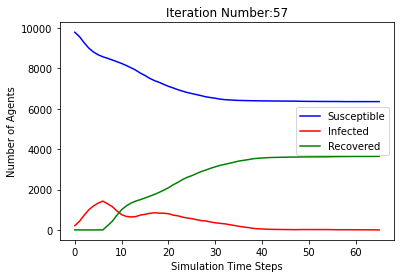

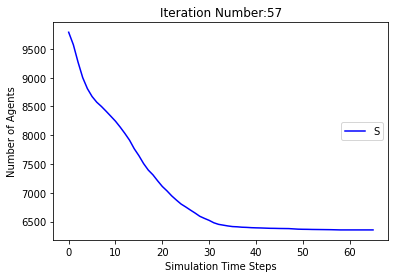

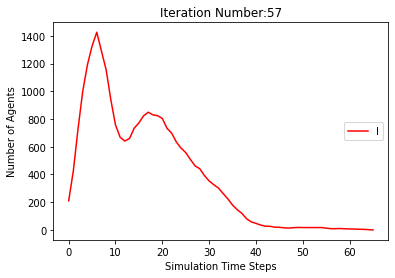

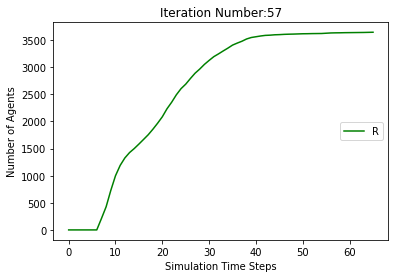

[9790, 9583, 9327, 9038, 8831, 8707, 8620, 8557, 8508, 8468, 8425, 8385, 8353, 8332, 8315, 8302, 8295, 8292, 8287, 8282, 8272, 8269, 8268, 8268, 8268, 8268, 8268, 8268, 8268, 8268]
[210, 417, 673, 962, 1169, 1293, 1380, 1233, 1075, 859, 613, 446, 354, 288, 242, 206, 173, 133, 98, 71, 60, 46, 34, 27, 24, 19, 14, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 417, 673, 962, 1169, 1293, 1380, 1443, 1492, 1532, 1575, 1615, 1647, 1668, 1685, 1698, 1705, 1708, 1713, 1718, 1728, 1731, 1732]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963], [9790, 9585, 9311, 9047, 8845, 8674, 8545, 8396, 8271, 8182, 80

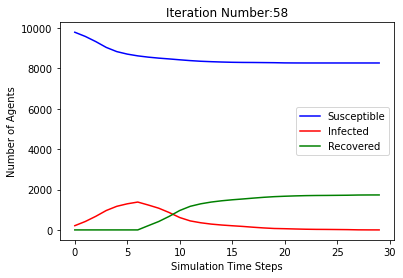

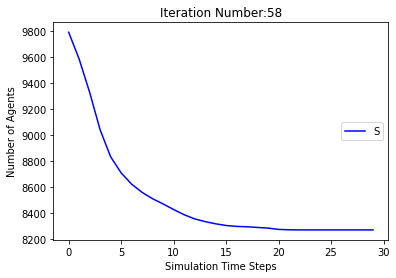

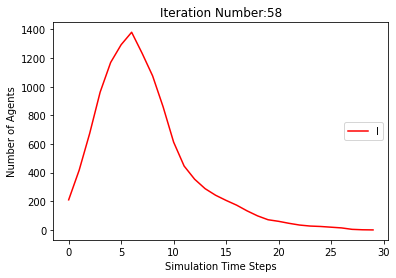

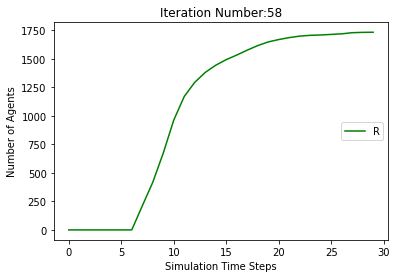

[9790, 9602, 9311, 9007, 8781, 8612, 8489, 8403, 8339, 8276, 8223, 8168, 8114, 8061, 8012, 7955, 7910, 7860, 7803, 7748, 7697, 7655, 7618, 7586, 7559, 7537, 7511, 7486, 7473, 7454, 7443, 7433, 7422, 7411, 7405, 7398, 7395, 7393, 7391, 7391, 7391, 7390, 7390, 7390, 7390, 7390, 7390, 7390, 7390]
[210, 398, 689, 993, 1219, 1388, 1511, 1387, 1263, 1035, 784, 613, 498, 428, 391, 384, 366, 363, 365, 366, 364, 357, 337, 324, 301, 266, 237, 211, 182, 164, 143, 126, 115, 100, 81, 75, 59, 50, 42, 31, 20, 15, 8, 5, 3, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 398, 689, 993, 1219, 1388, 1511, 1597, 1661, 1724, 1777, 1832, 1886, 1939, 1988, 2045, 2090, 2140, 2197, 2252, 2303, 2345, 2382, 2414, 2441, 2463, 2489, 2514, 2527, 2546, 2557, 2567, 2578, 2589, 2595, 2602, 2605, 2607, 2609, 2609, 2609, 2610]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7

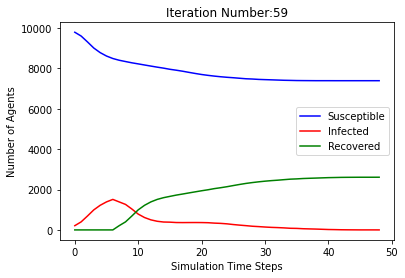

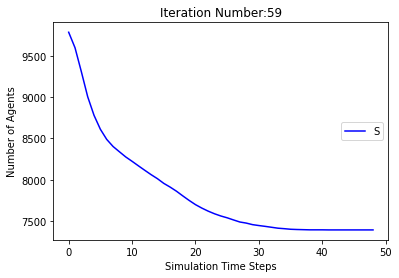

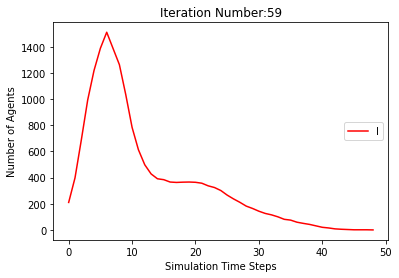

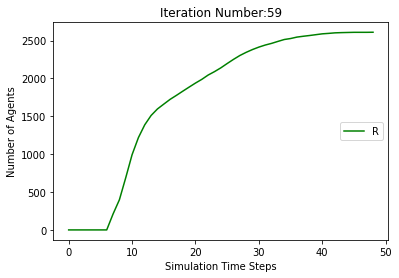

[9790, 9593, 9313, 9039, 8786, 8607, 8472, 8347, 8237, 8137, 8033, 7954, 7867, 7785, 7696, 7598, 7499, 7407, 7292, 7188, 7085, 7003, 6934, 6874, 6821, 6744, 6655, 6558, 6469, 6398, 6353, 6320, 6294, 6273, 6262, 6255, 6249, 6248, 6247, 6247, 6246, 6245, 6245, 6245, 6245, 6245, 6245, 6245, 6245]
[210, 407, 687, 961, 1214, 1393, 1528, 1443, 1356, 1176, 1006, 832, 740, 687, 651, 639, 638, 626, 662, 679, 700, 693, 664, 625, 586, 548, 533, 527, 534, 536, 521, 501, 450, 382, 296, 214, 149, 105, 73, 47, 27, 17, 10, 4, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 407, 687, 961, 1214, 1393, 1528, 1653, 1763, 1863, 1967, 2046, 2133, 2215, 2304, 2402, 2501, 2593, 2708, 2812, 2915, 2997, 3066, 3126, 3179, 3256, 3345, 3442, 3531, 3602, 3647, 3680, 3706, 3727, 3738, 3745, 3751, 3752, 3753, 3753, 3754, 3755]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7

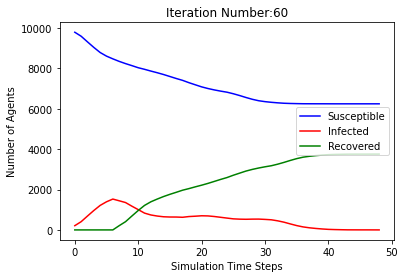

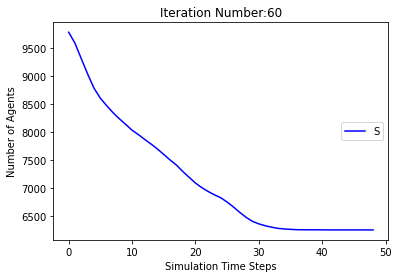

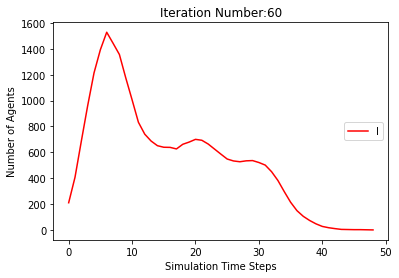

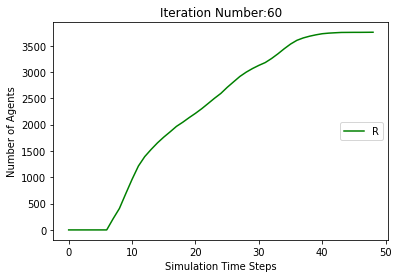

[9790, 9545, 9249, 8981, 8790, 8624, 8463, 8315, 8167, 8021, 7866, 7714, 7554, 7418, 7232, 7087, 6971, 6848, 6723, 6597, 6457, 6324, 6204, 6102, 6034, 5968, 5912, 5868, 5823, 5788, 5764, 5751, 5743, 5735, 5729, 5725, 5723, 5721, 5719, 5716, 5716, 5716, 5716, 5716, 5716, 5716, 5716]
[210, 455, 751, 1019, 1210, 1376, 1537, 1475, 1378, 1228, 1115, 1076, 1070, 1045, 1083, 1080, 1050, 1018, 991, 957, 961, 908, 883, 869, 814, 755, 685, 589, 501, 416, 338, 283, 225, 177, 139, 98, 65, 43, 32, 27, 19, 13, 9, 7, 5, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 455, 751, 1019, 1210, 1376, 1537, 1685, 1833, 1979, 2134, 2286, 2446, 2582, 2768, 2913, 3029, 3152, 3277, 3403, 3543, 3676, 3796, 3898, 3966, 4032, 4088, 4132, 4177, 4212, 4236, 4249, 4257, 4265, 4271, 4275, 4277, 4279, 4281, 4284]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 78

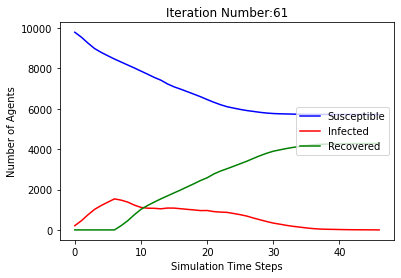

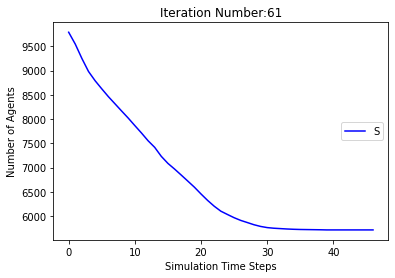

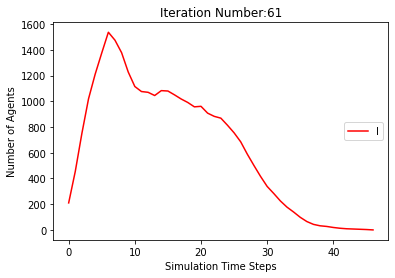

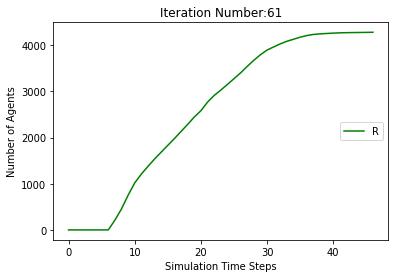

[9790, 9584, 9323, 9056, 8810, 8642, 8484, 8316, 8177, 8040, 7926, 7814, 7726, 7627, 7539, 7432, 7337, 7228, 7129, 7050, 6999, 6961, 6934, 6902, 6877, 6853, 6823, 6795, 6760, 6723, 6688, 6668, 6642, 6619, 6595, 6579, 6562, 6546, 6532, 6518, 6501, 6485, 6460, 6443, 6428, 6409, 6397, 6391, 6385, 6380, 6379, 6379, 6379, 6379, 6379, 6379, 6379, 6379]
[210, 416, 677, 944, 1190, 1358, 1516, 1474, 1407, 1283, 1130, 996, 916, 857, 777, 745, 703, 698, 685, 676, 628, 578, 498, 435, 351, 276, 227, 204, 201, 211, 214, 209, 211, 204, 200, 181, 161, 142, 136, 124, 118, 110, 119, 119, 118, 123, 121, 110, 100, 80, 64, 49, 30, 18, 12, 6, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 416, 677, 944, 1190, 1358, 1516, 1684, 1823, 1960, 2074, 2186, 2274, 2373, 2461, 2568, 2663, 2772, 2871, 2950, 3001, 3039, 3066, 3098, 3123, 3147, 3177, 3205, 3240, 3277, 3312, 3332, 3358, 3381, 3405, 3421, 3438, 3454, 3468, 3482, 3499, 3515, 3540, 3557, 3572, 3591, 3603, 3609, 3615, 3620, 3621]
[[], [9790, 9583, 9281, 8978, 8761, 8649,

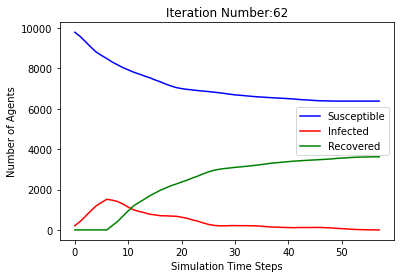

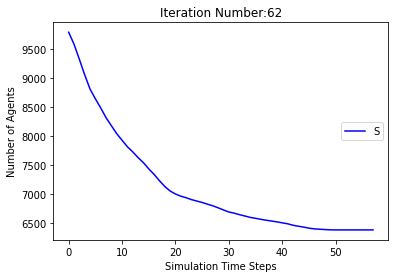

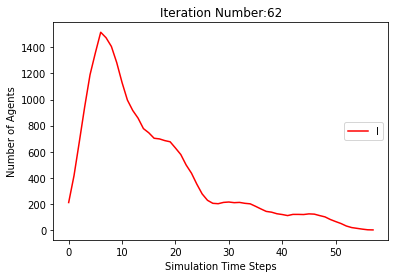

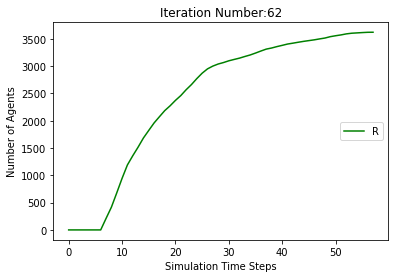

[9790, 9558, 9238, 8952, 8758, 8611, 8500, 8428, 8354, 8262, 8157, 8028, 7931, 7788, 7680, 7589, 7487, 7393, 7310, 7223, 7142, 7065, 6991, 6909, 6844, 6789, 6735, 6679, 6633, 6589, 6540, 6502, 6462, 6423, 6384, 6343, 6305, 6269, 6231, 6198, 6163, 6135, 6115, 6094, 6079, 6071, 6055, 6044, 6033, 6017, 6002, 5995, 5985, 5981, 5978, 5977, 5976, 5975, 5974, 5973, 5973, 5973, 5973, 5973, 5973, 5973, 5973]
[210, 442, 762, 1048, 1242, 1389, 1500, 1362, 1204, 976, 795, 730, 680, 712, 748, 765, 775, 764, 718, 708, 646, 615, 598, 578, 549, 521, 488, 463, 432, 402, 369, 342, 327, 312, 295, 290, 284, 271, 271, 264, 260, 249, 228, 211, 190, 160, 143, 119, 102, 98, 92, 84, 86, 74, 66, 56, 41, 27, 21, 12, 8, 5, 4, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 442, 762, 1048, 1242, 1389, 1500, 1572, 1646, 1738, 1843, 1972, 2069, 2212, 2320, 2411, 2513, 2607, 2690, 2777, 2858, 2935, 3009, 3091, 3156, 3211, 3265, 3321, 3367, 3411, 3460, 3498, 3538, 3577, 3616, 3657, 3695, 3731, 3769, 3802, 3837, 3865, 3885, 390

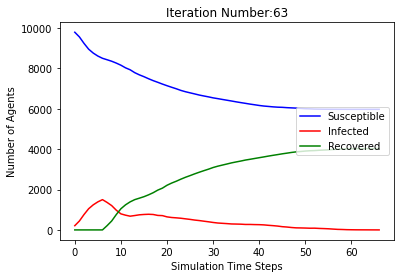

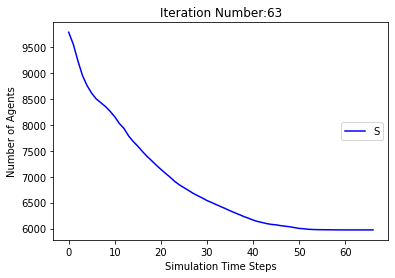

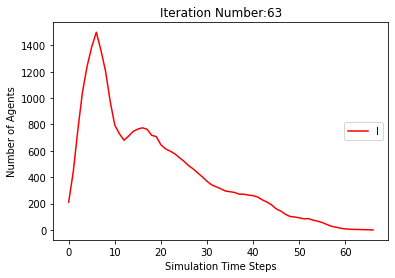

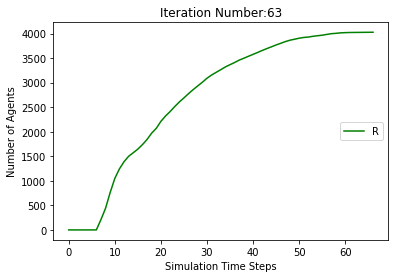

[9790, 9563, 9302, 9028, 8819, 8687, 8597, 8533, 8469, 8387, 8277, 8154, 8040, 7928, 7823, 7718, 7639, 7566, 7517, 7480, 7453, 7434, 7412, 7387, 7369, 7348, 7330, 7317, 7311, 7311, 7311, 7311, 7311, 7311, 7311, 7311]
[210, 437, 698, 972, 1181, 1313, 1403, 1257, 1094, 915, 751, 665, 647, 669, 710, 751, 748, 711, 637, 560, 475, 389, 306, 252, 197, 169, 150, 136, 123, 101, 76, 58, 37, 19, 6, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 437, 698, 972, 1181, 1313, 1403, 1467, 1531, 1613, 1723, 1846, 1960, 2072, 2177, 2282, 2361, 2434, 2483, 2520, 2547, 2566, 2588, 2613, 2631, 2652, 2670, 2683, 2689]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 796

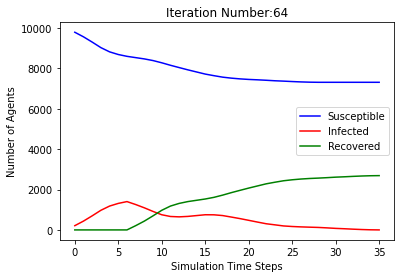

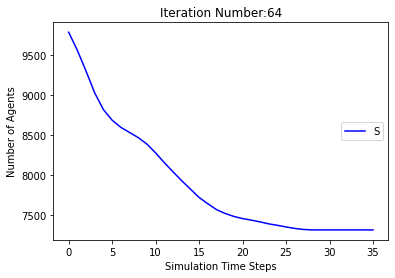

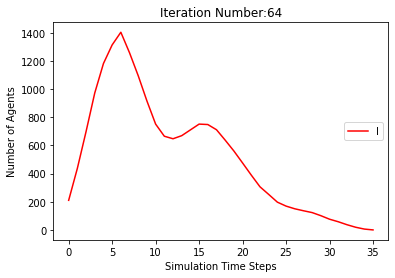

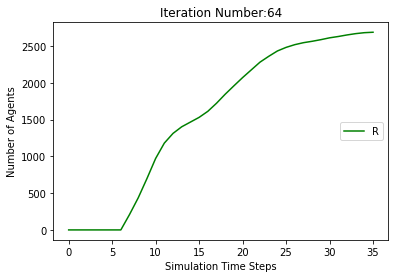

[9790, 9588, 9295, 9054, 8856, 8725, 8636, 8560, 8491, 8416, 8306, 8214, 8131, 8053, 7986, 7928, 7865, 7803, 7758, 7723, 7677, 7646, 7614, 7589, 7579, 7570, 7565, 7563, 7563, 7562, 7562, 7561, 7561, 7561, 7561, 7561, 7560, 7560, 7560, 7560, 7560, 7560, 7560, 7560]
[210, 412, 705, 946, 1144, 1275, 1364, 1230, 1097, 879, 748, 642, 594, 583, 574, 563, 551, 503, 456, 408, 376, 340, 314, 276, 224, 188, 158, 114, 83, 52, 27, 18, 9, 4, 2, 2, 2, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 412, 705, 946, 1144, 1275, 1364, 1440, 1509, 1584, 1694, 1786, 1869, 1947, 2014, 2072, 2135, 2197, 2242, 2277, 2323, 2354, 2386, 2411, 2421, 2430, 2435, 2437, 2437, 2438, 2438, 2439, 2439, 2439, 2439, 2439, 2440]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8

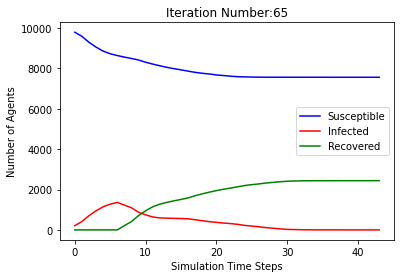

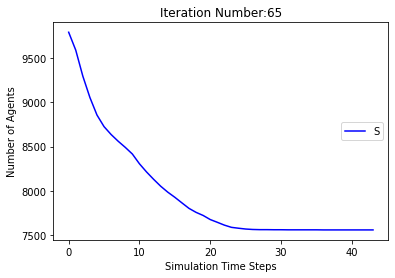

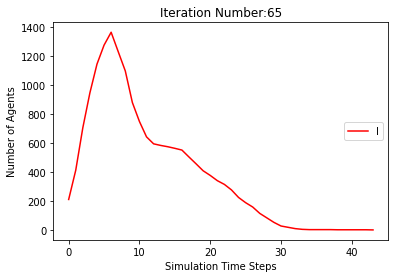

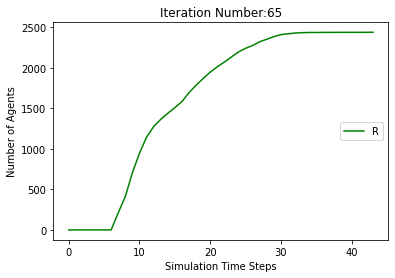

[9790, 9577, 9300, 9016, 8808, 8666, 8554, 8449, 8361, 8267, 8182, 8100, 8023, 7953, 7874, 7822, 7786, 7750, 7723, 7704, 7687, 7666, 7645, 7618, 7587, 7570, 7558, 7550, 7539, 7520, 7507, 7497, 7484, 7476, 7475, 7474, 7474, 7474, 7474, 7473, 7472, 7472, 7472, 7472, 7472, 7472, 7472, 7472]
[210, 423, 700, 984, 1192, 1334, 1446, 1341, 1216, 1033, 834, 708, 643, 601, 575, 539, 481, 432, 377, 319, 266, 208, 177, 168, 163, 153, 146, 137, 127, 125, 111, 90, 86, 82, 75, 65, 46, 33, 23, 11, 4, 3, 2, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 423, 700, 984, 1192, 1334, 1446, 1551, 1639, 1733, 1818, 1900, 1977, 2047, 2126, 2178, 2214, 2250, 2277, 2296, 2313, 2334, 2355, 2382, 2413, 2430, 2442, 2450, 2461, 2480, 2493, 2503, 2516, 2524, 2525, 2526, 2526, 2526, 2526, 2527, 2528]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 787

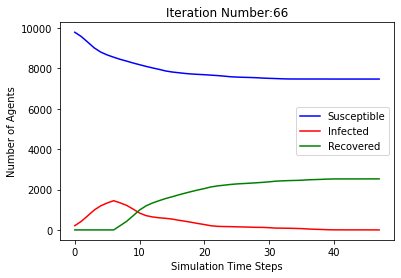

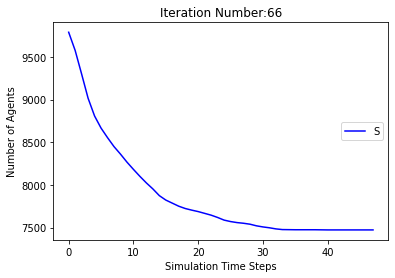

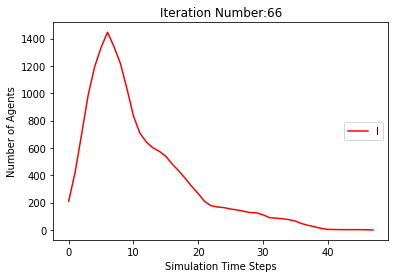

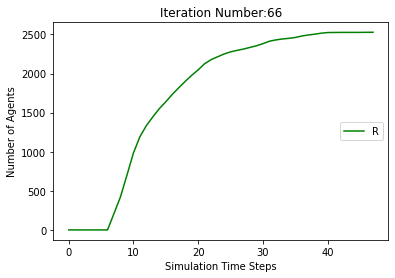

[9790, 9568, 9284, 9007, 8805, 8662, 8557, 8463, 8384, 8281, 8200, 8095, 7987, 7890, 7792, 7682, 7590, 7510, 7420, 7341, 7257, 7170, 7093, 7012, 6933, 6869, 6807, 6753, 6705, 6672, 6649, 6632, 6614, 6605, 6599, 6591, 6583, 6580, 6578, 6578, 6577, 6577, 6577, 6577, 6577, 6577, 6577, 6577]
[210, 432, 716, 993, 1195, 1338, 1443, 1327, 1184, 1003, 807, 710, 675, 667, 671, 702, 691, 690, 675, 646, 633, 622, 589, 578, 577, 551, 534, 504, 465, 421, 363, 301, 255, 202, 154, 114, 89, 69, 54, 36, 28, 22, 14, 6, 3, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 432, 716, 993, 1195, 1338, 1443, 1537, 1616, 1719, 1800, 1905, 2013, 2110, 2208, 2318, 2410, 2490, 2580, 2659, 2743, 2830, 2907, 2988, 3067, 3131, 3193, 3247, 3295, 3328, 3351, 3368, 3386, 3395, 3401, 3409, 3417, 3420, 3422, 3422, 3423]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7

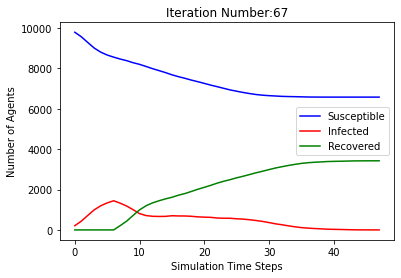

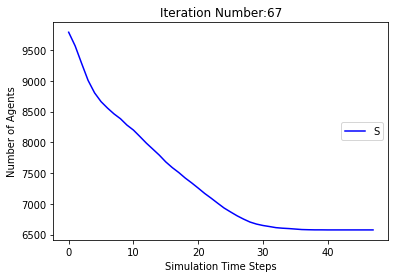

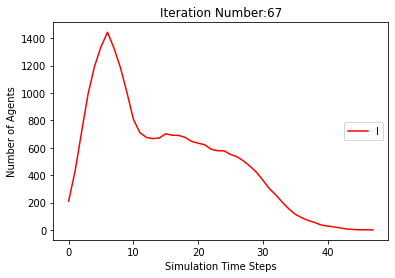

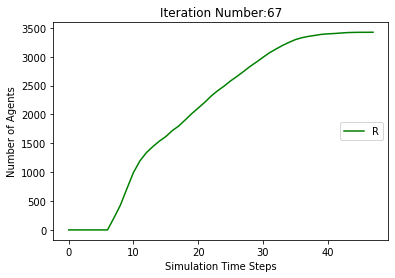

[9790, 9586, 9303, 9028, 8833, 8678, 8545, 8407, 8277, 8132, 8020, 7908, 7795, 7666, 7517, 7394, 7279, 7176, 7080, 7000, 6924, 6843, 6774, 6709, 6652, 6599, 6555, 6519, 6490, 6464, 6441, 6422, 6411, 6403, 6393, 6381, 6370, 6362, 6360, 6354, 6346, 6341, 6339, 6339, 6336, 6336, 6336, 6336, 6336, 6336, 6336, 6336]
[210, 414, 697, 972, 1167, 1322, 1455, 1383, 1309, 1171, 1008, 925, 883, 879, 890, 883, 853, 844, 828, 795, 742, 674, 620, 570, 524, 481, 445, 405, 353, 310, 268, 230, 188, 152, 126, 109, 94, 79, 62, 57, 57, 52, 42, 31, 26, 24, 18, 10, 5, 3, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 414, 697, 972, 1167, 1322, 1455, 1593, 1723, 1868, 1980, 2092, 2205, 2334, 2483, 2606, 2721, 2824, 2920, 3000, 3076, 3157, 3226, 3291, 3348, 3401, 3445, 3481, 3510, 3536, 3559, 3578, 3589, 3597, 3607, 3619, 3630, 3638, 3640, 3646, 3654, 3659, 3661, 3661, 3664]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7

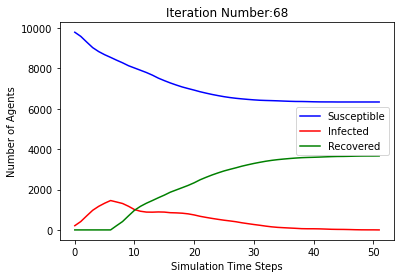

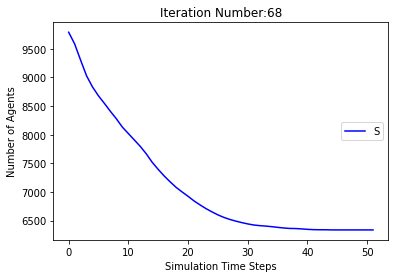

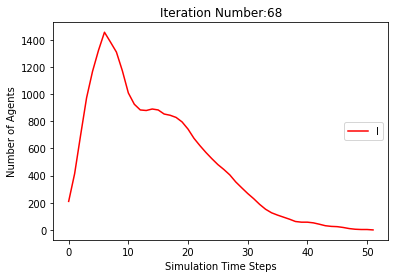

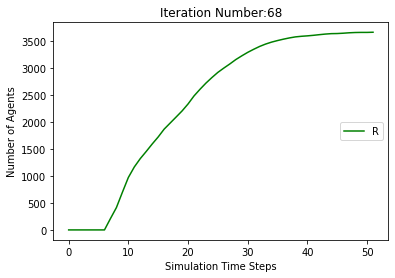

[9790, 9584, 9340, 9068, 8823, 8669, 8530, 8403, 8270, 8134, 8013, 7921, 7831, 7742, 7671, 7607, 7551, 7526, 7506, 7483, 7476, 7476, 7476, 7476, 7476, 7476, 7476, 7476]
[210, 416, 660, 932, 1177, 1331, 1470, 1387, 1314, 1206, 1055, 902, 838, 788, 732, 663, 583, 487, 415, 348, 266, 195, 131, 75, 50, 30, 7, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 416, 660, 932, 1177, 1331, 1470, 1597, 1730, 1866, 1987, 2079, 2169, 2258, 2329, 2393, 2449, 2474, 2494, 2517, 2524]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963], [9790, 9585, 9311, 9047, 8845, 8674, 8545, 8396, 8271, 8182, 8095, 8003, 7895, 7779, 76

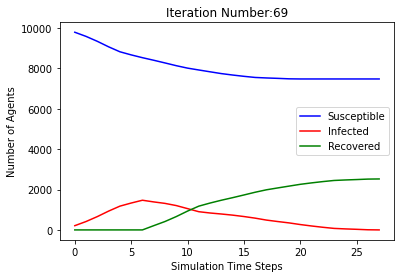

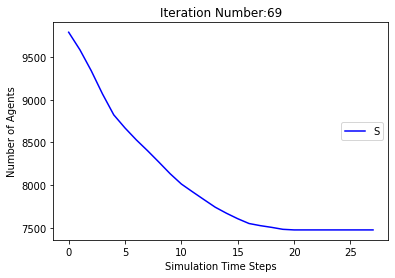

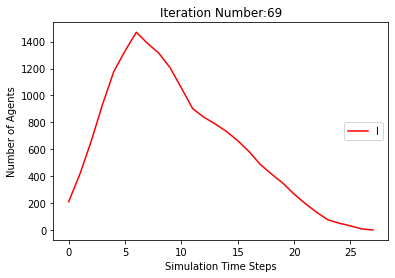

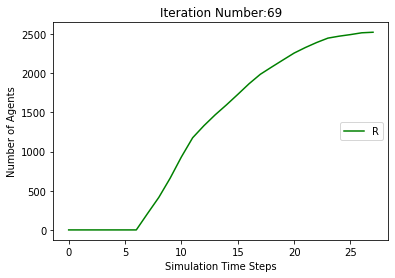

[9790, 9582, 9302, 9022, 8780, 8613, 8497, 8405, 8330, 8261, 8186, 8117, 8043, 7966, 7893, 7818, 7751, 7692, 7638, 7585, 7550, 7523, 7508, 7494, 7482, 7473, 7467, 7462, 7459, 7455, 7453, 7453, 7452, 7451, 7451, 7451, 7450, 7450, 7450, 7450, 7450, 7450, 7450, 7450]
[210, 418, 698, 978, 1220, 1387, 1503, 1385, 1252, 1041, 836, 663, 570, 531, 512, 512, 510, 494, 479, 458, 416, 370, 310, 257, 210, 165, 118, 88, 64, 53, 41, 29, 21, 16, 11, 8, 5, 3, 3, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 418, 698, 978, 1220, 1387, 1503, 1595, 1670, 1739, 1814, 1883, 1957, 2034, 2107, 2182, 2249, 2308, 2362, 2415, 2450, 2477, 2492, 2506, 2518, 2527, 2533, 2538, 2541, 2545, 2547, 2547, 2548, 2549, 2549, 2549, 2550]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467

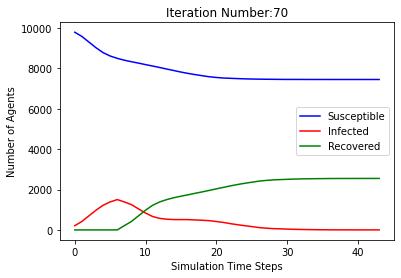

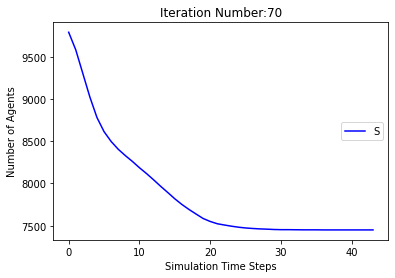

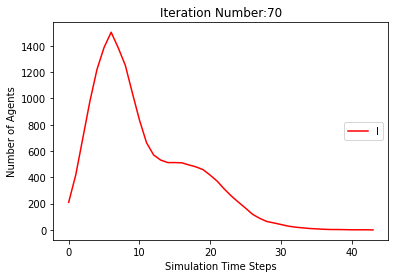

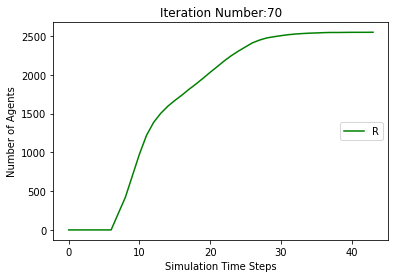

[9790, 9579, 9314, 9032, 8815, 8658, 8535, 8408, 8265, 8137, 8030, 7909, 7794, 7640, 7483, 7319, 7153, 7011, 6871, 6735, 6596, 6495, 6399, 6317, 6236, 6138, 6041, 5951, 5880, 5832, 5772, 5728, 5689, 5659, 5634, 5599, 5569, 5539, 5519, 5492, 5469, 5447, 5433, 5417, 5401, 5393, 5389, 5386, 5386, 5386, 5382, 5377, 5373, 5367, 5365, 5362, 5362, 5360, 5360, 5360, 5360, 5360, 5359, 5359, 5359, 5359, 5359, 5359, 5359, 5359]
[210, 421, 686, 968, 1185, 1342, 1465, 1382, 1314, 1177, 1002, 906, 864, 895, 925, 946, 984, 1019, 1038, 1059, 1044, 988, 920, 836, 775, 733, 694, 645, 615, 567, 545, 508, 449, 382, 317, 281, 263, 233, 209, 197, 190, 187, 166, 152, 138, 126, 103, 83, 61, 47, 35, 24, 20, 22, 21, 24, 24, 22, 17, 13, 7, 5, 3, 3, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 421, 686, 968, 1185, 1342, 1465, 1592, 1735, 1863, 1970, 2091, 2206, 2360, 2517, 2681, 2847, 2989, 3129, 3265, 3404, 3505, 3601, 3683, 3764, 3862, 3959, 4049, 4120, 4168, 4228, 4272, 4311, 4341, 4366, 4401, 4431, 4461, 4481

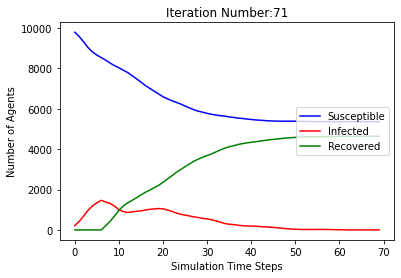

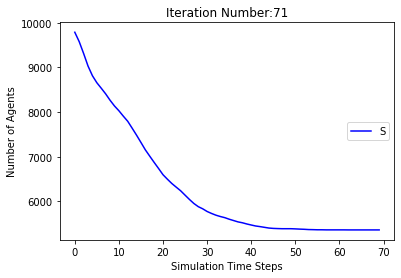

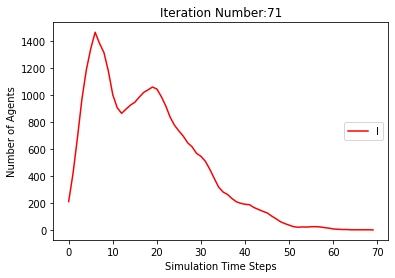

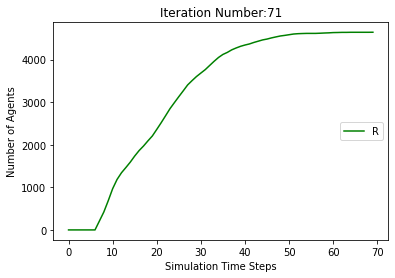

[9790, 9566, 9286, 8986, 8763, 8624, 8532, 8454, 8389, 8317, 8257, 8192, 8139, 8095, 8053, 8013, 7981, 7944, 7914, 7889, 7874, 7854, 7838, 7831, 7824, 7815, 7807, 7804, 7802, 7797, 7794, 7793, 7793, 7792, 7792, 7792, 7792, 7792, 7792, 7792, 7792]
[210, 434, 714, 1014, 1237, 1376, 1468, 1336, 1177, 969, 729, 571, 485, 437, 401, 376, 336, 313, 278, 250, 221, 199, 175, 150, 120, 99, 82, 70, 52, 41, 37, 31, 22, 15, 12, 10, 5, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 434, 714, 1014, 1237, 1376, 1468, 1546, 1611, 1683, 1743, 1808, 1861, 1905, 1947, 1987, 2019, 2056, 2086, 2111, 2126, 2146, 2162, 2169, 2176, 2185, 2193, 2196, 2198, 2203, 2206, 2207, 2207, 2208]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8

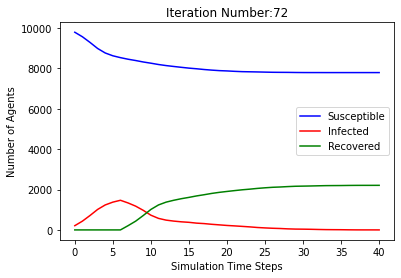

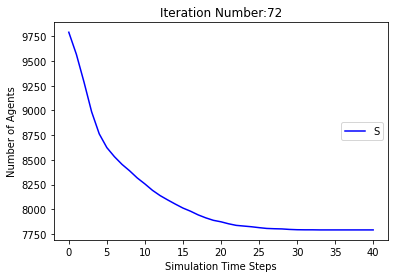

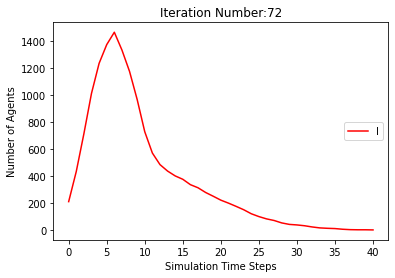

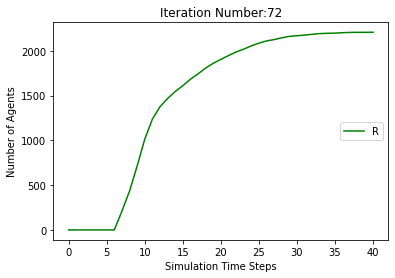

[9790, 9582, 9297, 9016, 8778, 8581, 8429, 8223, 8013, 7763, 7528, 7316, 7072, 6808, 6550, 6254, 5920, 5576, 5259, 4951, 4693, 4432, 4176, 3905, 3650, 3442, 3278, 3135, 3002, 2898, 2791, 2716, 2640, 2592, 2545, 2507, 2473, 2449, 2432, 2418, 2401, 2392, 2387, 2383, 2382, 2381, 2380, 2380, 2379, 2379, 2379, 2379, 2379, 2379, 2379, 2379]
[210, 418, 703, 984, 1222, 1419, 1571, 1567, 1569, 1534, 1488, 1462, 1509, 1621, 1673, 1759, 1843, 1952, 2057, 2121, 2115, 2118, 2078, 2015, 1926, 1817, 1673, 1558, 1430, 1278, 1114, 934, 802, 686, 590, 495, 425, 342, 284, 222, 191, 153, 120, 90, 67, 51, 38, 21, 13, 8, 4, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 418, 703, 984, 1222, 1419, 1571, 1777, 1987, 2237, 2472, 2684, 2928, 3192, 3450, 3746, 4080, 4424, 4741, 5049, 5307, 5568, 5824, 6095, 6350, 6558, 6722, 6865, 6998, 7102, 7209, 7284, 7360, 7408, 7455, 7493, 7527, 7551, 7568, 7582, 7599, 7608, 7613, 7617, 7618, 7619, 7620, 7620, 7621]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 835

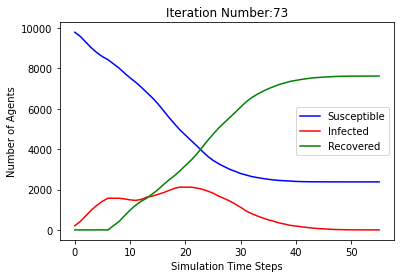

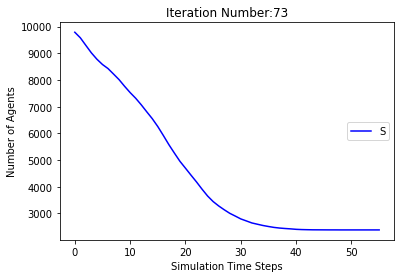

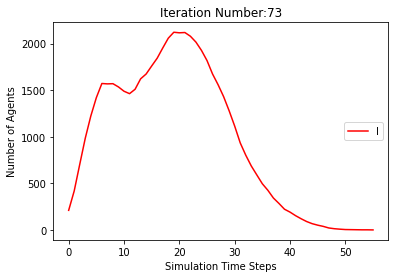

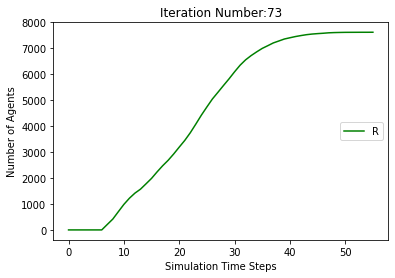

[9790, 9560, 9277, 8991, 8766, 8610, 8516, 8447, 8388, 8311, 8215, 8135, 8056, 7997, 7942, 7895, 7849, 7807, 7773, 7741, 7715, 7696, 7681, 7671, 7667, 7664, 7657, 7653, 7646, 7642, 7637, 7632, 7631, 7629, 7626, 7622, 7618, 7614, 7613, 7611, 7611, 7611, 7610, 7610, 7610, 7610, 7610, 7610, 7610, 7610]
[210, 440, 723, 1009, 1234, 1390, 1484, 1343, 1172, 966, 776, 631, 554, 519, 505, 493, 462, 408, 362, 315, 282, 246, 214, 178, 140, 109, 84, 62, 50, 39, 34, 35, 33, 28, 27, 24, 24, 23, 19, 20, 18, 15, 12, 8, 4, 3, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 440, 723, 1009, 1234, 1390, 1484, 1553, 1612, 1689, 1785, 1865, 1944, 2003, 2058, 2105, 2151, 2193, 2227, 2259, 2285, 2304, 2319, 2329, 2333, 2336, 2343, 2347, 2354, 2358, 2363, 2368, 2369, 2371, 2374, 2378, 2382, 2386, 2387, 2389, 2389, 2389, 2390]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873

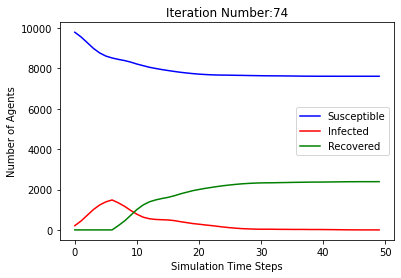

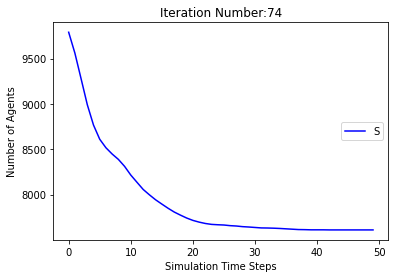

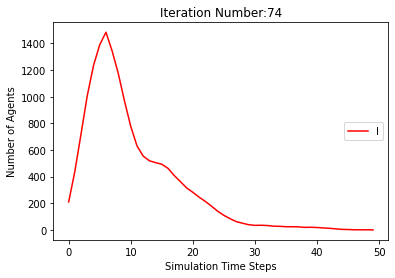

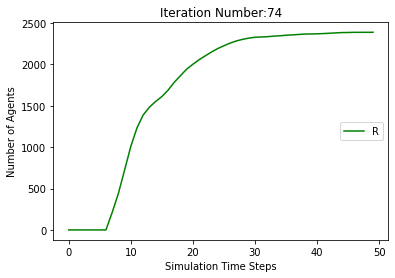

[9790, 9589, 9338, 9058, 8862, 8739, 8636, 8533, 8437, 8345, 8248, 8160, 8086, 8000, 7943, 7899, 7867, 7846, 7833, 7828, 7828, 7828, 7827, 7826, 7826, 7826, 7826, 7826, 7826, 7826, 7826]
[210, 411, 662, 942, 1138, 1261, 1364, 1257, 1152, 993, 810, 702, 653, 636, 590, 538, 478, 402, 327, 258, 172, 115, 72, 41, 20, 7, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 411, 662, 942, 1138, 1261, 1364, 1467, 1563, 1655, 1752, 1840, 1914, 2000, 2057, 2101, 2133, 2154, 2167, 2172, 2172, 2172, 2173, 2174]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963], [9790, 9585, 9311, 9047, 8845, 8674, 8545, 839

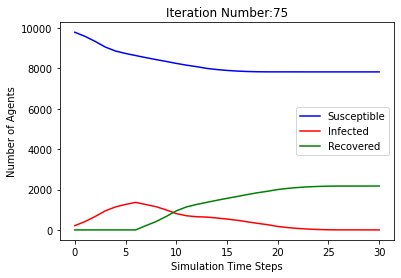

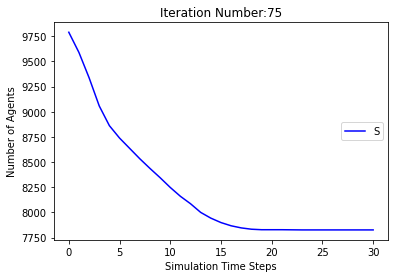

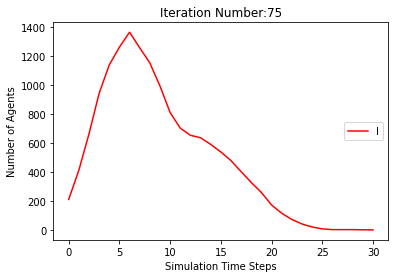

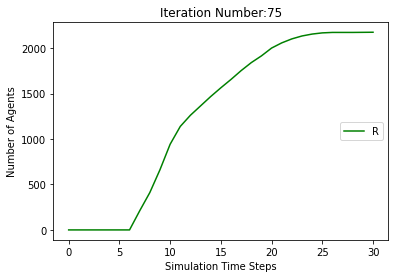

[9790, 9567, 9269, 8994, 8805, 8679, 8597, 8509, 8400, 8300, 8180, 8063, 7969, 7903, 7826, 7752, 7664, 7583, 7500, 7432, 7357, 7287, 7235, 7181, 7140, 7100, 7062, 7024, 6980, 6944, 6927, 6906, 6892, 6875, 6870, 6862, 6854, 6845, 6840, 6836, 6833, 6829, 6829, 6829, 6829, 6829, 6829, 6829, 6829]
[210, 433, 731, 1006, 1195, 1321, 1403, 1281, 1167, 969, 814, 742, 710, 694, 683, 648, 636, 597, 563, 537, 546, 539, 517, 483, 443, 400, 370, 333, 307, 291, 254, 234, 208, 187, 154, 118, 90, 82, 66, 56, 42, 41, 33, 25, 16, 11, 7, 4, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 433, 731, 1006, 1195, 1321, 1403, 1491, 1600, 1700, 1820, 1937, 2031, 2097, 2174, 2248, 2336, 2417, 2500, 2568, 2643, 2713, 2765, 2819, 2860, 2900, 2938, 2976, 3020, 3056, 3073, 3094, 3108, 3125, 3130, 3138, 3146, 3155, 3160, 3164, 3167, 3171]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 

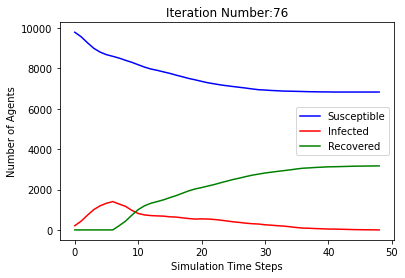

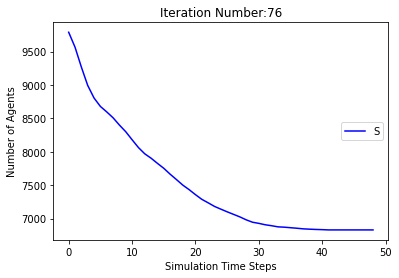

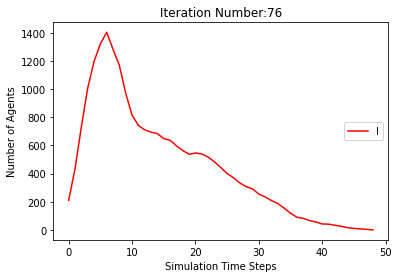

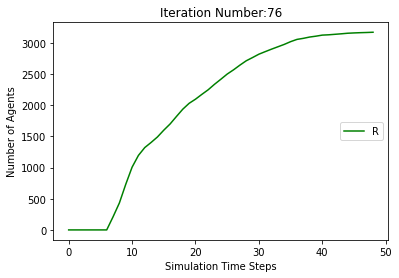

[9790, 9589, 9313, 9033, 8822, 8668, 8571, 8497, 8431, 8364, 8311, 8247, 8181, 8117, 8035, 7979, 7936, 7912, 7888, 7871, 7863, 7856, 7848, 7836, 7826, 7813, 7801, 7799, 7794, 7794, 7793, 7793, 7793, 7793, 7792, 7792, 7792, 7792, 7792, 7792, 7792, 7792]
[210, 411, 687, 967, 1178, 1332, 1429, 1293, 1158, 949, 722, 575, 487, 454, 462, 452, 428, 399, 359, 310, 254, 179, 131, 100, 86, 75, 70, 64, 62, 54, 43, 33, 20, 8, 7, 2, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 411, 687, 967, 1178, 1332, 1429, 1503, 1569, 1636, 1689, 1753, 1819, 1883, 1965, 2021, 2064, 2088, 2112, 2129, 2137, 2144, 2152, 2164, 2174, 2187, 2199, 2201, 2206, 2206, 2207, 2207, 2207, 2207, 2208]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110

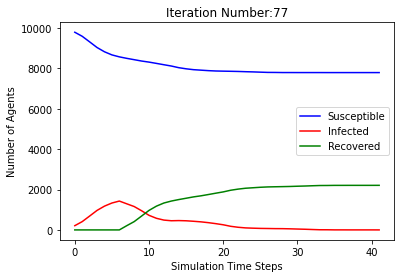

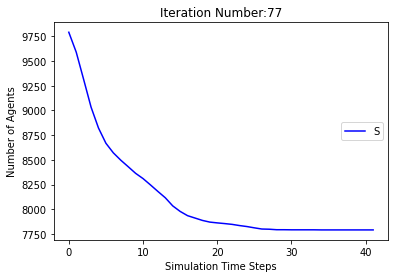

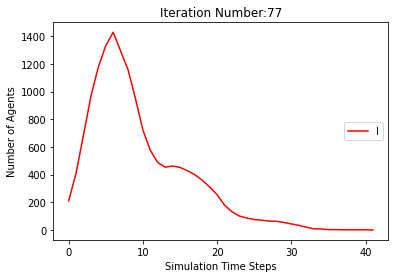

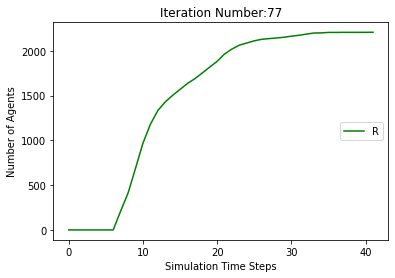

[9790, 9580, 9300, 9069, 8865, 8728, 8635, 8561, 8509, 8455, 8398, 8346, 8300, 8266, 8235, 8203, 8186, 8179, 8173, 8172, 8172, 8172, 8172, 8172, 8172, 8172, 8172]
[210, 420, 700, 931, 1135, 1272, 1365, 1229, 1071, 845, 671, 519, 428, 369, 326, 306, 269, 219, 173, 128, 94, 63, 31, 14, 7, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 420, 700, 931, 1135, 1272, 1365, 1439, 1491, 1545, 1602, 1654, 1700, 1734, 1765, 1797, 1814, 1821, 1827, 1828]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963], [9790, 9585, 9311, 9047, 8845, 8674, 8545, 8396, 8271, 8182, 8095, 8003, 7895, 7779, 7659, 7544, 7443, 7357, 

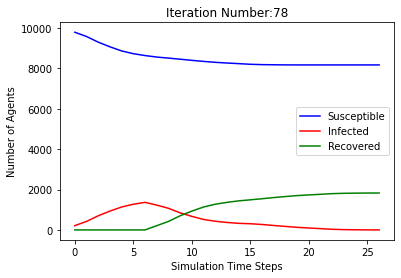

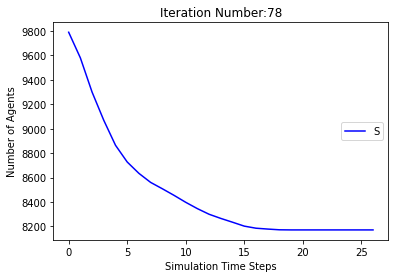

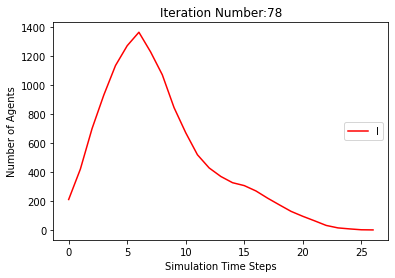

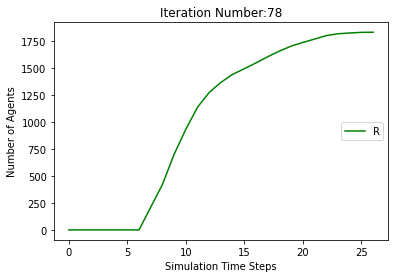

[9790, 9571, 9296, 9020, 8818, 8680, 8599, 8521, 8463, 8397, 8330, 8261, 8191, 8130, 8083, 8042, 8009, 7976, 7939, 7905, 7874, 7854, 7840, 7827, 7821, 7815, 7808, 7802, 7792, 7786, 7782, 7780, 7778, 7775, 7773, 7769, 7768, 7768, 7767, 7766, 7766, 7766, 7766, 7766, 7765, 7765, 7765, 7765, 7765, 7765, 7765, 7765]
[210, 429, 704, 980, 1182, 1320, 1401, 1269, 1108, 899, 690, 557, 489, 469, 438, 421, 388, 354, 322, 286, 256, 229, 202, 182, 155, 124, 97, 72, 62, 54, 45, 41, 37, 33, 29, 23, 18, 14, 13, 12, 9, 7, 3, 2, 3, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 429, 704, 980, 1182, 1320, 1401, 1479, 1537, 1603, 1670, 1739, 1809, 1870, 1917, 1958, 1991, 2024, 2061, 2095, 2126, 2146, 2160, 2173, 2179, 2185, 2192, 2198, 2208, 2214, 2218, 2220, 2222, 2225, 2227, 2231, 2232, 2232, 2233, 2234, 2234, 2234, 2234, 2234, 2235]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 787

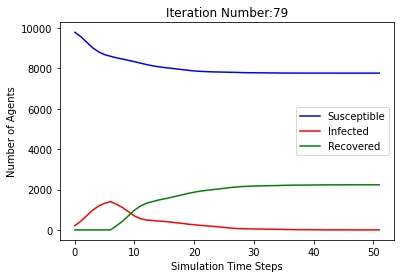

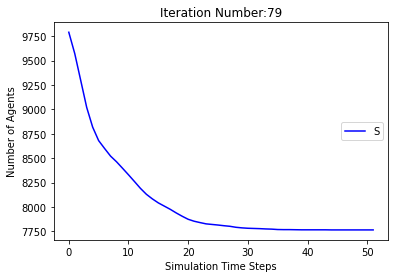

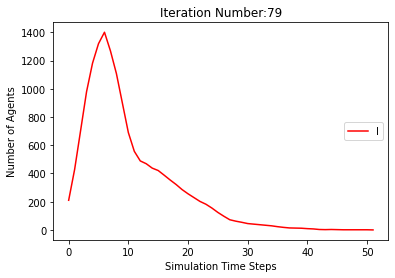

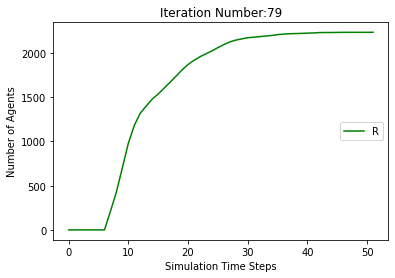

[9790, 9576, 9300, 9001, 8787, 8647, 8562, 8469, 8363, 8262, 8164, 8086, 7996, 7932, 7862, 7818, 7786, 7765, 7733, 7711, 7682, 7659, 7636, 7626, 7617, 7611, 7599, 7583, 7578, 7566, 7557, 7551, 7546, 7543, 7541, 7538, 7537, 7537, 7537, 7536, 7536, 7536, 7536, 7536, 7536, 7536, 7536]
[210, 424, 700, 999, 1213, 1353, 1438, 1321, 1213, 1038, 837, 701, 651, 630, 607, 545, 476, 399, 353, 285, 250, 203, 182, 160, 148, 122, 112, 99, 81, 70, 69, 66, 65, 56, 42, 40, 29, 20, 14, 10, 7, 5, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 424, 700, 999, 1213, 1353, 1438, 1531, 1637, 1738, 1836, 1914, 2004, 2068, 2138, 2182, 2214, 2235, 2267, 2289, 2318, 2341, 2364, 2374, 2383, 2389, 2401, 2417, 2422, 2434, 2443, 2449, 2454, 2457, 2459, 2462, 2463, 2463, 2463, 2464]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872

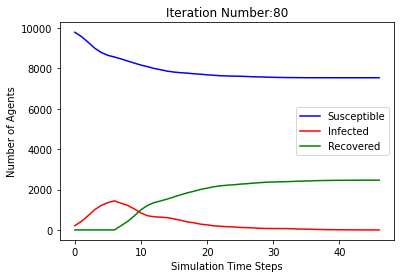

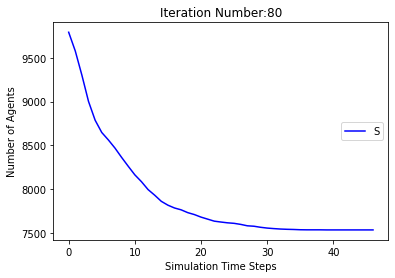

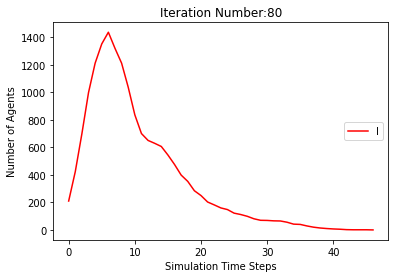

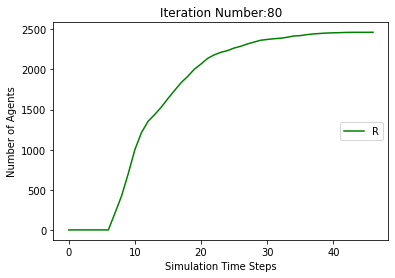

[9790, 9571, 9288, 9016, 8819, 8674, 8581, 8517, 8453, 8383, 8333, 8288, 8232, 8181, 8133, 8084, 8040, 8011, 7982, 7958, 7939, 7924, 7914, 7902, 7896, 7890, 7886, 7883, 7879, 7874, 7869, 7866, 7863, 7861, 7859, 7859, 7859, 7858, 7857, 7857, 7856, 7856, 7856, 7856, 7856, 7856, 7856, 7856]
[210, 429, 712, 984, 1181, 1326, 1419, 1273, 1118, 905, 683, 531, 442, 400, 384, 369, 343, 322, 306, 274, 242, 209, 170, 138, 115, 92, 72, 56, 45, 40, 33, 30, 27, 25, 24, 20, 15, 11, 9, 6, 5, 3, 3, 3, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 429, 712, 984, 1181, 1326, 1419, 1483, 1547, 1617, 1667, 1712, 1768, 1819, 1867, 1916, 1960, 1989, 2018, 2042, 2061, 2076, 2086, 2098, 2104, 2110, 2114, 2117, 2121, 2126, 2131, 2134, 2137, 2139, 2141, 2141, 2141, 2142, 2143, 2143, 2144]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 

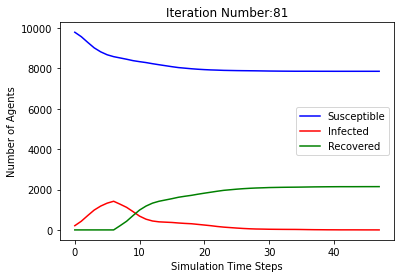

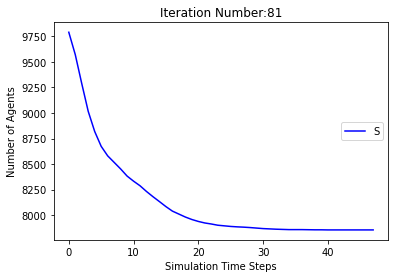

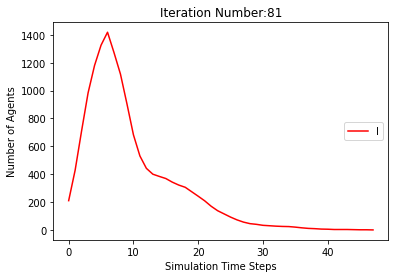

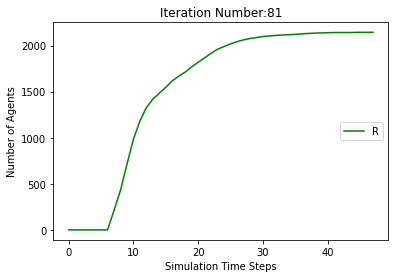

[9790, 9575, 9307, 9025, 8808, 8653, 8548, 8453, 8353, 8263, 8169, 8073, 7986, 7903, 7820, 7740, 7665, 7606, 7559, 7506, 7472, 7449, 7436, 7428, 7418, 7407, 7395, 7380, 7365, 7350, 7330, 7319, 7310, 7302, 7296, 7288, 7282, 7277, 7273, 7270, 7268, 7268, 7268, 7268, 7268, 7268, 7268, 7268]
[210, 425, 693, 975, 1192, 1347, 1452, 1337, 1222, 1044, 856, 735, 667, 645, 633, 613, 598, 563, 514, 480, 431, 371, 304, 237, 188, 152, 111, 92, 84, 86, 98, 99, 97, 93, 84, 77, 68, 53, 46, 40, 34, 28, 20, 14, 9, 5, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 425, 693, 975, 1192, 1347, 1452, 1547, 1647, 1737, 1831, 1927, 2014, 2097, 2180, 2260, 2335, 2394, 2441, 2494, 2528, 2551, 2564, 2572, 2582, 2593, 2605, 2620, 2635, 2650, 2670, 2681, 2690, 2698, 2704, 2712, 2718, 2723, 2727, 2730, 2732]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 787

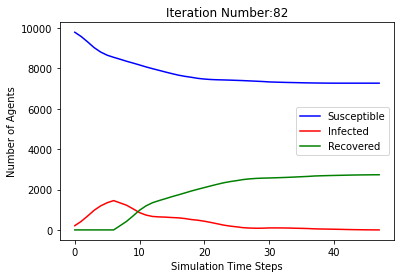

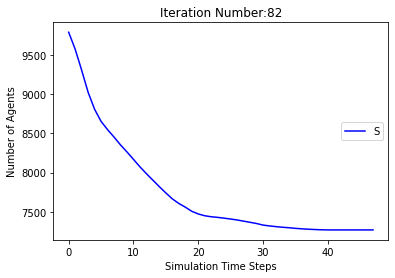

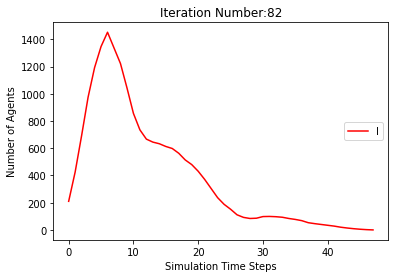

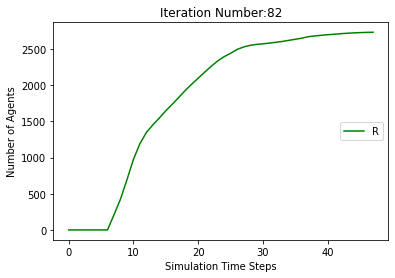

[9790, 9599, 9323, 9045, 8843, 8723, 8644, 8601, 8521, 8450, 8339, 8195, 8062, 7952, 7847, 7735, 7628, 7519, 7416, 7311, 7224, 7150, 7108, 7071, 7047, 7028, 7009, 7005, 7001, 6995, 6987, 6980, 6978, 6976, 6976, 6976, 6976, 6976, 6976, 6976, 6976]
[210, 401, 677, 955, 1157, 1277, 1356, 1189, 1078, 873, 706, 648, 661, 692, 754, 786, 822, 820, 779, 751, 728, 697, 627, 557, 472, 388, 302, 219, 149, 113, 84, 67, 50, 33, 29, 25, 19, 11, 4, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 401, 677, 955, 1157, 1277, 1356, 1399, 1479, 1550, 1661, 1805, 1938, 2048, 2153, 2265, 2372, 2481, 2584, 2689, 2776, 2850, 2892, 2929, 2953, 2972, 2991, 2995, 2999, 3005, 3013, 3020, 3022, 3024]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 80

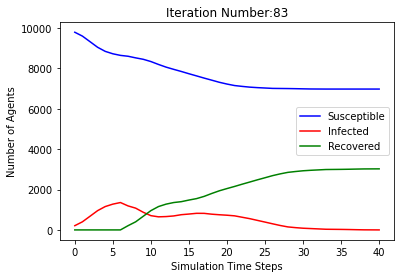

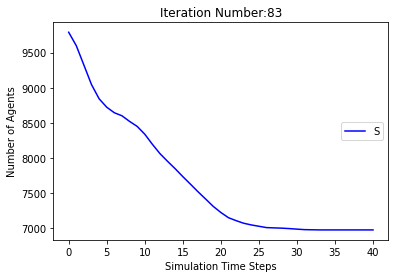

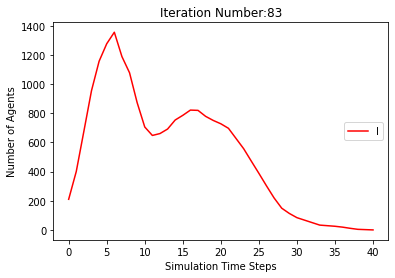

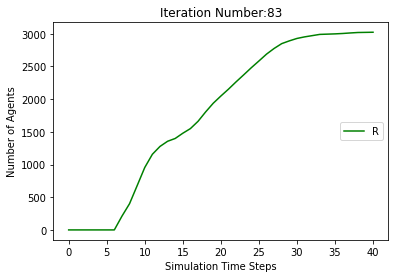

[9790, 9573, 9281, 9003, 8794, 8659, 8547, 8464, 8400, 8333, 8267, 8191, 8100, 7998, 7904, 7813, 7727, 7638, 7580, 7534, 7507, 7458, 7420, 7385, 7363, 7340, 7322, 7302, 7286, 7270, 7258, 7250, 7243, 7235, 7230, 7230, 7230, 7229, 7227, 7226, 7226, 7226, 7226, 7226, 7226, 7226, 7226]
[210, 427, 719, 997, 1206, 1341, 1453, 1326, 1173, 948, 736, 603, 559, 549, 560, 587, 606, 629, 611, 566, 491, 446, 393, 342, 275, 240, 212, 205, 172, 150, 127, 113, 97, 87, 72, 56, 40, 29, 23, 17, 9, 4, 4, 4, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 427, 719, 997, 1206, 1341, 1453, 1536, 1600, 1667, 1733, 1809, 1900, 2002, 2096, 2187, 2273, 2362, 2420, 2466, 2493, 2542, 2580, 2615, 2637, 2660, 2678, 2698, 2714, 2730, 2742, 2750, 2757, 2765, 2770, 2770, 2770, 2771, 2773, 2774]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 

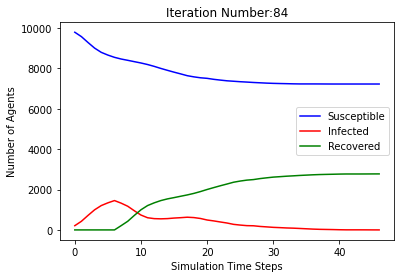

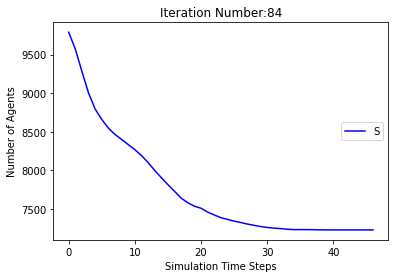

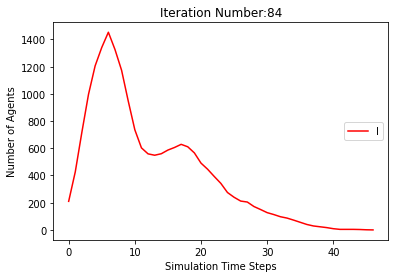

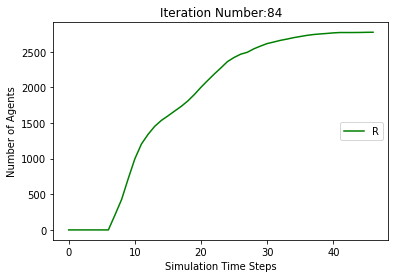

[9790, 9580, 9290, 9008, 8803, 8669, 8549, 8422, 8304, 8174, 8049, 7949, 7845, 7732, 7637, 7548, 7467, 7425, 7373, 7317, 7253, 7202, 7154, 7117, 7094, 7073, 7052, 7037, 7032, 7030, 7027, 7023, 7012, 7004, 7000, 6998, 6995, 6995, 6995, 6995, 6995, 6995, 6995, 6995]
[210, 420, 710, 992, 1197, 1331, 1451, 1368, 1276, 1116, 959, 854, 824, 817, 785, 756, 707, 624, 576, 528, 479, 435, 394, 350, 331, 300, 265, 216, 170, 124, 90, 71, 61, 48, 37, 34, 35, 32, 28, 17, 9, 5, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 420, 710, 992, 1197, 1331, 1451, 1578, 1696, 1826, 1951, 2051, 2155, 2268, 2363, 2452, 2533, 2575, 2627, 2683, 2747, 2798, 2846, 2883, 2906, 2927, 2948, 2963, 2968, 2970, 2973, 2977, 2988, 2996, 3000, 3002, 3005]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 85

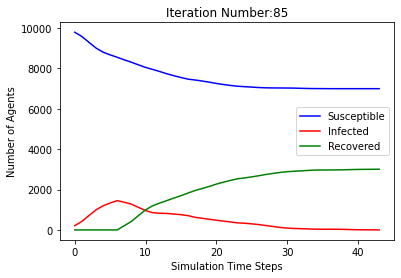

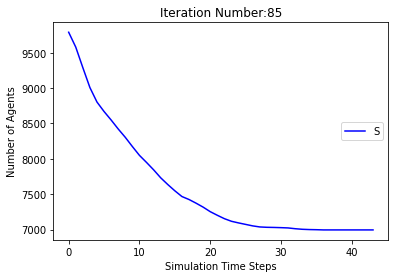

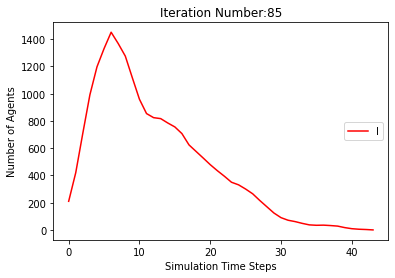

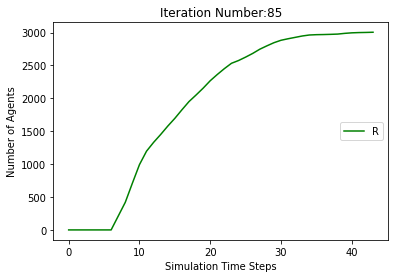

[9790, 9583, 9290, 9031, 8835, 8686, 8584, 8433, 8222, 8038, 7852, 7704, 7578, 7468, 7362, 7250, 7137, 7040, 6947, 6866, 6813, 6760, 6723, 6694, 6666, 6642, 6614, 6589, 6568, 6556, 6542, 6534, 6531, 6530, 6530, 6530, 6530, 6530, 6530, 6530, 6530]
[210, 417, 710, 969, 1165, 1314, 1416, 1357, 1361, 1252, 1179, 1131, 1108, 1116, 1071, 972, 901, 812, 757, 712, 655, 602, 527, 443, 374, 305, 252, 224, 192, 167, 152, 132, 111, 84, 59, 38, 26, 12, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 417, 710, 969, 1165, 1314, 1416, 1567, 1778, 1962, 2148, 2296, 2422, 2532, 2638, 2750, 2863, 2960, 3053, 3134, 3187, 3240, 3277, 3306, 3334, 3358, 3386, 3411, 3432, 3444, 3458, 3466, 3469, 3470]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150,

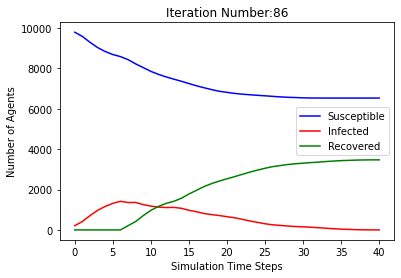

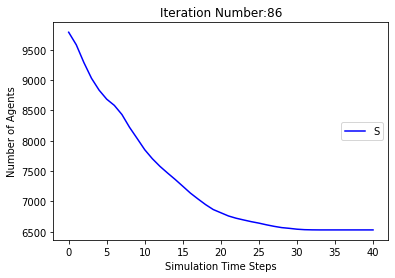

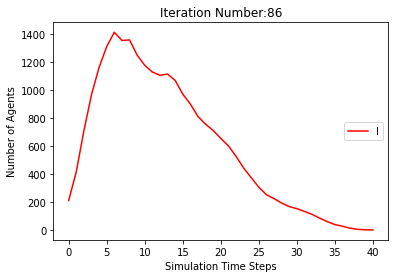

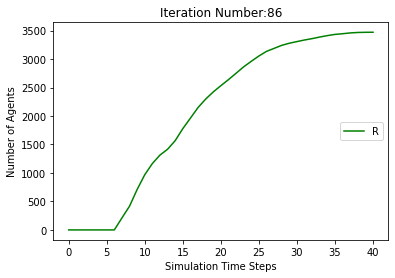

[9790, 9574, 9292, 8997, 8802, 8673, 8572, 8469, 8370, 8264, 8160, 8068, 7971, 7868, 7761, 7672, 7560, 7469, 7377, 7298, 7216, 7159, 7088, 7029, 6955, 6900, 6844, 6807, 6779, 6759, 6741, 6726, 6720, 6712, 6706, 6703, 6703, 6703, 6702, 6701, 6700, 6700, 6700, 6700, 6700, 6700, 6700, 6700]
[210, 426, 708, 1003, 1198, 1327, 1428, 1321, 1204, 1028, 837, 734, 702, 704, 708, 698, 704, 691, 691, 673, 652, 602, 584, 531, 514, 477, 454, 409, 380, 329, 288, 229, 180, 132, 101, 76, 56, 38, 24, 19, 12, 6, 3, 3, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 426, 708, 1003, 1198, 1327, 1428, 1531, 1630, 1736, 1840, 1932, 2029, 2132, 2239, 2328, 2440, 2531, 2623, 2702, 2784, 2841, 2912, 2971, 3045, 3100, 3156, 3193, 3221, 3241, 3259, 3274, 3280, 3288, 3294, 3297, 3297, 3297, 3298, 3299, 3300]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 78

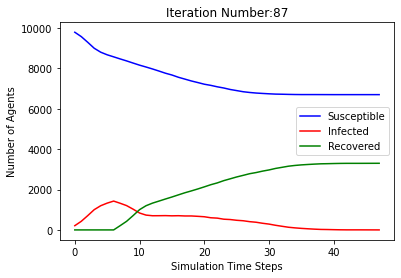

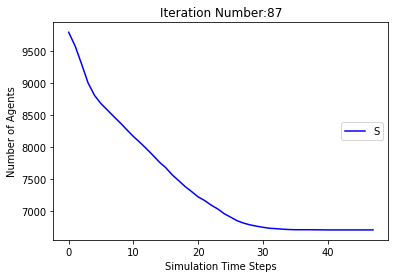

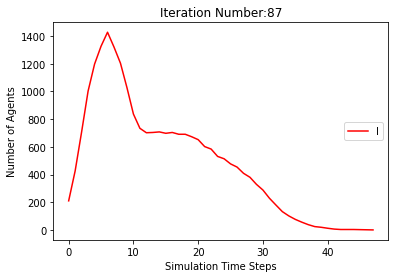

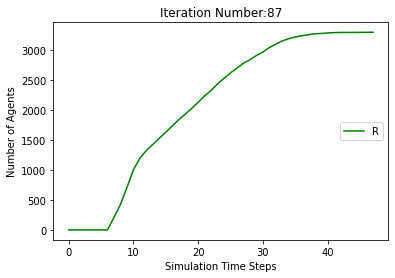

[9790, 9569, 9278, 9003, 8803, 8695, 8611, 8551, 8474, 8415, 8363, 8305, 8240, 8169, 8085, 8004, 7940, 7884, 7839, 7792, 7764, 7736, 7712, 7692, 7670, 7650, 7631, 7609, 7588, 7574, 7555, 7538, 7522, 7510, 7497, 7481, 7470, 7458, 7452, 7448, 7445, 7444, 7444, 7444, 7444, 7444, 7444, 7444, 7444]
[210, 431, 722, 997, 1197, 1305, 1389, 1239, 1095, 863, 640, 498, 455, 442, 466, 470, 475, 479, 466, 448, 405, 349, 292, 248, 214, 189, 161, 155, 148, 138, 137, 132, 128, 121, 112, 107, 104, 97, 86, 74, 65, 53, 37, 26, 14, 8, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 431, 722, 997, 1197, 1305, 1389, 1449, 1526, 1585, 1637, 1695, 1760, 1831, 1915, 1996, 2060, 2116, 2161, 2208, 2236, 2264, 2288, 2308, 2330, 2350, 2369, 2391, 2412, 2426, 2445, 2462, 2478, 2490, 2503, 2519, 2530, 2542, 2548, 2552, 2555, 2556]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 78

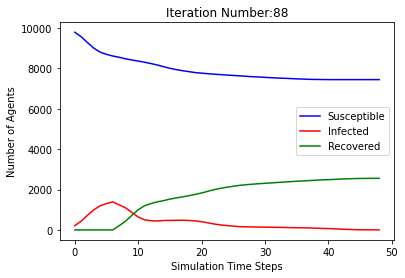

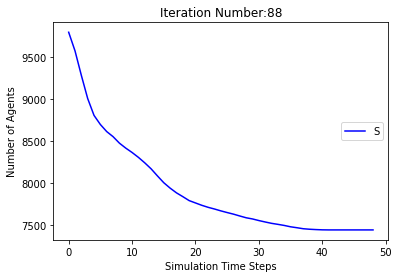

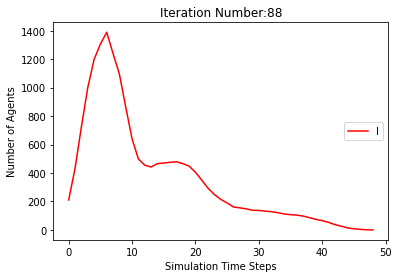

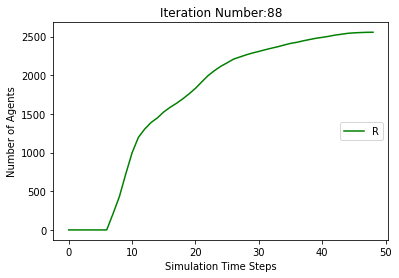

[9790, 9591, 9321, 9037, 8811, 8663, 8551, 8424, 8317, 8242, 8174, 8097, 8020, 7940, 7843, 7763, 7699, 7650, 7610, 7581, 7550, 7515, 7482, 7456, 7437, 7425, 7412, 7404, 7402, 7402, 7402, 7402, 7402, 7402, 7402, 7402]
[210, 409, 679, 963, 1189, 1337, 1449, 1366, 1274, 1079, 863, 714, 643, 611, 581, 554, 543, 524, 487, 439, 390, 328, 281, 243, 213, 185, 169, 146, 113, 80, 54, 35, 23, 10, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 409, 679, 963, 1189, 1337, 1449, 1576, 1683, 1758, 1826, 1903, 1980, 2060, 2157, 2237, 2301, 2350, 2390, 2419, 2450, 2485, 2518, 2544, 2563, 2575, 2588, 2596, 2598]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 796

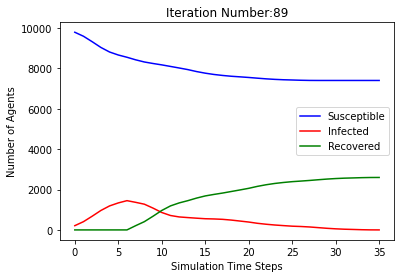

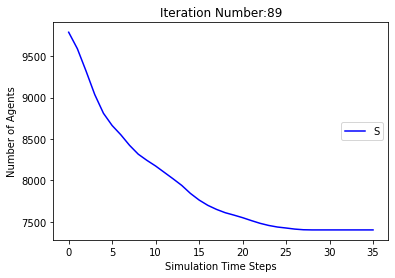

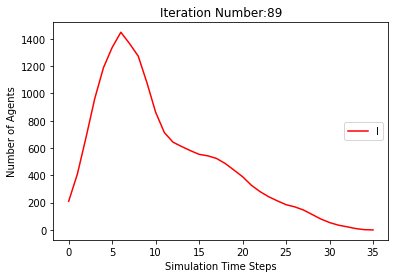

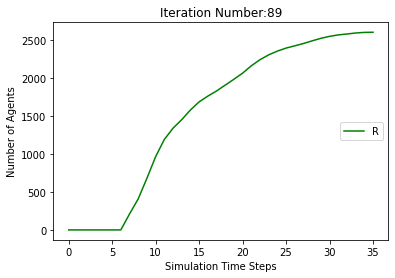

[9790, 9574, 9314, 9038, 8792, 8577, 8393, 8176, 7968, 7757, 7551, 7327, 7113, 6912, 6691, 6448, 6234, 6031, 5884, 5730, 5551, 5392, 5242, 5119, 5017, 4954, 4892, 4846, 4800, 4767, 4735, 4699, 4676, 4662, 4646, 4637, 4628, 4622, 4618, 4617, 4617, 4617, 4617, 4617, 4617, 4617, 4617]
[210, 426, 686, 962, 1208, 1423, 1607, 1614, 1606, 1557, 1487, 1465, 1464, 1481, 1485, 1520, 1523, 1520, 1443, 1383, 1361, 1299, 1206, 1115, 1014, 930, 838, 705, 592, 475, 384, 318, 278, 230, 200, 163, 139, 113, 81, 59, 45, 29, 20, 11, 5, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 426, 686, 962, 1208, 1423, 1607, 1824, 2032, 2243, 2449, 2673, 2887, 3088, 3309, 3552, 3766, 3969, 4116, 4270, 4449, 4608, 4758, 4881, 4983, 5046, 5108, 5154, 5200, 5233, 5265, 5301, 5324, 5338, 5354, 5363, 5372, 5378, 5382, 5383]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872

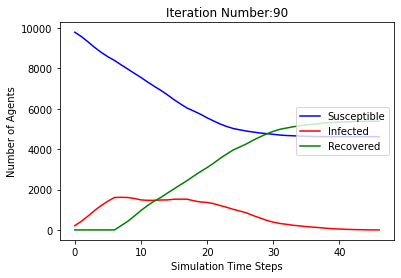

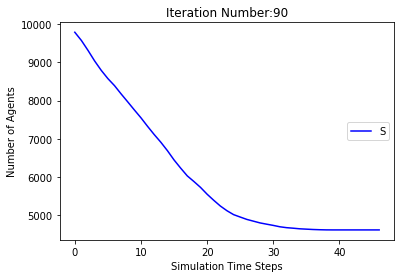

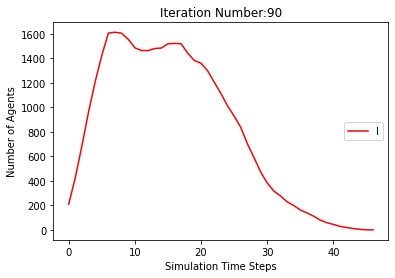

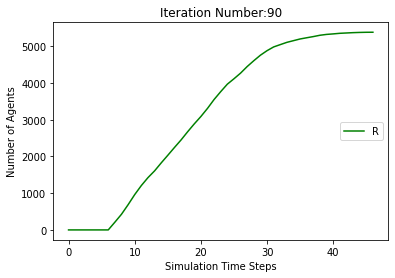

[9790, 9584, 9279, 8991, 8797, 8656, 8556, 8482, 8419, 8367, 8320, 8256, 8190, 8139, 8105, 8084, 8063, 8050, 8039, 8033, 8030, 8025, 8021, 8016, 8015, 8014, 8013, 8009, 8003, 8002, 8001, 8001, 8001, 8001, 8001, 8001, 8001, 8001]
[210, 416, 721, 1009, 1203, 1344, 1444, 1308, 1165, 912, 671, 541, 466, 417, 377, 335, 304, 270, 217, 157, 109, 80, 63, 47, 35, 25, 20, 21, 22, 19, 15, 14, 13, 12, 8, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 416, 721, 1009, 1203, 1344, 1444, 1518, 1581, 1633, 1680, 1744, 1810, 1861, 1895, 1916, 1937, 1950, 1961, 1967, 1970, 1975, 1979, 1984, 1985, 1986, 1987, 1991, 1997, 1998, 1999]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991

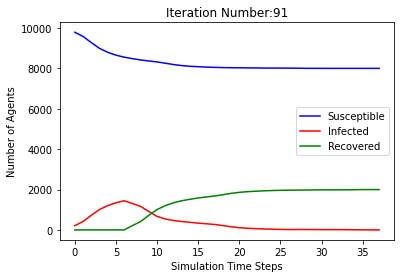

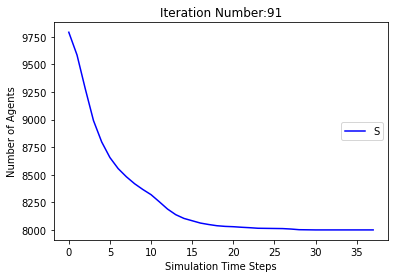

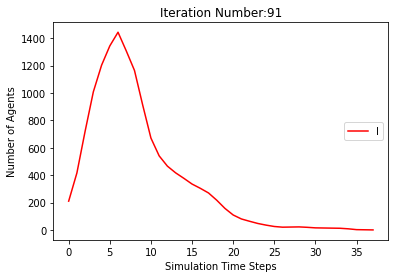

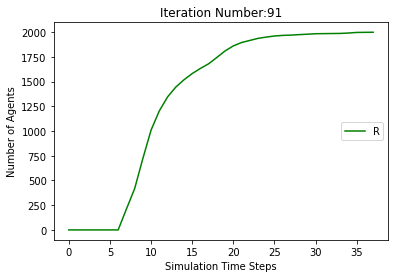

[9790, 9568, 9296, 8999, 8799, 8668, 8560, 8475, 8385, 8319, 8262, 8205, 8148, 8091, 8048, 8017, 7974, 7936, 7911, 7889, 7870, 7858, 7843, 7839, 7833, 7832, 7828, 7827, 7826, 7825, 7825, 7825, 7825, 7825, 7825, 7825, 7825]
[210, 432, 704, 1001, 1201, 1332, 1440, 1315, 1183, 977, 737, 594, 520, 469, 427, 368, 345, 326, 294, 259, 221, 190, 174, 135, 103, 79, 61, 43, 32, 18, 14, 8, 7, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 432, 704, 1001, 1201, 1332, 1440, 1525, 1615, 1681, 1738, 1795, 1852, 1909, 1952, 1983, 2026, 2064, 2089, 2111, 2130, 2142, 2157, 2161, 2167, 2168, 2172, 2173, 2174, 2175]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 

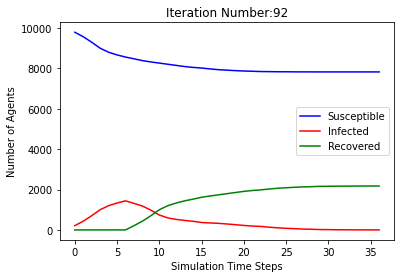

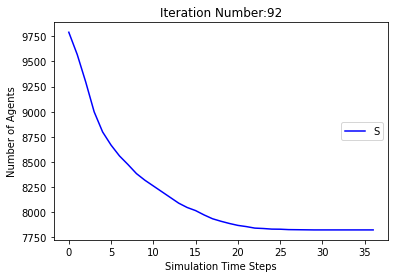

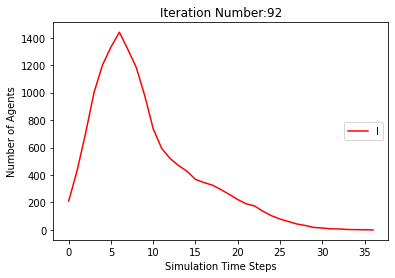

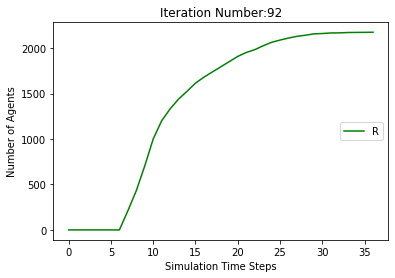

[9790, 9607, 9310, 9007, 8778, 8600, 8453, 8309, 8157, 7997, 7862, 7711, 7567, 7434, 7305, 7174, 7026, 6893, 6741, 6606, 6444, 6294, 6145, 6001, 5859, 5710, 5604, 5492, 5378, 5266, 5161, 5035, 4931, 4814, 4733, 4666, 4602, 4556, 4522, 4501, 4486, 4473, 4462, 4456, 4443, 4435, 4432, 4428, 4427, 4426, 4426, 4425, 4425, 4424, 4424, 4424, 4424, 4424, 4424, 4424, 4424]
[210, 393, 690, 993, 1222, 1400, 1547, 1481, 1450, 1313, 1145, 1067, 1033, 1019, 1004, 983, 971, 969, 970, 961, 990, 1011, 1029, 1025, 1034, 1031, 1002, 952, 916, 879, 840, 824, 779, 790, 759, 712, 664, 605, 513, 430, 328, 260, 204, 146, 113, 87, 69, 58, 46, 36, 30, 18, 10, 8, 4, 3, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 393, 690, 993, 1222, 1400, 1547, 1691, 1843, 2003, 2138, 2289, 2433, 2566, 2695, 2826, 2974, 3107, 3259, 3394, 3556, 3706, 3855, 3999, 4141, 4290, 4396, 4508, 4622, 4734, 4839, 4965, 5069, 5186, 5267, 5334, 5398, 5444, 5478, 5499, 5514, 5527, 5538, 5544, 5557, 5565, 5568, 5572, 5573, 5574, 5574, 5575, 5575

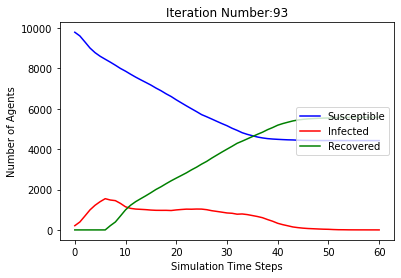

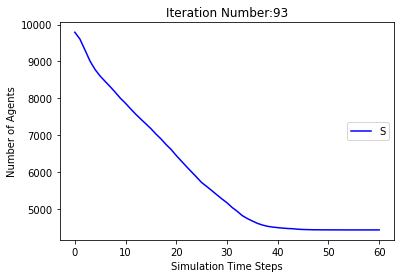

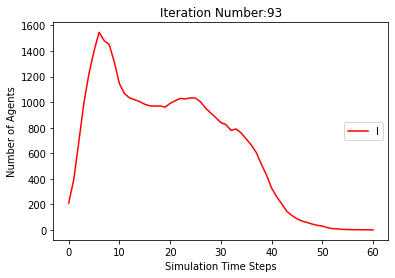

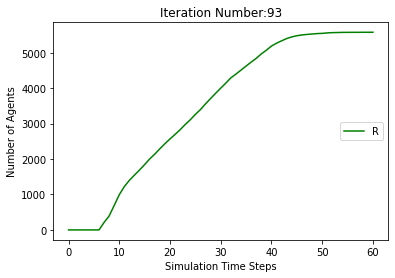

[9790, 9568, 9281, 9013, 8790, 8644, 8551, 8481, 8401, 8302, 8211, 8132, 8040, 7972, 7930, 7894, 7875, 7870, 7865, 7865, 7865, 7865, 7865, 7865, 7865, 7865]
[210, 432, 719, 987, 1210, 1356, 1449, 1309, 1167, 979, 802, 658, 604, 579, 551, 507, 427, 341, 267, 175, 107, 65, 29, 10, 5, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 432, 719, 987, 1210, 1356, 1449, 1519, 1599, 1698, 1789, 1868, 1960, 2028, 2070, 2106, 2125, 2130, 2135]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963], [9790, 9585, 9311, 9047, 8845, 8674, 8545, 8396, 8271, 8182, 8095, 8003, 7895, 7779, 7659, 7544, 7443, 7357, 7288, 7225, 71

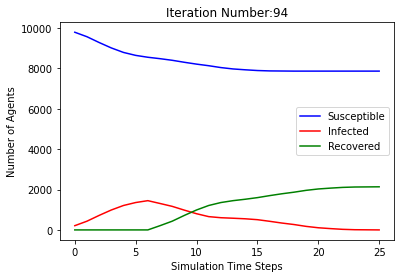

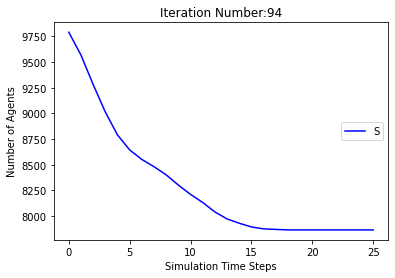

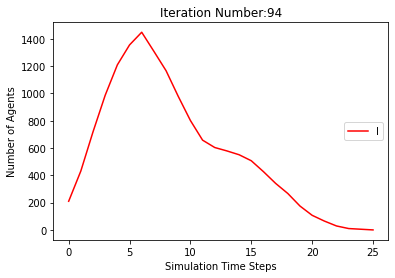

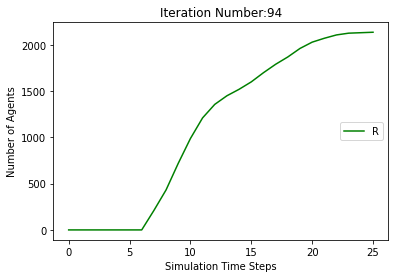

[9790, 9577, 9279, 9016, 8808, 8665, 8581, 8523, 8474, 8413, 8333, 8234, 8144, 8051, 7974, 7902, 7842, 7788, 7748, 7714, 7659, 7609, 7538, 7486, 7428, 7364, 7314, 7258, 7212, 7166, 7123, 7062, 7008, 6965, 6922, 6880, 6851, 6831, 6818, 6809, 6801, 6798, 6796, 6789, 6786, 6780, 6776, 6769, 6764, 6760, 6755, 6752, 6750, 6750, 6749, 6749, 6749, 6749, 6749, 6749, 6749, 6749]
[210, 423, 721, 984, 1192, 1335, 1419, 1267, 1103, 866, 683, 574, 521, 530, 549, 572, 571, 545, 486, 430, 392, 365, 364, 356, 360, 384, 400, 401, 397, 372, 363, 366, 356, 349, 336, 332, 315, 292, 244, 199, 164, 124, 84, 62, 45, 38, 33, 32, 34, 36, 34, 34, 30, 26, 20, 15, 11, 6, 3, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 423, 721, 984, 1192, 1335, 1419, 1477, 1526, 1587, 1667, 1766, 1856, 1949, 2026, 2098, 2158, 2212, 2252, 2286, 2341, 2391, 2462, 2514, 2572, 2636, 2686, 2742, 2788, 2834, 2877, 2938, 2992, 3035, 3078, 3120, 3149, 3169, 3182, 3191, 3199, 3202, 3204, 3211, 3214, 3220, 3224, 3231, 3236, 3240, 3245, 3248, 3250, 

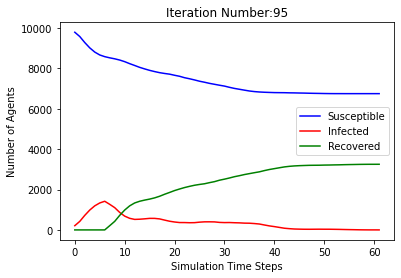

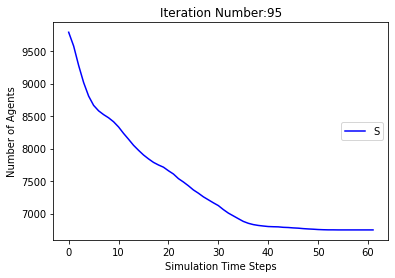

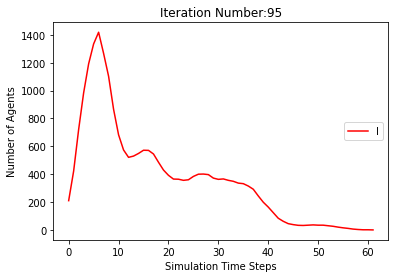

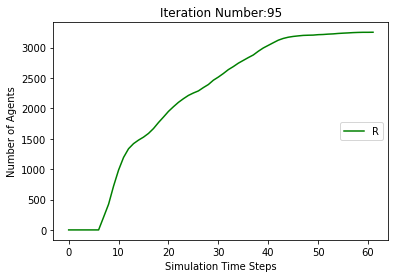

[9790, 9589, 9327, 9046, 8832, 8667, 8546, 8466, 8383, 8317, 8253, 8189, 8134, 8078, 8028, 7995, 7958, 7943, 7929, 7919, 7913, 7907, 7905, 7902, 7896, 7892, 7885, 7878, 7874, 7872, 7869, 7867, 7864, 7862, 7861, 7859, 7856, 7856, 7855, 7854, 7854, 7854, 7854, 7854, 7854, 7854, 7854]
[210, 411, 673, 954, 1168, 1333, 1454, 1324, 1206, 1010, 793, 643, 533, 468, 438, 388, 359, 310, 260, 215, 165, 121, 90, 56, 47, 37, 34, 35, 33, 33, 33, 29, 28, 23, 17, 15, 16, 13, 12, 10, 8, 7, 5, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 411, 673, 954, 1168, 1333, 1454, 1534, 1617, 1683, 1747, 1811, 1866, 1922, 1972, 2005, 2042, 2057, 2071, 2081, 2087, 2093, 2095, 2098, 2104, 2108, 2115, 2122, 2126, 2128, 2131, 2133, 2136, 2138, 2139, 2141, 2144, 2144, 2145, 2146]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9

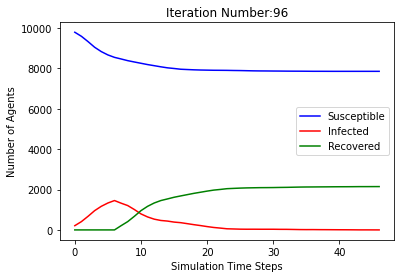

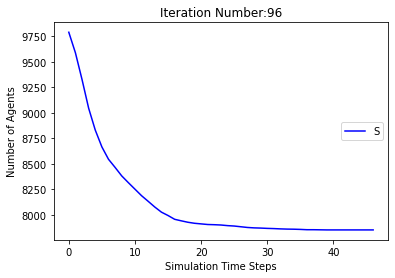

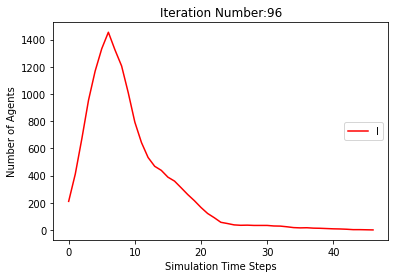

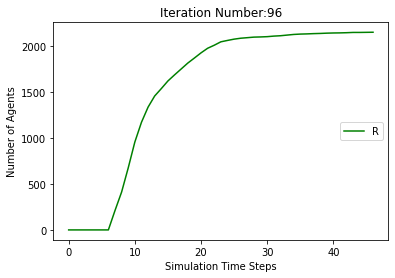

[9790, 9588, 9299, 9019, 8805, 8649, 8514, 8386, 8280, 8186, 8108, 8023, 7952, 7861, 7768, 7685, 7621, 7566, 7525, 7499, 7470, 7426, 7388, 7350, 7323, 7303, 7288, 7281, 7273, 7270, 7268, 7268, 7268, 7268, 7268, 7268, 7268, 7268]
[210, 412, 701, 981, 1195, 1351, 1486, 1404, 1308, 1113, 911, 782, 697, 653, 618, 595, 565, 542, 498, 453, 391, 342, 297, 271, 243, 222, 211, 189, 153, 118, 82, 55, 35, 20, 13, 5, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 412, 701, 981, 1195, 1351, 1486, 1614, 1720, 1814, 1892, 1977, 2048, 2139, 2232, 2315, 2379, 2434, 2475, 2501, 2530, 2574, 2612, 2650, 2677, 2697, 2712, 2719, 2727, 2730, 2732]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7

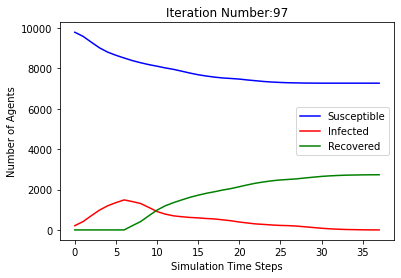

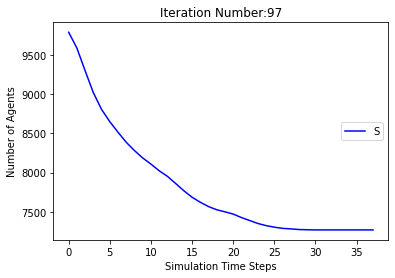

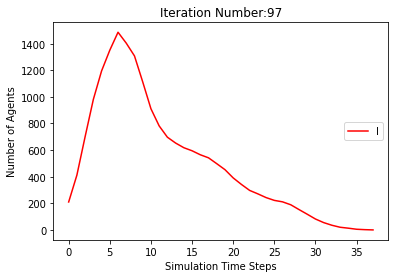

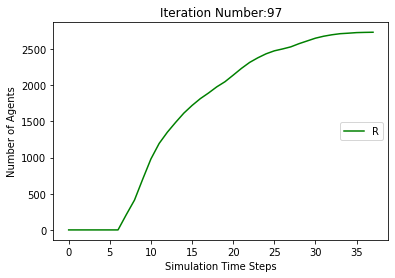

[9790, 9590, 9295, 9013, 8797, 8628, 8506, 8384, 8281, 8167, 8063, 7963, 7861, 7736, 7633, 7561, 7511, 7472, 7431, 7399, 7360, 7335, 7308, 7288, 7275, 7268, 7262, 7257, 7256, 7256, 7256, 7256, 7256, 7256, 7256, 7256]
[210, 410, 705, 987, 1203, 1372, 1494, 1406, 1309, 1128, 950, 834, 767, 770, 751, 720, 656, 591, 532, 462, 376, 298, 253, 223, 197, 163, 137, 103, 79, 52, 32, 19, 12, 6, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 410, 705, 987, 1203, 1372, 1494, 1616, 1719, 1833, 1937, 2037, 2139, 2264, 2367, 2439, 2489, 2528, 2569, 2601, 2640, 2665, 2692, 2712, 2725, 2732, 2738, 2743, 2744]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963,

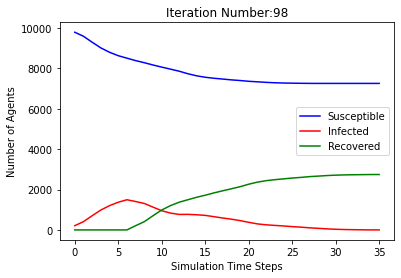

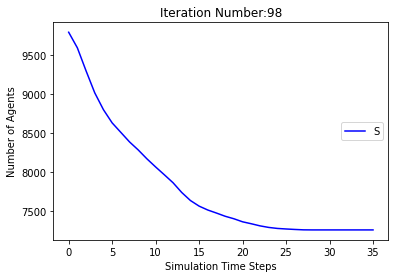

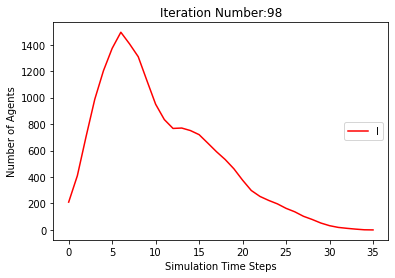

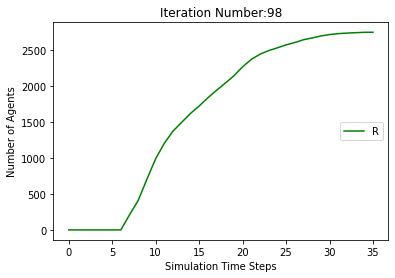

[9790, 9599, 9349, 9077, 8827, 8670, 8580, 8515, 8461, 8402, 8333, 8268, 8198, 8126, 8072, 8018, 7961, 7902, 7850, 7814, 7785, 7770, 7760, 7757, 7757, 7757, 7757, 7757, 7757, 7757, 7757]
[210, 401, 651, 923, 1173, 1330, 1420, 1275, 1138, 947, 744, 559, 472, 454, 443, 443, 441, 431, 418, 384, 341, 302, 258, 204, 145, 93, 57, 28, 13, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 401, 651, 923, 1173, 1330, 1420, 1485, 1539, 1598, 1667, 1732, 1802, 1874, 1928, 1982, 2039, 2098, 2150, 2186, 2215, 2230, 2240, 2243]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 8080, 8062, 8051, 8042, 8028, 8021, 8013, 8007, 7998, 7991, 7983, 7973, 7968, 7963, 7963, 7963, 7963, 7963, 7963, 7963, 7963], [9790, 9585, 9311, 9047, 8845, 8674, 85

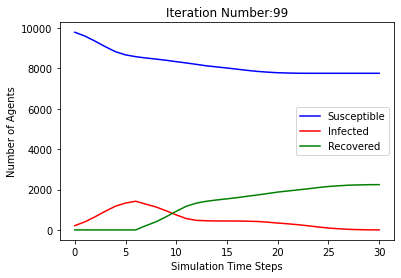

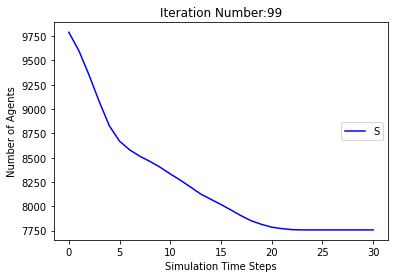

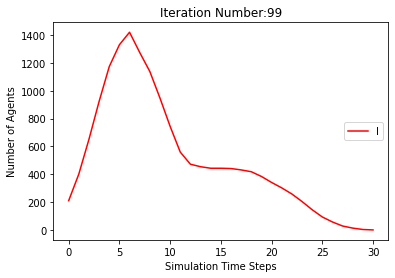

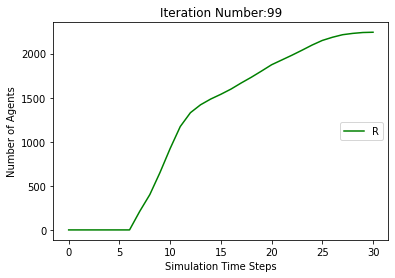

[9790, 9596, 9316, 9025, 8802, 8657, 8489, 8374, 8270, 8199, 8142, 8061, 7986, 7892, 7784, 7688, 7592, 7489, 7416, 7355, 7309, 7252, 7215, 7188, 7173, 7166, 7156, 7152, 7150, 7145, 7141, 7139, 7136, 7131, 7131, 7131, 7131, 7131, 7131, 7131, 7131]
[210, 404, 684, 975, 1198, 1343, 1511, 1416, 1326, 1117, 883, 741, 671, 597, 590, 582, 607, 653, 645, 631, 583, 532, 473, 404, 316, 250, 199, 157, 102, 70, 47, 34, 30, 25, 21, 19, 14, 10, 8, 5, 0]
[0, 0, 0, 0, 0, 0, 0, 210, 404, 684, 975, 1198, 1343, 1511, 1626, 1730, 1801, 1858, 1939, 2014, 2108, 2216, 2312, 2408, 2511, 2584, 2645, 2691, 2748, 2785, 2812, 2827, 2834, 2844, 2848, 2850, 2855, 2859, 2861, 2864, 2869]
[[], [9790, 9583, 9281, 8978, 8761, 8649, 8552, 8484, 8419, 8359, 8274, 8210, 8143, 8090, 8037, 8006, 7981, 7957, 7936, 7914, 7904, 7899, 7897, 7891, 7885, 7882, 7881, 7879, 7876, 7875, 7874, 7873, 7872, 7872, 7872, 7872, 7872, 7872, 7872, 7872], [9790, 9590, 9304, 9035, 8816, 8654, 8537, 8467, 8401, 8327, 8258, 8200, 8150, 8110, 80

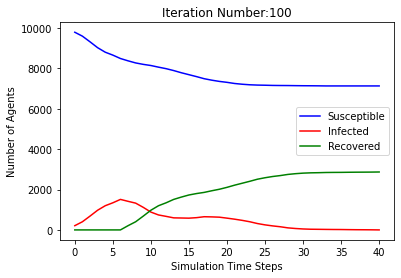

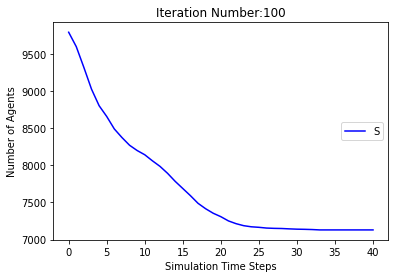

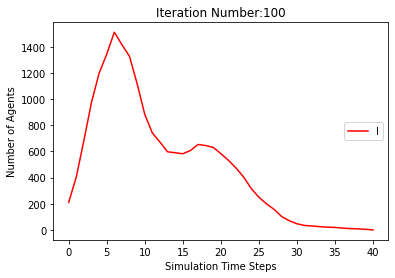

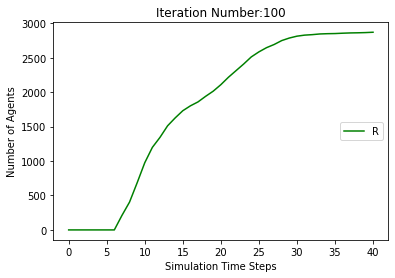

In [10]:
SS,II,RR,TT = [[]],[[]],[[]],[[]]
for i in range(100):
  j=0
  Node_p=Node.copy()
  Node_n=Node.copy() 
  Agent_p=Agent.copy()
  Agent_n=Agent.copy()
  Sj,Ij,Rj = Count_SIR_Node(Node_n) 
  #print([Sj,Ij,Rj]) 
  S,I,R,T = [],[],[],[]
  S.append(Sj)
  I.append(Ij)
  R.append(Rj)
  T.append(j)

  while Ij > 0 :
    Node_p,Node_n,Agent_p,Agent_n = random_walk(Graph,GraphN,Node_n,Agent_n,1,1)
    j+=1 
    Sj,Ij,Rj = Count_SIR_Node(Node_n) 
    S.append(Sj)
    I.append(Ij)
    R.append(Rj)
    T.append(j)
    
  print(S)
  print(I)
  print(R)
  SS.append(S)
  II.append(I)
  RR.append(R)
  TT.append(T)
  print(SS)
  print(II)
  print(RR)
  plt.plot(T, S, 'b', T, I, 'r', T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Susceptible", "Infected", "Recovered"),loc='center right')
  plt.show()  
  
  plt.plot(T, S, 'b')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Susceptible"),loc='center right')
  plt.show()

  plt.plot(T, I, 'r')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Infected"),loc='center right')
  plt.show()

  plt.plot(T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Recovered"),loc='center right')
  plt.show()  

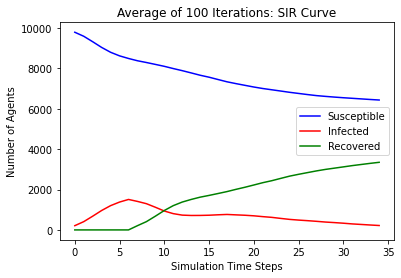

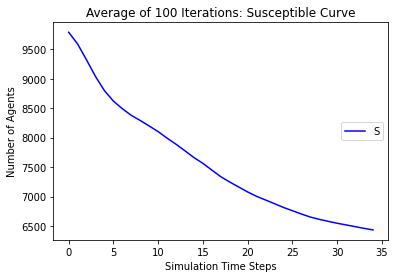

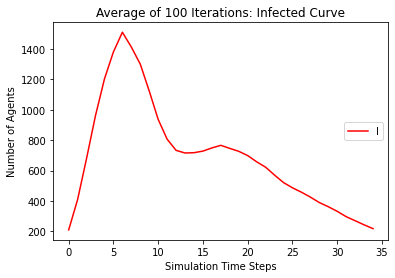

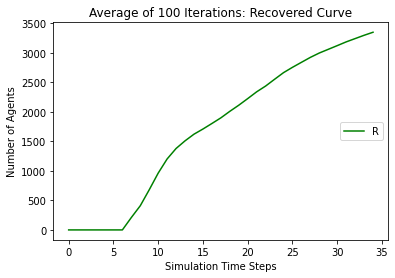

In [11]:
from statistics import mean
SC = SS[1]
IC = II[1]
RC = RR[1]
TC = TT[1]
for i in range(2,10):
  SC = [mean(i) for i in zip(SC,SS[i])] 
  IC = [mean(i) for i in zip(IC,II[i])] 
  RC = [mean(i) for i in zip(RC,RR[i])] 
  TC = [mean(i) for i in zip(TC,TT[i])] 

plt.plot(TC, SC, 'b', TC, IC, 'r', TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: SIR Curve')
plt.ylabel('Number of Agents')
plt.legend(("Susceptible", "Infected", "Recovered"),loc='center right')
plt.show()  
  
plt.plot(TC, SC, 'b')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Susceptible Curve')
plt.ylabel('Number of Agents')
plt.legend(("Susceptible"),loc='center right')
plt.show()

plt.plot(TC, IC, 'r')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Infected Curve')
plt.ylabel('Number of Agents')
plt.legend(("Infected"),loc='center right')
plt.show()

plt.plot(TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Recovered Curve')
plt.ylabel('Number of Agents')
plt.legend(("Recovered"),loc='center right')
plt.show()  


  
